# start

In [155]:
import os
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

In [156]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

# Get a list of all the subdirectories: subfolders are viewed as cell names
cell_names = [f for f in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, f))]
# for cell in cell_names:
#     print(cell)

# Create a dictionary with default values
default_value = 0
cell_data_dict = {cell: default_value for cell in cell_names}
# print(cell_data_dict)

file_suffixes = ['green_Axon.mat', 'green_dFFMeanValues.mat', 'red_dFFMeanValues.mat']

for cell in cell_names:
    print(cell)
    file_names = [cell + suffix for suffix in file_suffixes]

    path_ = file_names[0] # green_Axon.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    axons = mat_data['Axons'] # array containing nested arrays/sub-arrays
    # Squeeze the outer array
    axons = np.squeeze(axons, axis=0)
    for i in range(len(axons)):
        # Squeeze the inner array and convert the data type to 'int'
        axons[i] = np.squeeze(axons[i].astype(int), axis=0)
    # final axons' length is the number of groups with
    # each elements being a nested array of components

    path_ = file_names[1] # green_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_green = mat_data['dFFMeanValues'] # 3 by 49

    path_ = file_names[2] # red_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_red = mat_data['dFFMeanValues'] # 3 by 49

    cell_data_dict[cell] = {'axons': axons,
                'green_dFFMeanValues': dFFMeanValues_green,
                'red_dFFMeanValues': dFFMeanValues_red}

# # Print keys and types
# for key, value in cell_data_dict.items():
#     print("-- * * * * * --")
#     print(key, type(value))
#     for key_, value_ in value.items():
#         print(key_, type(value_))
# print("-- * * * * * --")

CL090_230515
CL090_230518
CL083_230413
CL075_230303


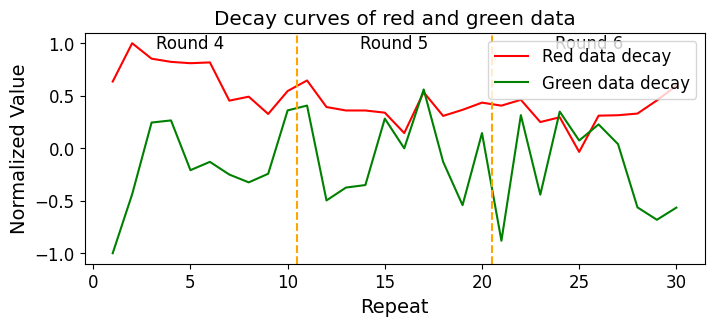

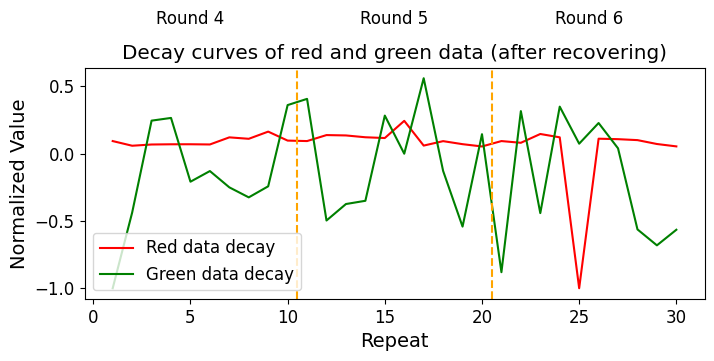

(1440, 80) 1440
(1440, 14) (14,)
(1440, 1) 1440
27.44283678657392 -9.505092954427656
31.275825474492894 -21.081477842636513


In [157]:
# cell_data = cell_data_dict['CL090_230515']
cell_data = cell_data_dict['CL075_230303']

delete_small_group = False # delete groups (axons) with less than 3 components

data_green = cell_data['green_dFFMeanValues'][:,:-1] # exclude 49th column
data_red = cell_data['red_dFFMeanValues'][:,:-1] # exclude 49th column
data_axons = cell_data['axons']

# sum red data to see the decay
sum_mat_red = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_red[0,0].shape[0], 1))
    for j in range(data_red.shape[1]):
        sum = sum + data_red[i,j]
    # print(np.sum(sum))
    sum_mat_red[i, 0] = sum
# print(sum_mat_red)

# Normalization of red
sum_mat_red_n = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_red[i, j])))
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        element = sum_mat_red[i, j]
        sum_mat_red_n[i, j] = element / max_value
# print(sum_mat_red_n.shape)

# vstack sum_mat_red_n
stacked_sum_mat_red_n = np.empty((0, sum_mat_red_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_red_n):
    stacked_sum_mat_red_n = np.vstack((stacked_sum_mat_red_n, value))
stacked_sum_mat_red_n = np.squeeze(stacked_sum_mat_red_n)
# print(stacked_sum_mat_red_n.shape)


# sum green data to see the decay
sum_mat_green = np.zeros((data_green.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_green[0,0].shape[0], 1))
    for j in range(data_green.shape[1]):
        sum = sum + np.sum(data_green[i,j], axis=1, keepdims=True)
    # print(np.sum(sum))
    sum_mat_green[i, 0] = sum
# print(sum_mat_green)

# Normalization of green
sum_mat_green_n = np.zeros((data_green.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_green.shape[0]):
    for j in range(sum_mat_green.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_green[i, j])))
for i in range(sum_mat_green.shape[0]):
    for j in range(sum_mat_green.shape[1]):
        element = sum_mat_green[i, j]
        sum_mat_green_n[i, j] = element / max_value
# print(sum_mat_green_n.shape)

# vstack sum_mat_green_n
stacked_sum_mat_green_n = np.empty((0, sum_mat_green_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_green_n):
    stacked_sum_mat_green_n = np.vstack((stacked_sum_mat_green_n, value))
stacked_sum_mat_green_n = np.squeeze(stacked_sum_mat_green_n)
# print(stacked_sum_mat_green_n.shape)


# plot stacked_sum_mat_red_n and stacked_sum_mat_green_n
x = np.arange(1, stacked_sum_mat_green_n.shape[0] + 1)
fig, ax = plt.subplots(figsize=(8, 3))  # Adjust the figure size as desired
ax.plot(x, stacked_sum_mat_red_n, color='red', label='Red data decay')
ax.plot(x, stacked_sum_mat_green_n, color='green', label='Green data decay')
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, 1, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, 1, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, 1, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Decay curves of red and green data')
ax.tick_params(axis='both', labelsize=12)  # Adjust the tick size as desired
ax.set_xlabel('Repeat', fontsize=14)  # Adjust the label size as desired
ax.set_ylabel('Normalized Value', fontsize=14)  # Adjust the label size as desired
ax.legend()
plt.show()


# Define the exponential function for regression of decay
def exponential_func(x, lambda_):
    return np.exp(lambda_ * x)
red_recover_factor = sum_mat_red_n.copy()
for i in range(sum_mat_red_n.shape[0]):
    for j in range(sum_mat_red_n.shape[1]):
        y = sum_mat_red_n[i, j]
        y = np.squeeze(y)
        multiplier = 1 / y[0]
        y = y * multiplier
        x = np.arange(10)
        popt, pcov = curve_fit(exponential_func, x, y)
        lambda_ = popt[0]
        # print(i,j,lambda_)
        y_fit = exponential_func(x, lambda_)
        y = y.reshape(-1, 1)
        y_fit = y_fit.reshape(-1, 1)
        red_recover_factor[i, j] = (y_fit / y) / sum_mat_red_n[i, j]
# print(red_recover_factor.shape)

for i in range(data_red.shape[0]):
    for j in range(data_red.shape[1]):
        data_red[i,j] = red_recover_factor[i,0] * data_red[i,j]

# sum red data to see the decay
sum_mat_red = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_red[0,0].shape[0], 1))
    for j in range(data_red.shape[1]):
        sum = sum + data_red[i,j]
    # print(np.sum(sum))
    sum_mat_red[i, 0] = sum
# print(sum_mat_red)

# Normalization of red
sum_mat_red_n = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_red[i, j])))
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        element = sum_mat_red[i, j]
        sum_mat_red_n[i, j] = element / max_value
# print(sum_mat_red_n.shape)

# vstack sum_mat_red_n
stacked_sum_mat_red_n = np.empty((0, sum_mat_red_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_red_n):
    stacked_sum_mat_red_n = np.vstack((stacked_sum_mat_red_n, value))
stacked_sum_mat_red_n = np.squeeze(stacked_sum_mat_red_n)
# print(stacked_sum_mat_red_n.shape)


# plot stacked_sum_mat_red_n and stacked_sum_mat_green_n
x = np.arange(1, stacked_sum_mat_green_n.shape[0] + 1)
fig, ax = plt.subplots(figsize=(8, 3))  # Adjust the figure size as desired
ax.plot(x, stacked_sum_mat_red_n, color='red', label='Red data decay')
ax.plot(x, stacked_sum_mat_green_n, color='green', label='Green data decay')
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, 1, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, 1, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, 1, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Decay curves of red and green data (after recovering)')
ax.tick_params(axis='both', labelsize=12)  # Adjust the tick size as desired
ax.set_xlabel('Repeat', fontsize=14)  # Adjust the label size as desired
ax.set_ylabel('Normalized Value', fontsize=14)  # Adjust the label size as desired
ax.legend()
plt.show()





# print(data_axons)
# print(type(data_axons),len(data_axons))
if delete_small_group:
    data_axons = np.array([axons_ for axons_ in data_axons if len(axons_) >= 3], dtype=object)
# print(data_axons)
# print(type(data_axons),len(data_axons))

# vstack green data
stacked_green = np.empty((0, data_green[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_green):
    stacked_green = np.vstack((stacked_green, value))
print(stacked_green.shape, 48*3*10)

# group columns of green data
group_num = data_axons.shape[0]
group_satcked_green = np.zeros((stacked_green.shape[0], group_num))
for i, cols in enumerate(data_axons):
    group_satcked_green[:, i] = np.sum(stacked_green[:, cols-1], axis=1)
print(group_satcked_green.shape, data_axons.shape)

# vstack red data
stacked_red = np.empty((0, data_red[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_red):
    stacked_red = np.vstack((stacked_red, value))
print(stacked_red.shape, 48*3*10)

print(np.max(group_satcked_green), np.min(group_satcked_green))
print(np.max(stacked_red), np.min(stacked_red))


In [158]:
# run 4
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run4.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run4 = mat_data['Master_dFF_mean']
pupil_area_run4 = pupil_area_run4[:, :-1]
print(type(pupil_area_run4[0,1]))
print(pupil_area_run4[0,1].shape)
# sum red data to see the decay
sum_mat_pupil_run4 = np.zeros((pupil_area_run4.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run4.shape[0]):
    sum = np.zeros((pupil_area_run4[0,0].shape[0], 1))
    for j in range(pupil_area_run4.shape[1]):
        sum = sum + pupil_area_run4[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run4[i, 0] = sum

# run 5
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run5.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run5 = mat_data['Master_dFF_mean']
pupil_area_run5 = pupil_area_run5[:, :-1]
print(type(pupil_area_run5[0,1]))
print(pupil_area_run5[0,1].shape)
# sum red data to see the decay
sum_mat_pupil_run5 = np.zeros((pupil_area_run5.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run5.shape[0]):
    sum = np.zeros((pupil_area_run5[0,0].shape[0], 1))
    for j in range(pupil_area_run5.shape[1]):
        sum = sum + pupil_area_run5[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run5[i, 0] = sum

# run 6
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run6.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run6 = mat_data['Master_dFF_mean']
pupil_area_run6 = pupil_area_run6[:, :-1]
print(type(pupil_area_run6[0,1]))
print(pupil_area_run6[0,1].shape)
# sum red data to see the decay
sum_mat_pupil_run6 = np.zeros((pupil_area_run6.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run6.shape[0]):
    sum = np.zeros((pupil_area_run6[0,0].shape[0], 1))
    for j in range(pupil_area_run6.shape[1]):
        sum = sum + pupil_area_run6[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run6[i, 0] = sum

<class 'numpy.ndarray'>
(10, 1)


### Logistic regression

In [159]:
import os
import numpy as np
import scipy.io
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error, r2_score
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from IPython.display import clear_output
import random
import sys

In [160]:
def plot_comparison(y_test, y_pred, subtitle = ''):
    # Sort y_pred and y_test based on y_test
    sorted_indices = np.argsort(y_test)
    sorted_y_pred = y_pred[sorted_indices]
    sorted_y_test = y_test[sorted_indices]
    # Plot sorted_y_pred and sorted_y_test
    plt.plot(sorted_y_pred, label='Sorted Predictions')
    plt.plot(sorted_y_test, label='Sorted Ground Truth')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparison of Sorted Predictions and Sorted Ground Truth \n ({subtitle})')
    plt.legend()
    plt.savefig(f'Comparison ({subtitle}).png', bbox_inches='tight')
    # bbox_inches='tight' will adjust the figure's bounding box to fit all the content, ensuring that
    # the complete words are visible in the saved figure. Otherwise, the saved figure may not show the
    # complete words, e.g., for x-label, or for the long title.
    # The default setting can sometimes result in cutoff or clipped text. It tries to include the entire
    # figure within the saved image, but there may be cases where the default behavior is not sufficient
    # to capture all the content. The default behavior assumes the figure content fits within the predefined
    # margins and padding.
    plt.show()

#### Divide train and val datasets

In [161]:
# independent data
x = group_satcked_green

class_num = 480

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))


x_train shape: (1368, 14)
y_train shape: (1368,)
x_test shape: (72, 14)
y_test shape: (72,)
Unique elements: [  0  36  40  81  86  99 103 106 109 112 140 144 145 147 156 161 169 171
 172 175 180 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 207 208 211 230 236 252 253 258 263 268 271
 285 294 310 332 383 392 480]
Number of unique elements: 61


#### Fit and predict

'multinomial' (default option for multi-calss) achieves better performance than 'ovr'.

In [162]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
# model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='ovr')

fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)
# print("Coefficients:", model.coef_[0,:])
# print("Intercept:", model.intercept_[0])
print('--- --- ---')

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)

print('y_prob.shape:', y_prob.shape)
print(np.sum(y_prob, axis = 1))
# print(y_prob[0,:])

# Print the predicted class labels
print('y_pred:', y_pred)
print('y_test:', y_test)
print('y_pred shape:', y_pred.shape, 'y_test shape:', y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(61,) (61, 14)
--- --- ---
y_prob.shape: (72, 61)
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
y_pred: [193 193 193 193 193 193 193 193 193 193 193 193 194 193 193 193 193 193
 193 192 193 193 193 193 193 199 193 193 193 193 193 193 193 193 193 193
 193 193 193 193 193 193 193 193 193 193 193 193 193 195 193 193 193 193
 193 193 193 193 193 193 193 193 193 193 193 193 193 193 193 193 193 194]
y_test: [193 201 193 192 193 136 194 196 193 193 193 193 199 193 193 193 187 193
 196 190 194 194 193 192 193 194 194 193 193 192 193 194 193 193 189 192
 192 193 193 193 193 192 193 194 195 193 193 193 193 194 192 194 194 193
 193 193 193 193 239 193 196 193 193 193 193 195 192 192 193 194 193 193]
y_pred shape: (72,) y_test shape: (72,)


#### Evaluate

##### Evaluate (normal)

In previous data division, I classify data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results with the same number of classes (e.g., class_num = 160).

Accuracy: 0.5416666666666666
Mean squared error: 77.63888888888889
Correlation coefficient: 0.033873603339914266
Coefficient of determination (R-squared score, R2 score): -0.001674933487968433


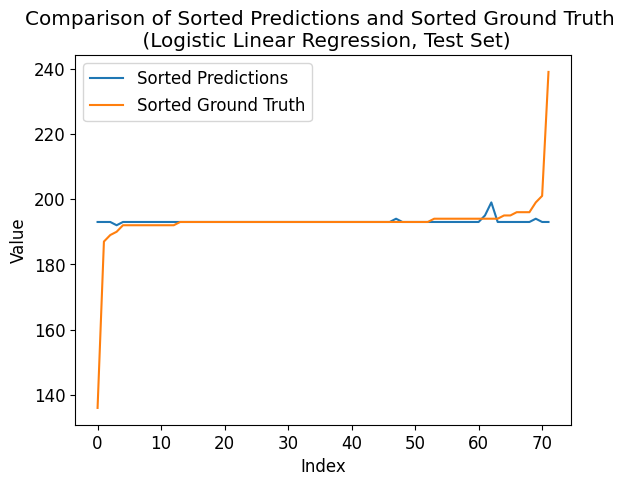

In [163]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_test, y_pred)
# print("Confusion Matrix:") # y_test doesn't include all classes, so confusion matrix is less than num_class by num_class
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)


# Sort y_pred and y_test based on y_test
plot_comparison(y_test, y_pred, 'Logistic Linear Regression, Test Set')

Accuracy: 0.5029239766081871
Mean squared error: 342.1301169590643
Correlation coefficient: 0.29760773747343355
Coefficient of determination (R-squared score, R2 score): 0.0009415627115494374


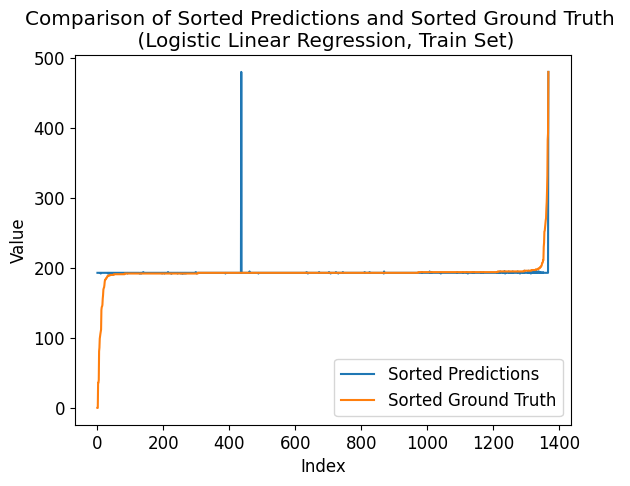

In [164]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_train, y_pred_)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Logistic Linear Regression, Train Set')

##### Evaluate (reduced)

The model is based on classifying data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results a smaller number of classes (e.g., reduced_class_num = 16), that is, for the example of class_num = 160 and reduced_class_num = 16, classes 0, 1, ..., 15 become one class, i.e., 0; ...; classes 144, 145, ..., 159 become one class, i.e., 15.

In [165]:
print("---- ---- ----")
# Define the boundaries for digitization
reduced_class_num = 16
intervals = np.arange(0, class_num + 1, class_num / reduced_class_num)
print(intervals)

y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
print(y_pred)
print(y_pred_test_digital)
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
[193 193 193 193 193 193 193 193 193 193 193 193 194 193 193 193 193 193
 193 192 193 193 193 193 193 199 193 193 193 193 193 193 193 193 193 193
 193 193 193 193 193 193 193 193 193 193 193 193 193 195 193 193 193 193
 193 193 193 193 193 193 193 193 193 193 193 193 193 193 193 193 193 194]
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Fixing the reduced class number, I enumerate the original class number to see what a original class number is better.

x_train shape: (1368, 14)
y_train shape: (1368,)
x_test shape: (72, 14)
y_test shape: (72,)
---- ---- ----
class_num = 16
Number of unique elements: 15
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


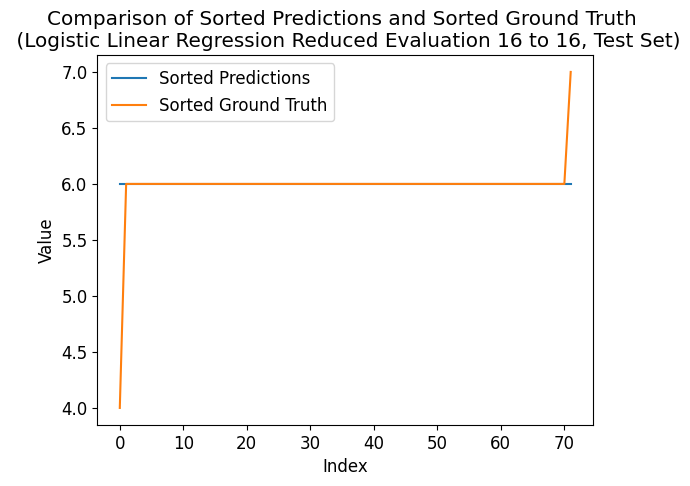

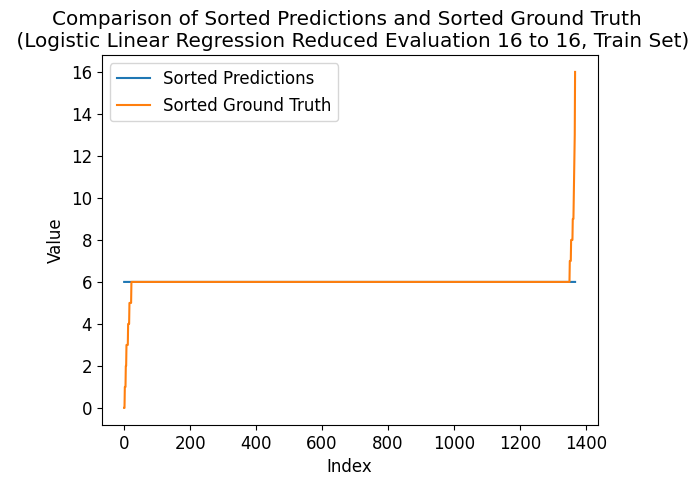

---- ---- ----
class_num = 32
Number of unique elements: 21
[ 0.  2.  4.  6.  8. 10. 12. 14. 16. 18. 20. 22. 24. 26. 28. 30. 32.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


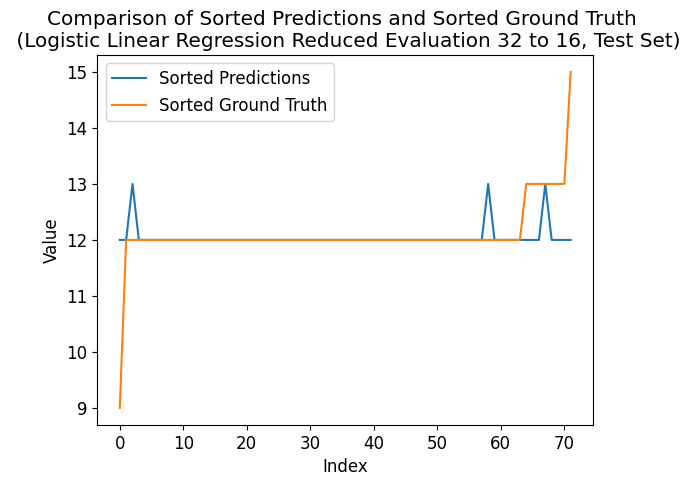

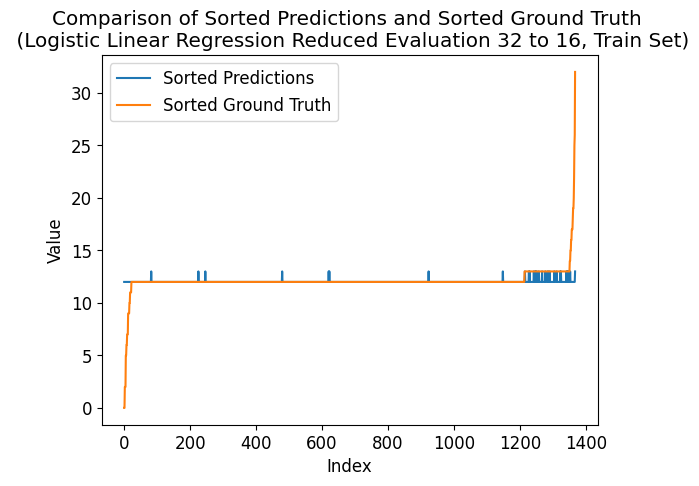

---- ---- ----
class_num = 48
Number of unique elements: 26
[ 0.  3.  6.  9. 12. 15. 18. 21. 24. 27. 30. 33. 36. 39. 42. 45. 48.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


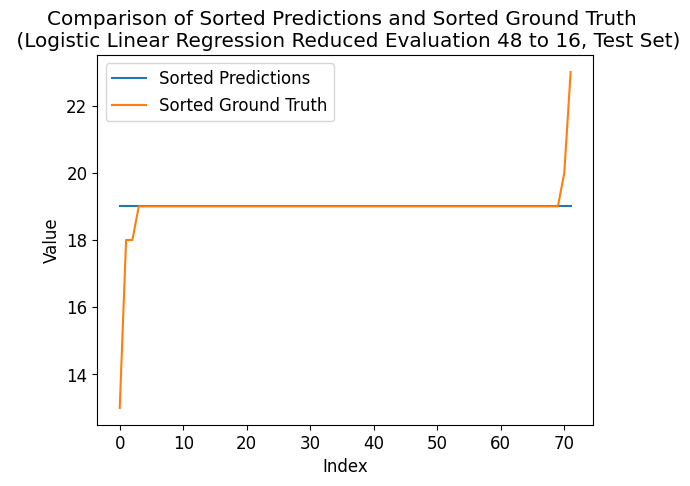

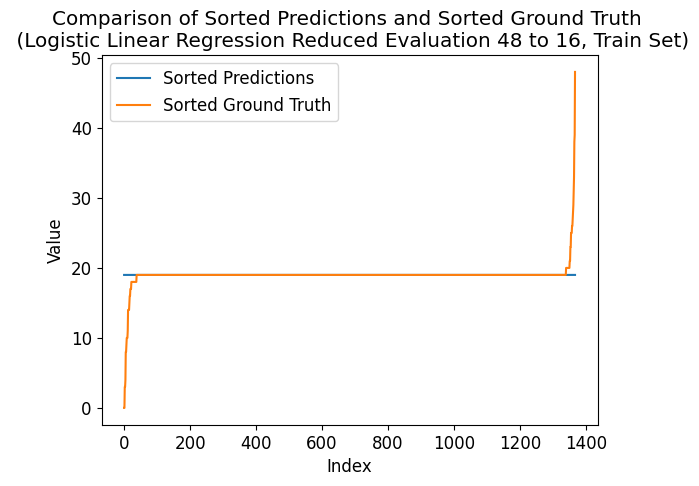

---- ---- ----
class_num = 64
Number of unique elements: 31
[ 0.  4.  8. 12. 16. 20. 24. 28. 32. 36. 40. 44. 48. 52. 56. 60. 64.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


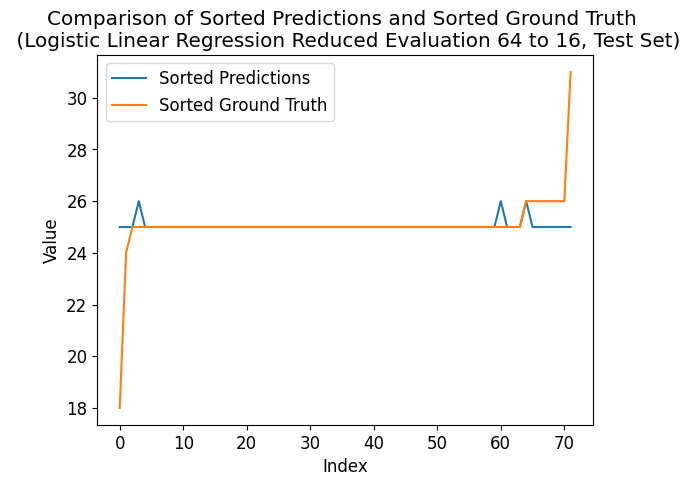

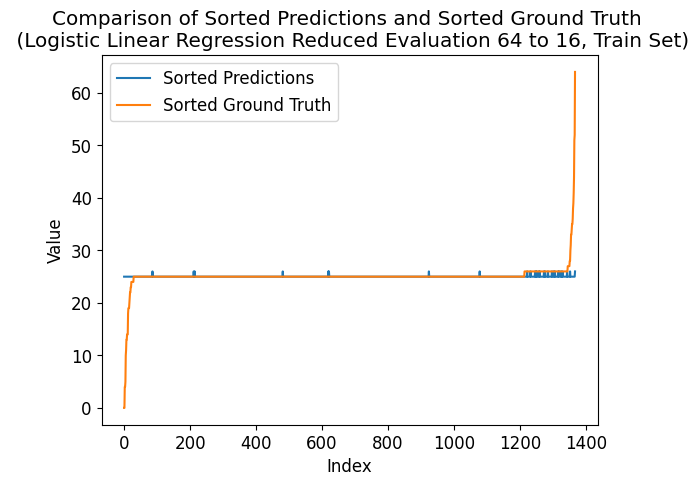

---- ---- ----
class_num = 80
Number of unique elements: 31
[ 0.  5. 10. 15. 20. 25. 30. 35. 40. 45. 50. 55. 60. 65. 70. 75. 80.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


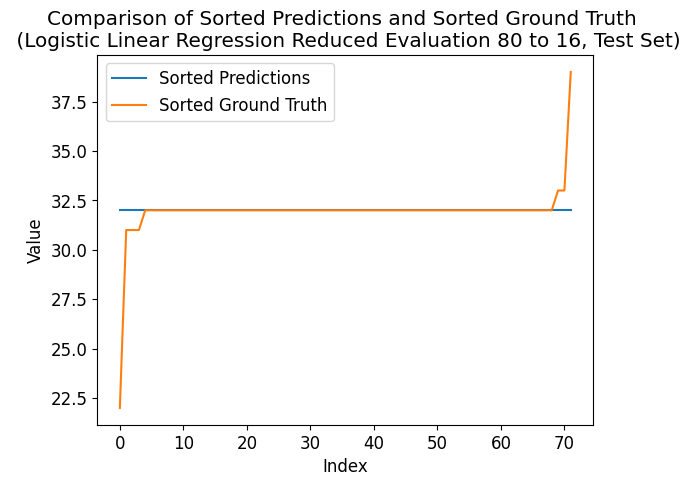

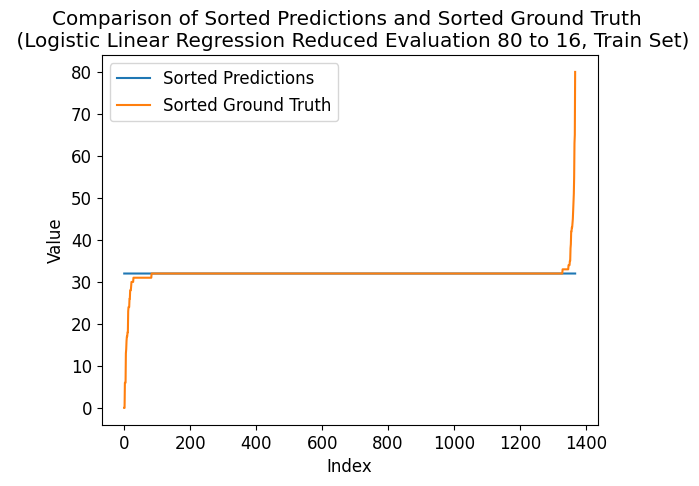

---- ---- ----
class_num = 96
Number of unique elements: 37
[ 0.  6. 12. 18. 24. 30. 36. 42. 48. 54. 60. 66. 72. 78. 84. 90. 96.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


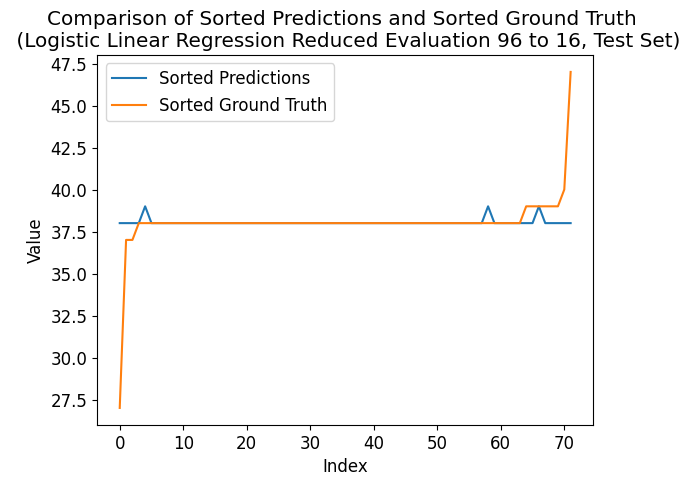

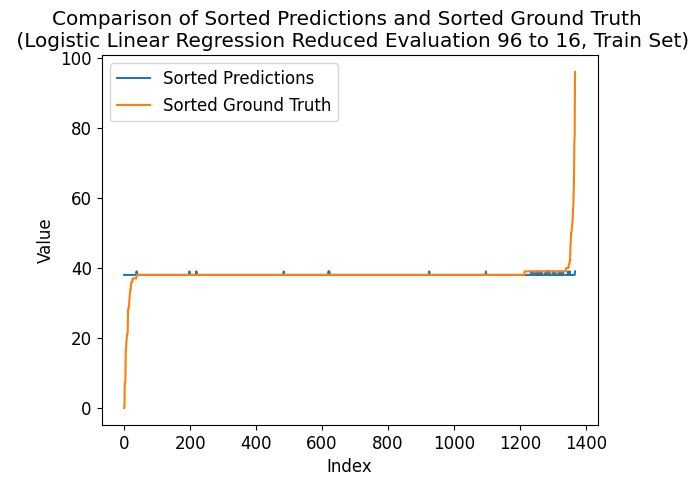

---- ---- ----
class_num = 112
Number of unique elements: 40
[  0.   7.  14.  21.  28.  35.  42.  49.  56.  63.  70.  77.  84.  91.
  98. 105. 112.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


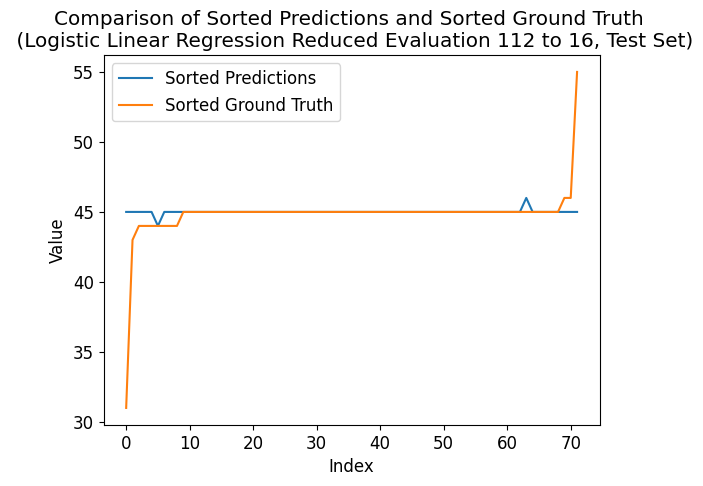

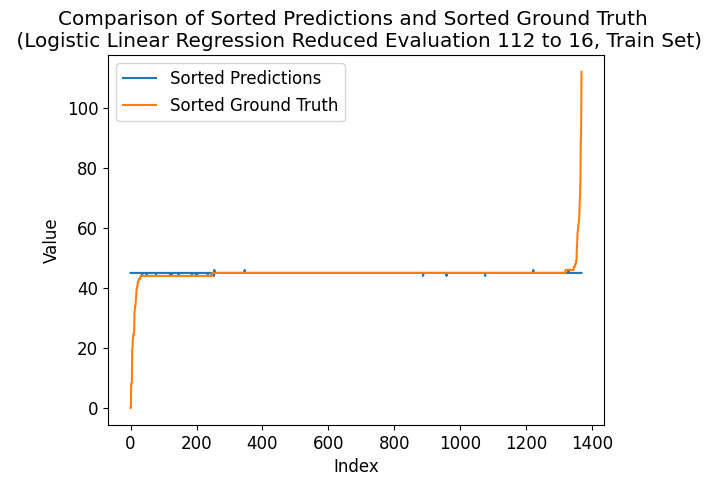

---- ---- ----
class_num = 128
Number of unique elements: 39
[  0.   8.  16.  24.  32.  40.  48.  56.  64.  72.  80.  88.  96. 104.
 112. 120. 128.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


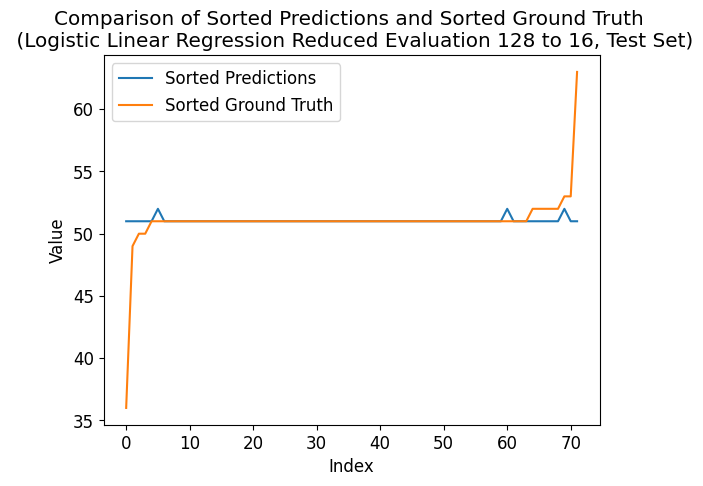

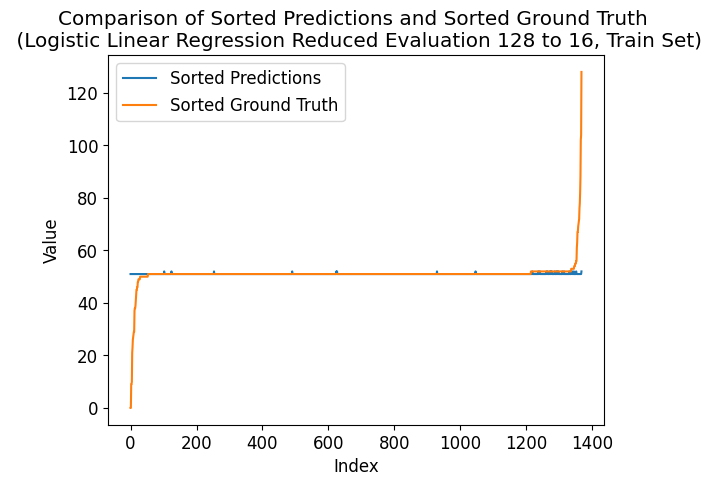

---- ---- ----
class_num = 144
Number of unique elements: 44
[  0.   9.  18.  27.  36.  45.  54.  63.  72.  81.  90.  99. 108. 117.
 126. 135. 144.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


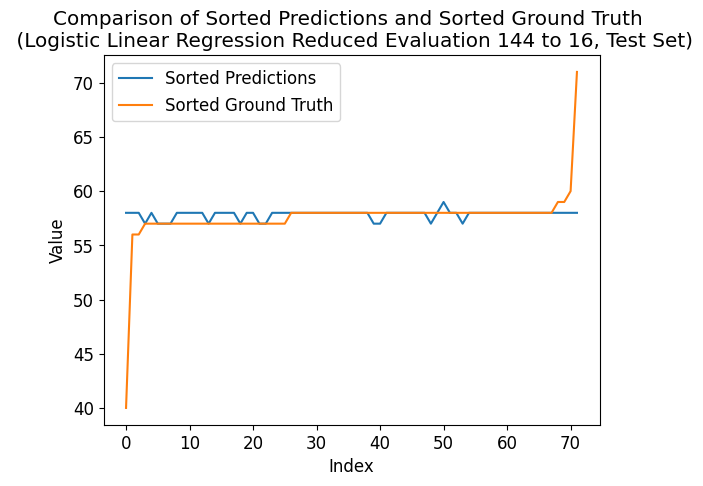

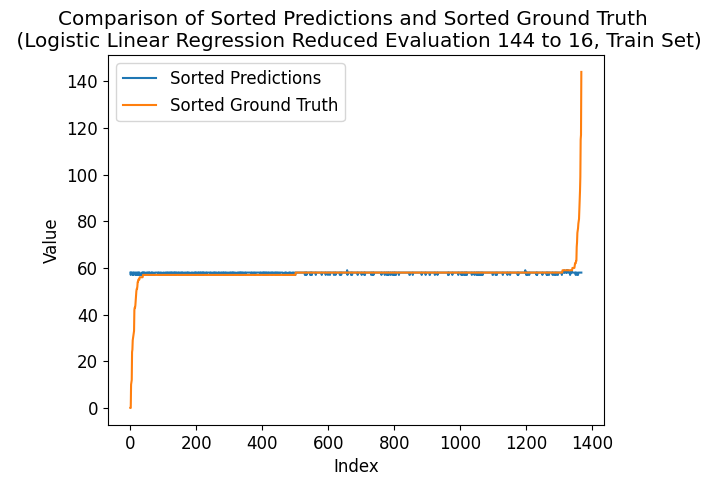

---- ---- ----
class_num = 160
Number of unique elements: 43
[  0.  10.  20.  30.  40.  50.  60.  70.  80.  90. 100. 110. 120. 130.
 140. 150. 160.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


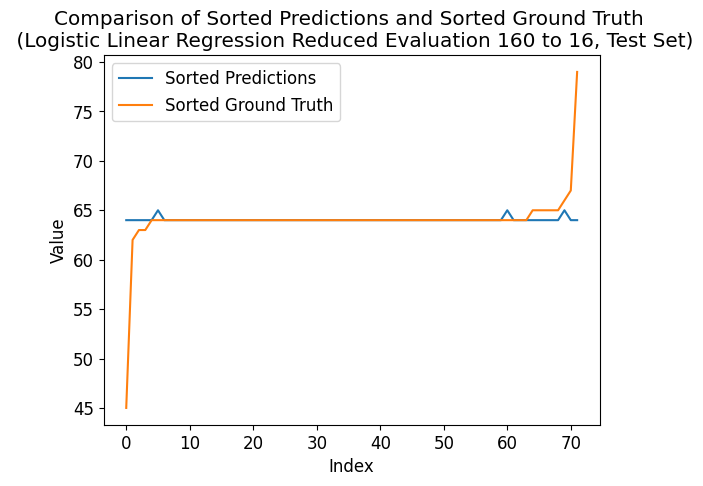

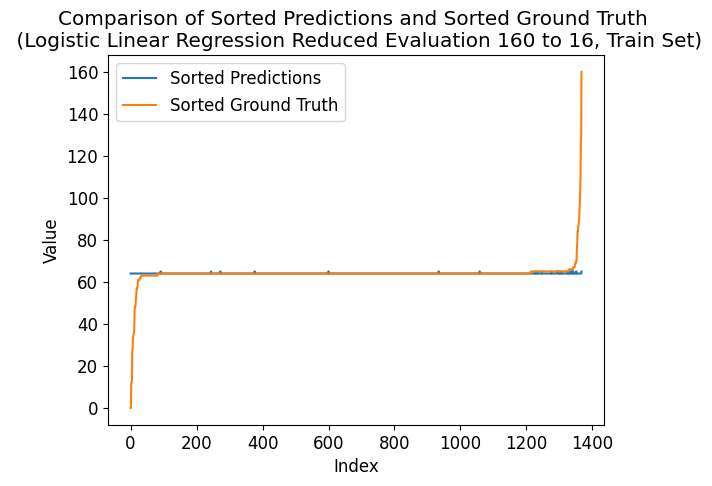

---- ---- ----
class_num = 176
Number of unique elements: 43
[  0.  11.  22.  33.  44.  55.  66.  77.  88.  99. 110. 121. 132. 143.
 154. 165. 176.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


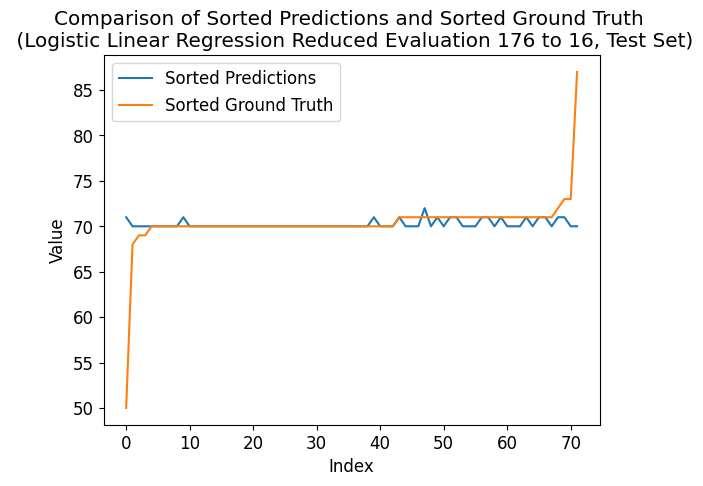

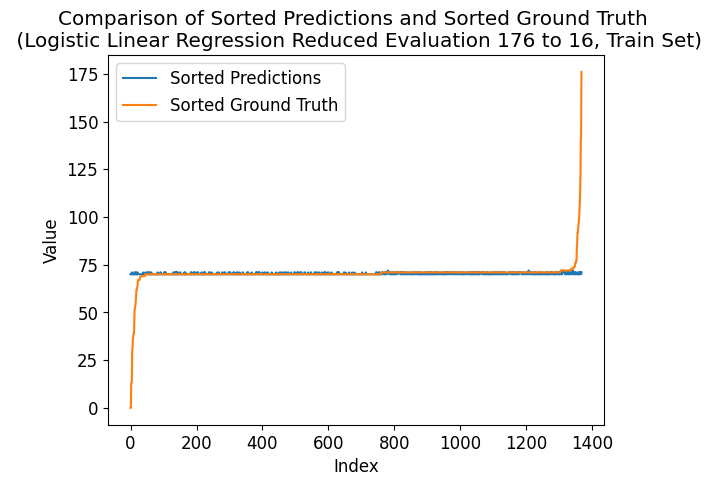

---- ---- ----
class_num = 192
Number of unique elements: 46
[  0.  12.  24.  36.  48.  60.  72.  84.  96. 108. 120. 132. 144. 156.
 168. 180. 192.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


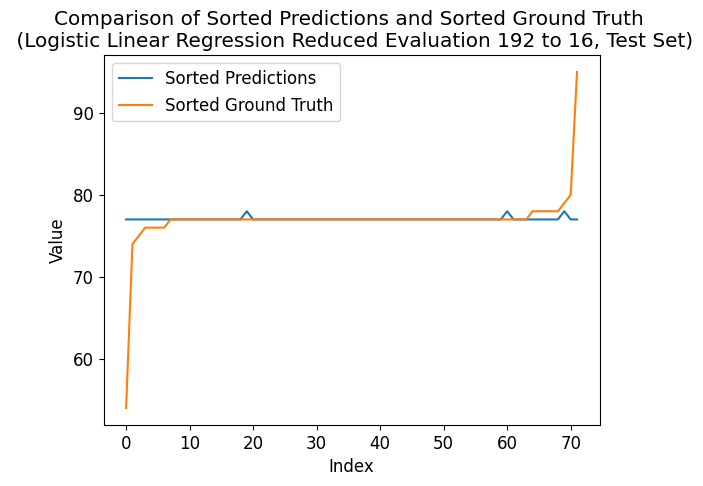

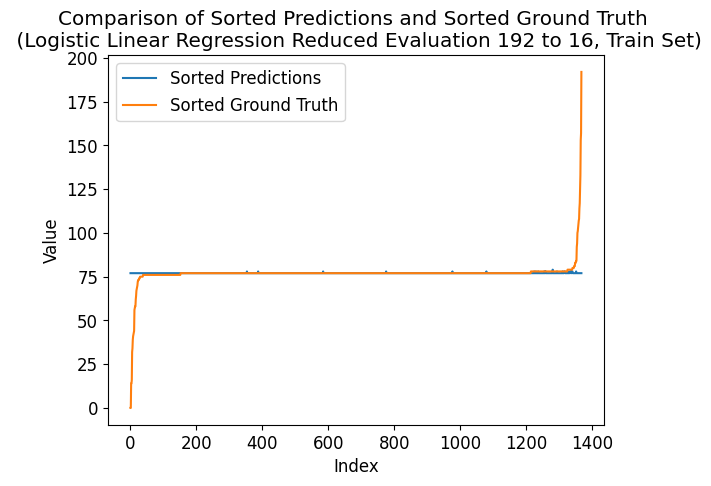

---- ---- ----
class_num = 208
Number of unique elements: 47
[  0.  13.  26.  39.  52.  65.  78.  91. 104. 117. 130. 143. 156. 169.
 182. 195. 208.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


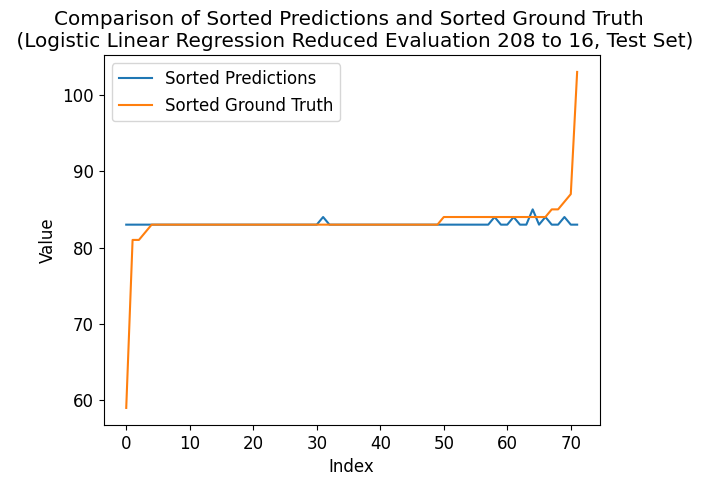

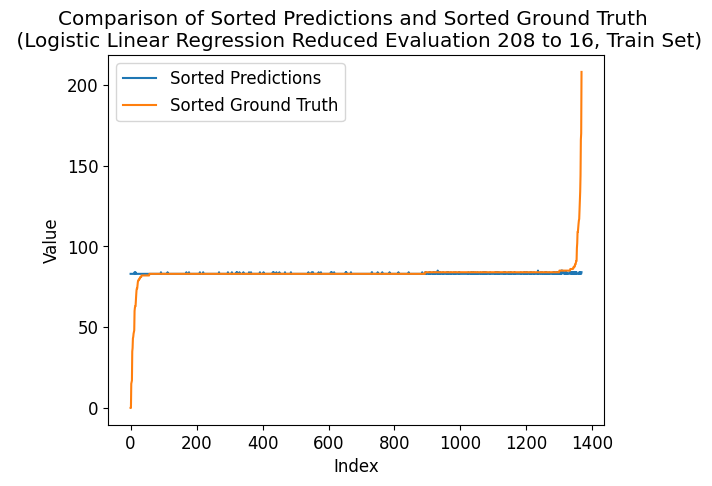

---- ---- ----
class_num = 224
Number of unique elements: 49
[  0.  14.  28.  42.  56.  70.  84.  98. 112. 126. 140. 154. 168. 182.
 196. 210. 224.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


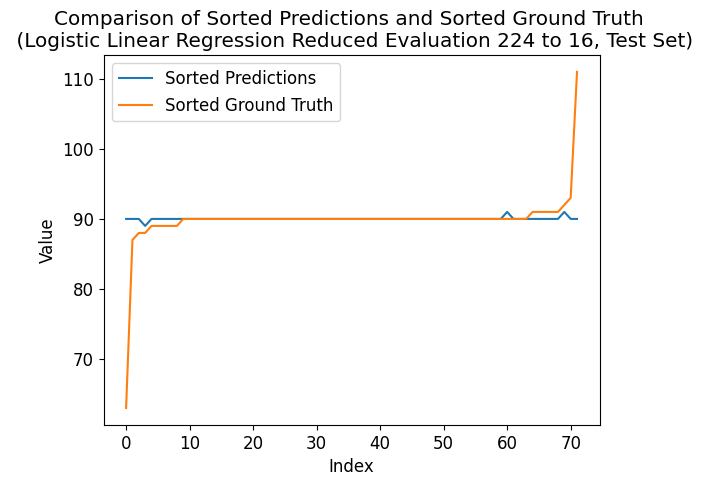

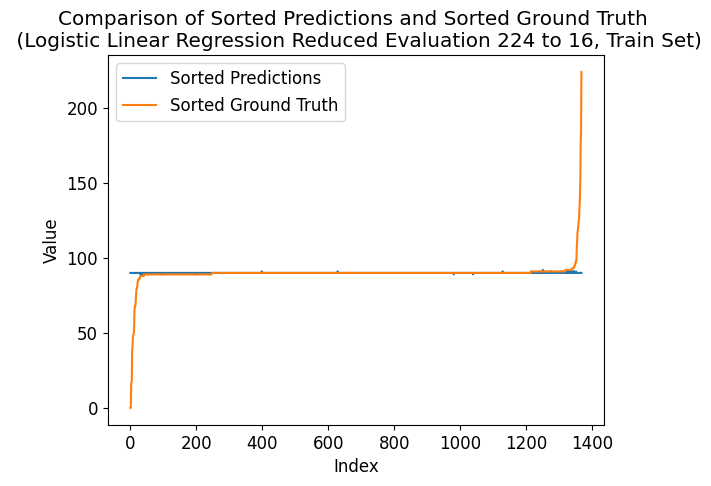

---- ---- ----
class_num = 240
Number of unique elements: 49
[  0.  15.  30.  45.  60.  75.  90. 105. 120. 135. 150. 165. 180. 195.
 210. 225. 240.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


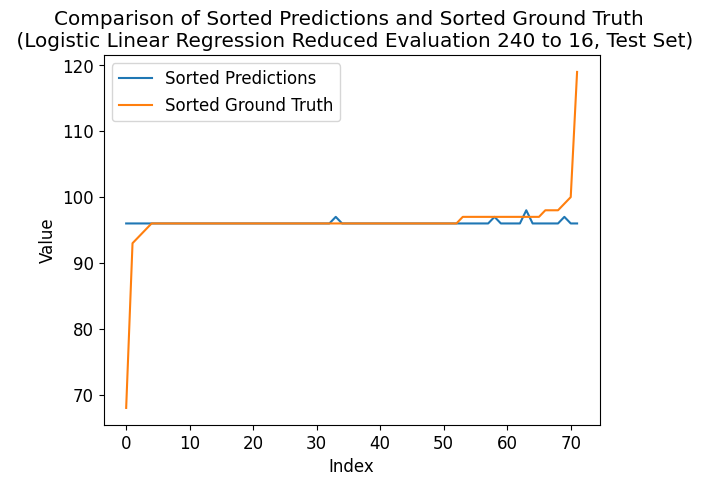

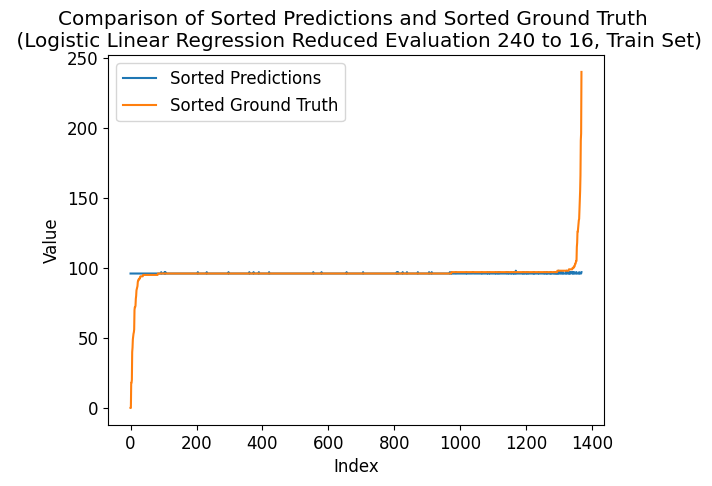

---- ---- ----
class_num = 256
Number of unique elements: 52
[  0.  16.  32.  48.  64.  80.  96. 112. 128. 144. 160. 176. 192. 208.
 224. 240. 256.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


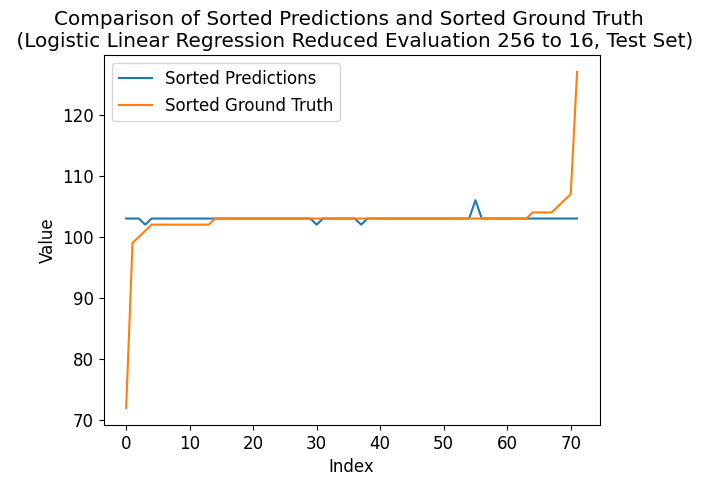

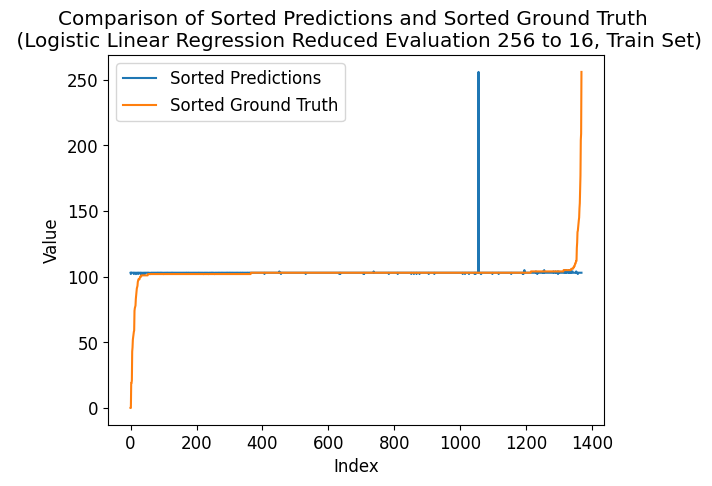

---- ---- ----
class_num = 272
Number of unique elements: 50
[  0.  17.  34.  51.  68.  85. 102. 119. 136. 153. 170. 187. 204. 221.
 238. 255. 272.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


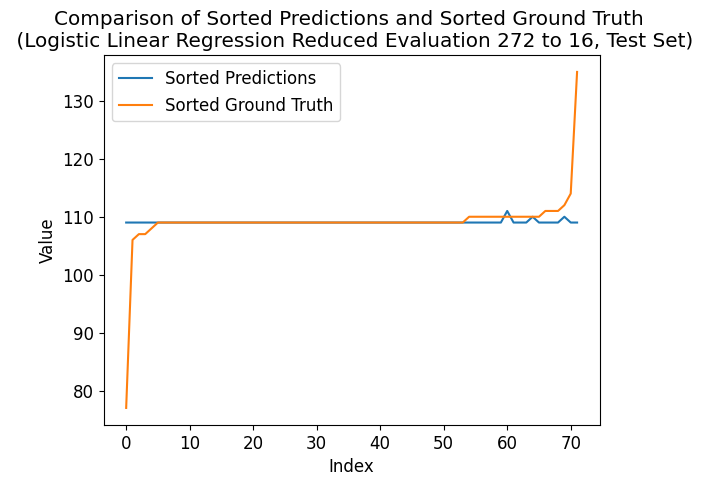

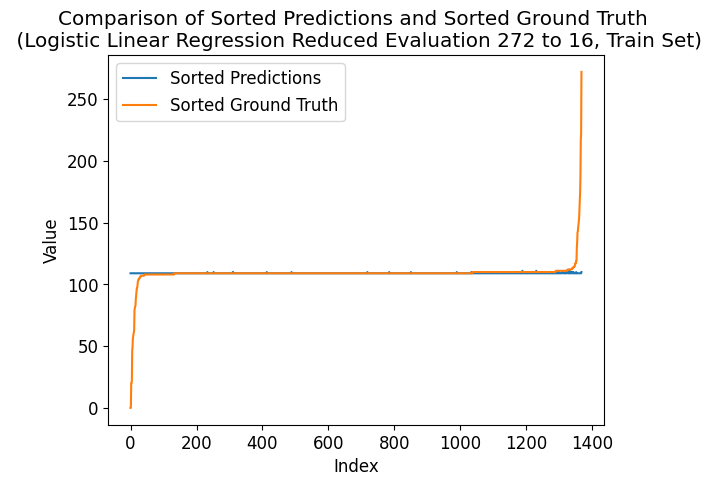

---- ---- ----
class_num = 288
Number of unique elements: 53
[  0.  18.  36.  54.  72.  90. 108. 126. 144. 162. 180. 198. 216. 234.
 252. 270. 288.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


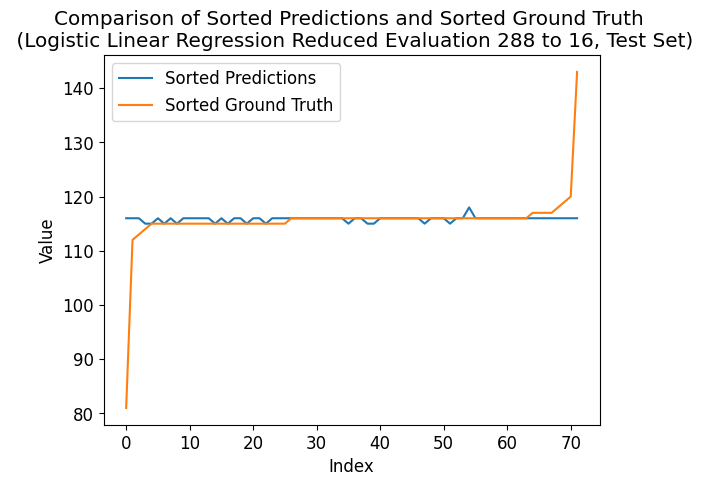

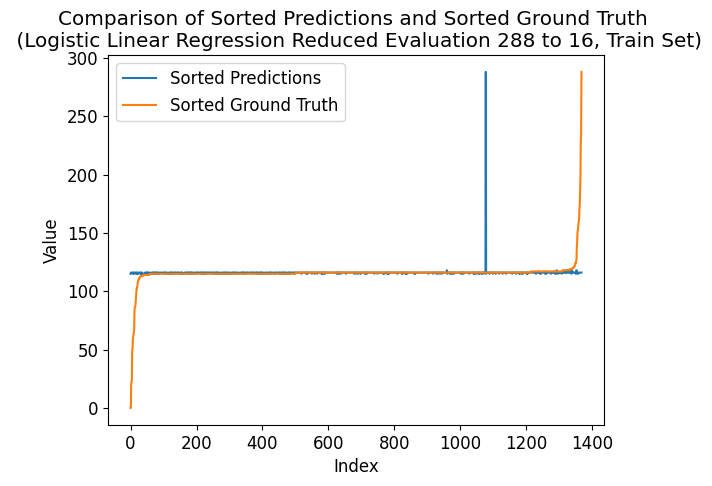

---- ---- ----
class_num = 304
Number of unique elements: 55
[  0.  19.  38.  57.  76.  95. 114. 133. 152. 171. 190. 209. 228. 247.
 266. 285. 304.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


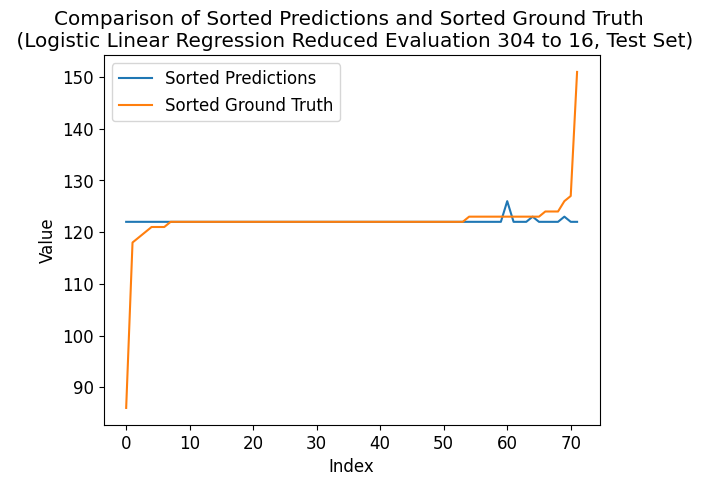

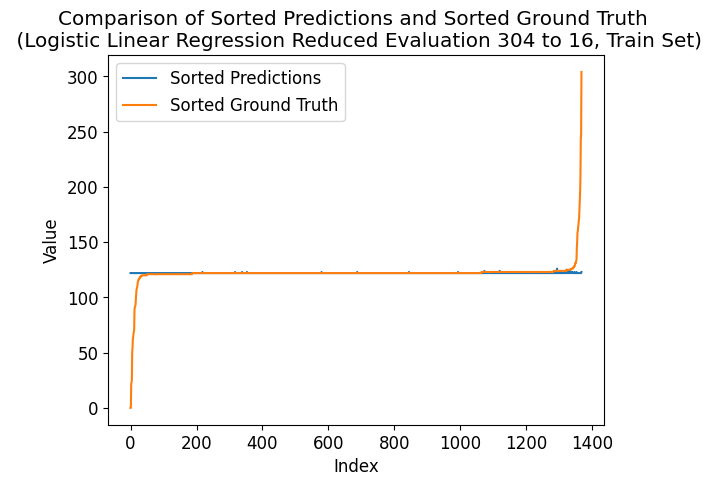

---- ---- ----
class_num = 320
Number of unique elements: 54
[  0.  20.  40.  60.  80. 100. 120. 140. 160. 180. 200. 220. 240. 260.
 280. 300. 320.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


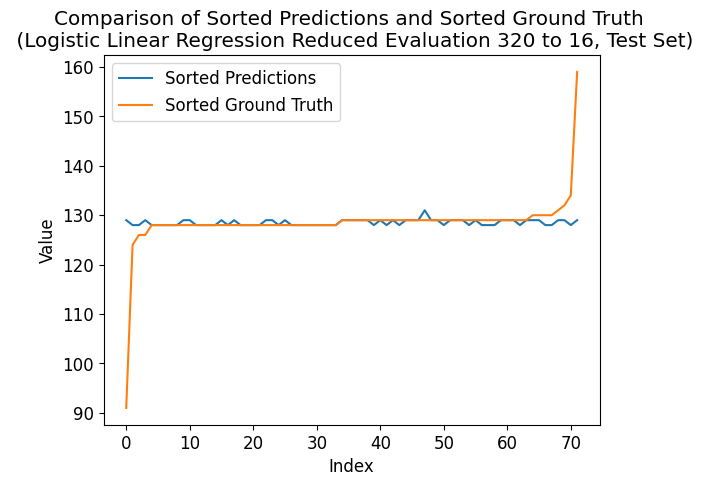

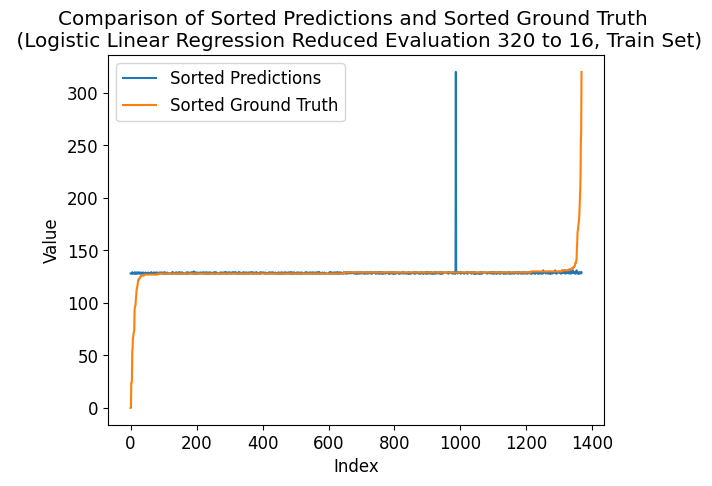

---- ---- ----
class_num = 336
Number of unique elements: 53
[  0.  21.  42.  63.  84. 105. 126. 147. 168. 189. 210. 231. 252. 273.
 294. 315. 336.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


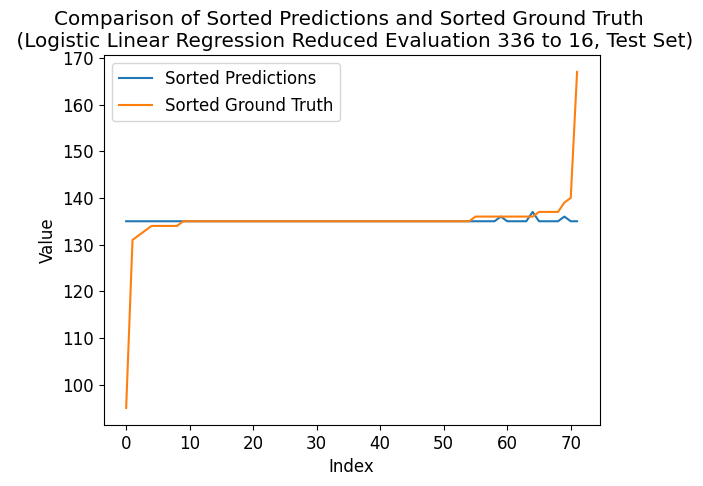

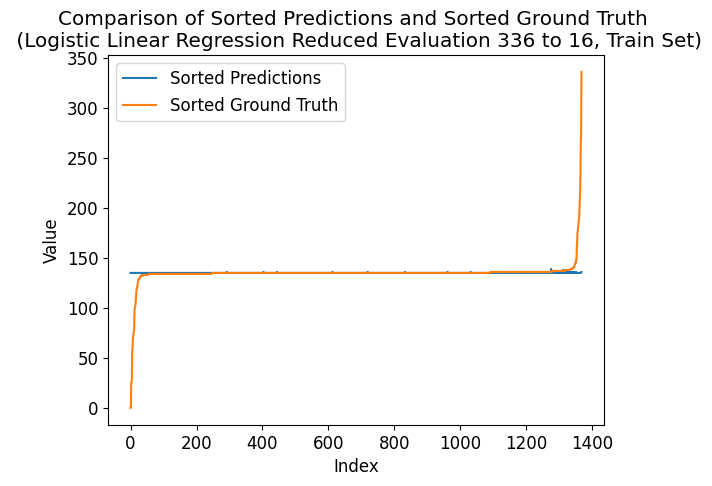

---- ---- ----
class_num = 352
Number of unique elements: 55
[  0.  22.  44.  66.  88. 110. 132. 154. 176. 198. 220. 242. 264. 286.
 308. 330. 352.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


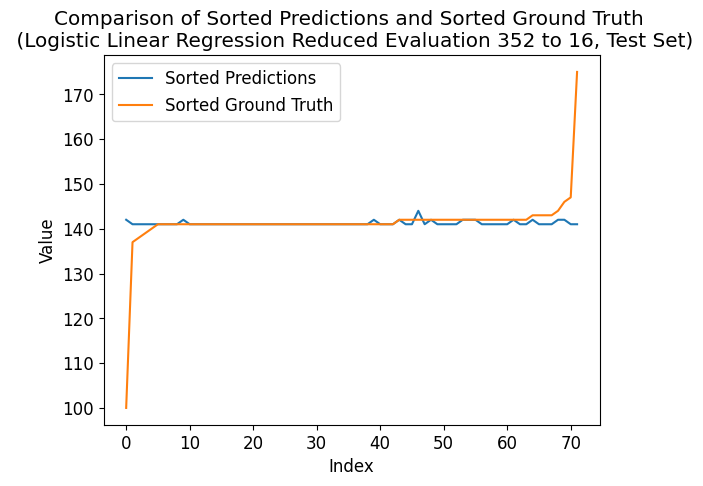

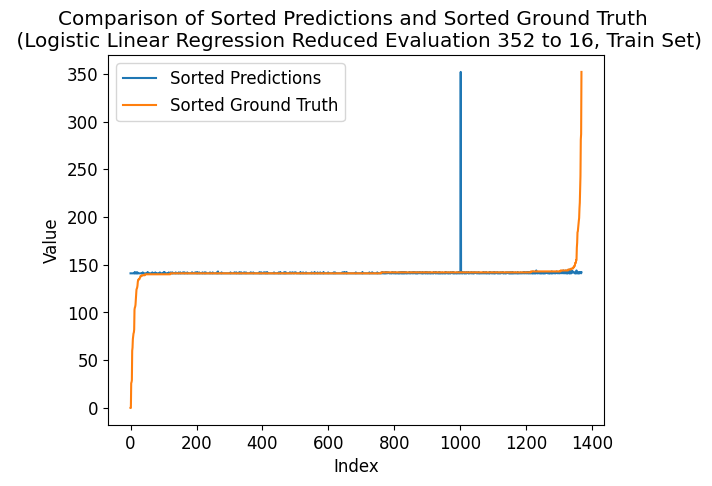

---- ---- ----
class_num = 368
Number of unique elements: 56
[  0.  23.  46.  69.  92. 115. 138. 161. 184. 207. 230. 253. 276. 299.
 322. 345. 368.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


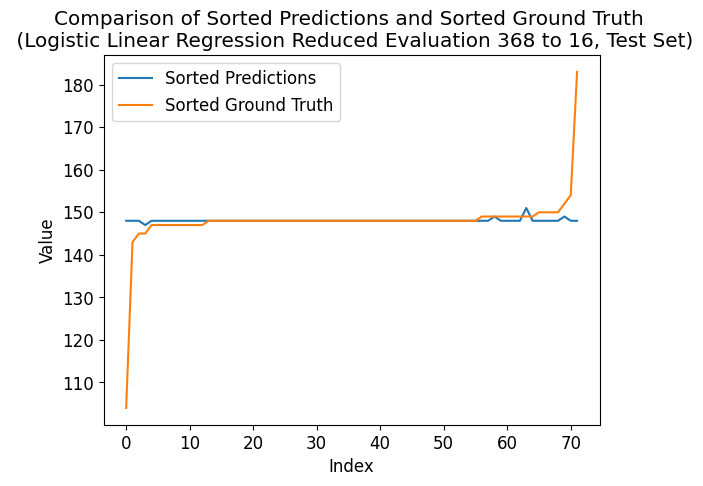

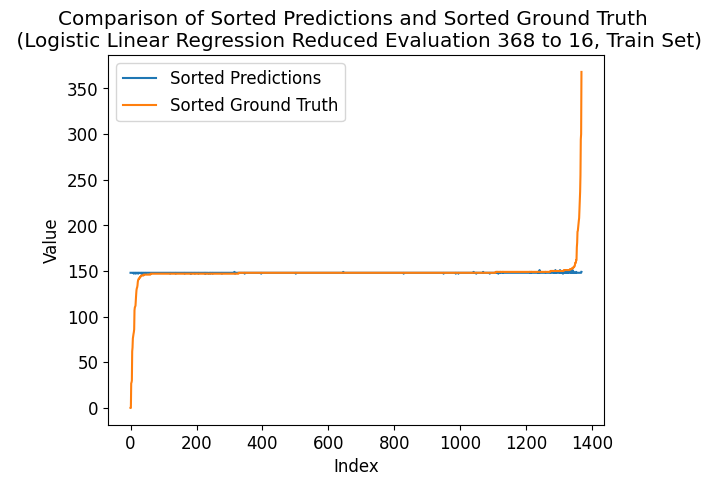

---- ---- ----
class_num = 384
Number of unique elements: 57
[  0.  24.  48.  72.  96. 120. 144. 168. 192. 216. 240. 264. 288. 312.
 336. 360. 384.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


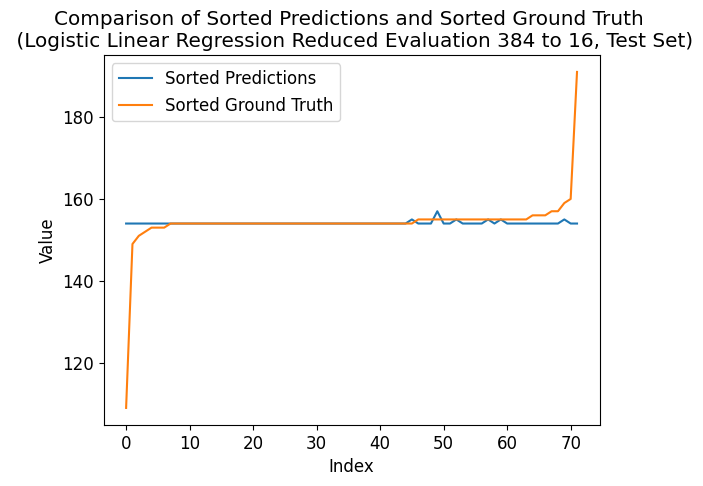

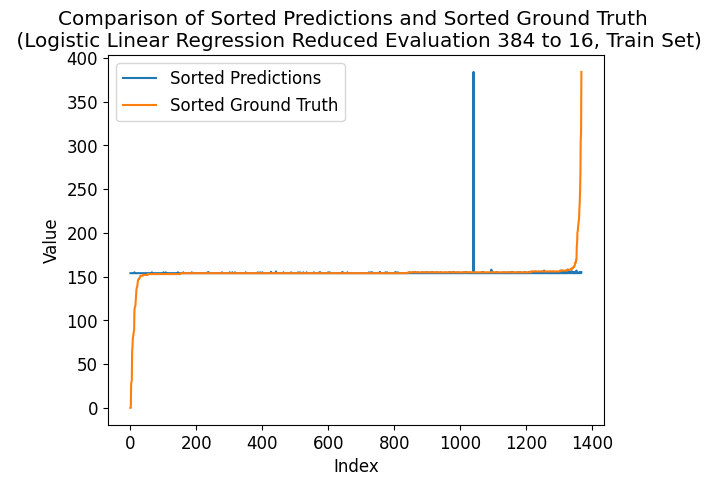

---- ---- ----
class_num = 400
Number of unique elements: 57
[  0.  25.  50.  75. 100. 125. 150. 175. 200. 225. 250. 275. 300. 325.
 350. 375. 400.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


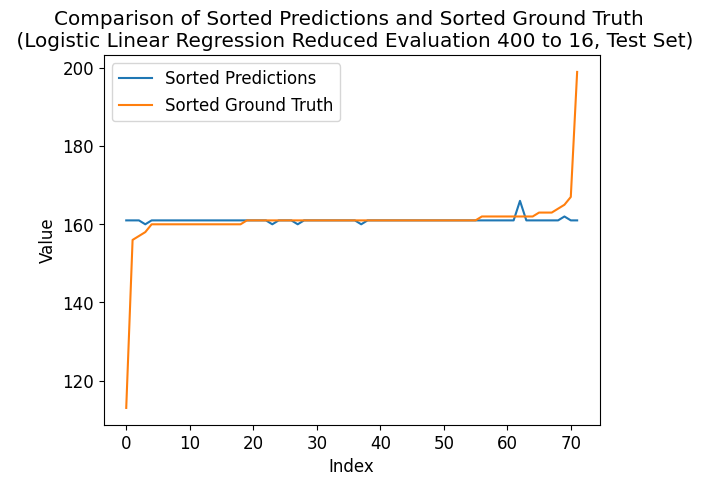

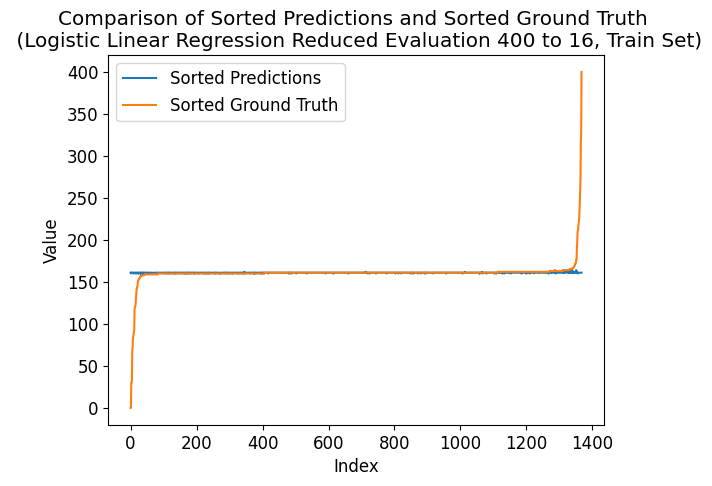

---- ---- ----
class_num = 416
Number of unique elements: 60
[  0.  26.  52.  78. 104. 130. 156. 182. 208. 234. 260. 286. 312. 338.
 364. 390. 416.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


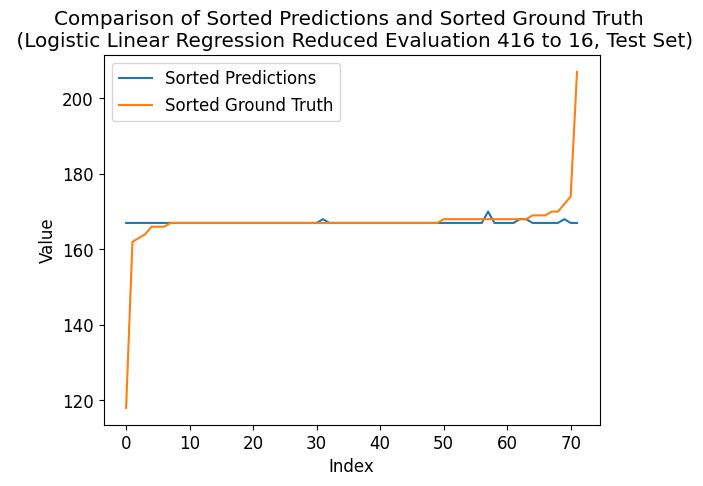

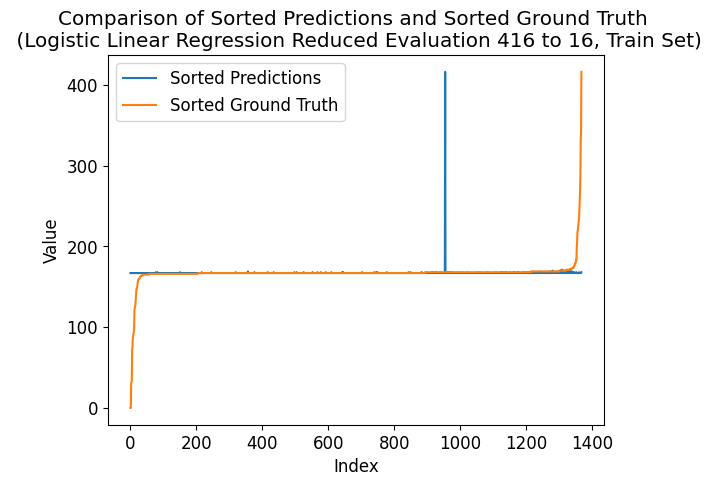

---- ---- ----
class_num = 432
Number of unique elements: 59
[  0.  27.  54.  81. 108. 135. 162. 189. 216. 243. 270. 297. 324. 351.
 378. 405. 432.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


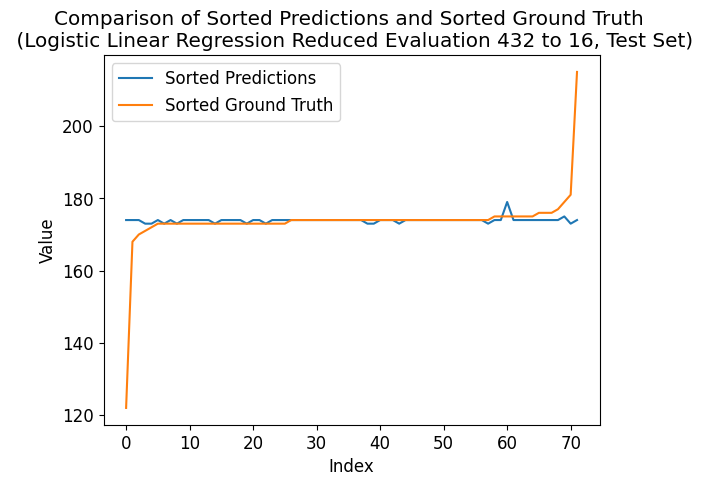

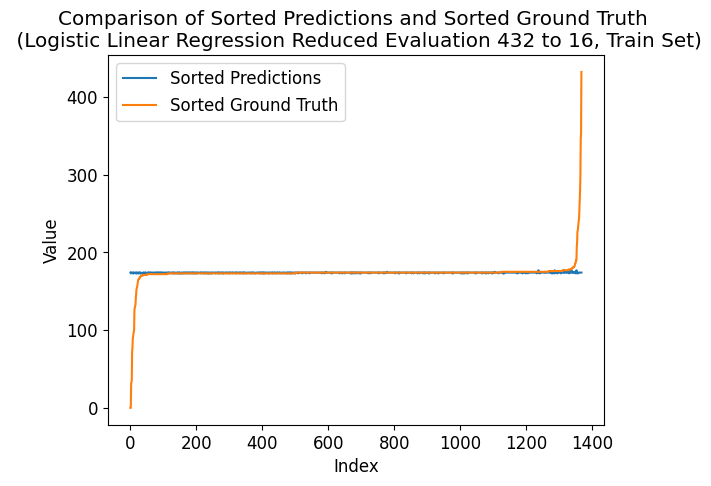

---- ---- ----
class_num = 448
Number of unique elements: 61
[  0.  28.  56.  84. 112. 140. 168. 196. 224. 252. 280. 308. 336. 364.
 392. 420. 448.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


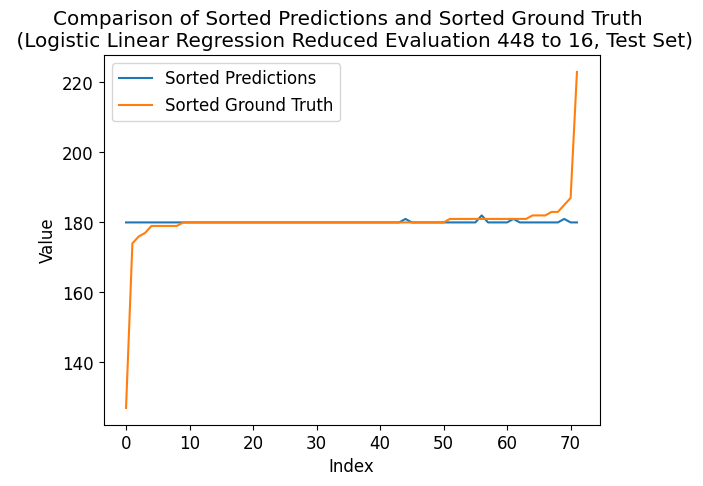

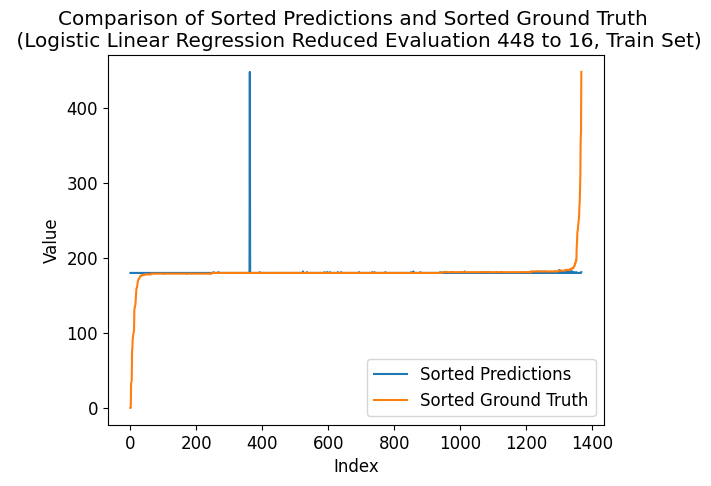

---- ---- ----
class_num = 464
Number of unique elements: 60
[  0.  29.  58.  87. 116. 145. 174. 203. 232. 261. 290. 319. 348. 377.
 406. 435. 464.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


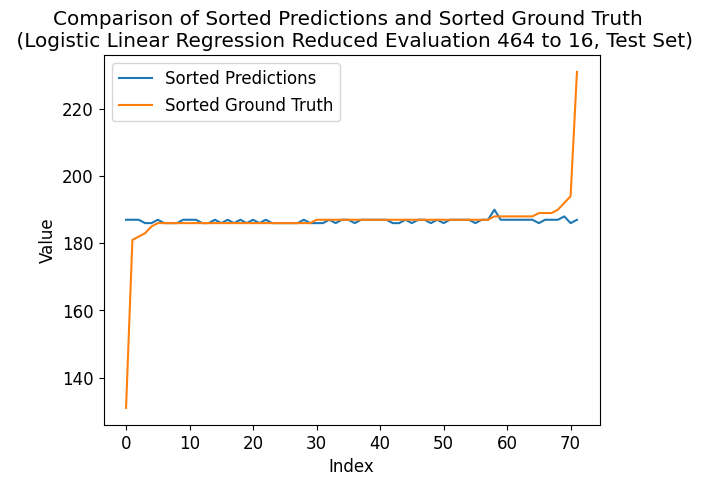

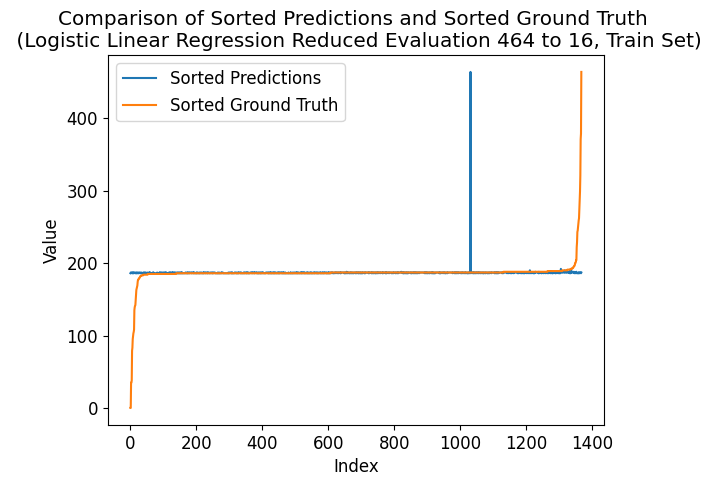

---- ---- ----
class_num = 480
Number of unique elements: 61
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


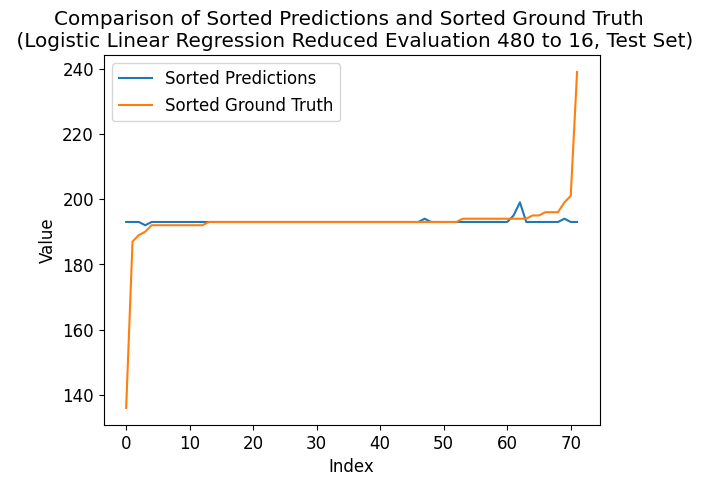

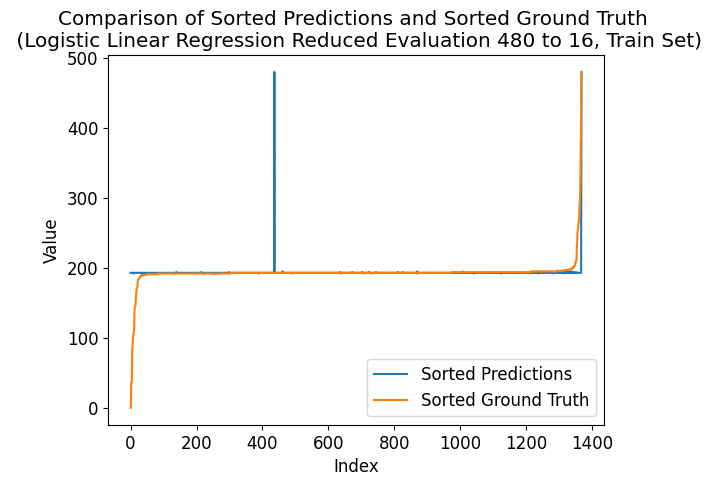

---- ---- ----
class_num = 496
Number of unique elements: 62
[  0.  31.  62.  93. 124. 155. 186. 217. 248. 279. 310. 341. 372. 403.
 434. 465. 496.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


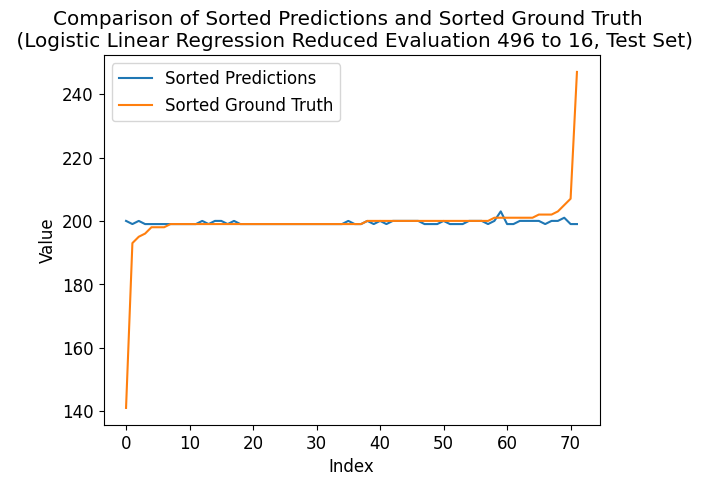

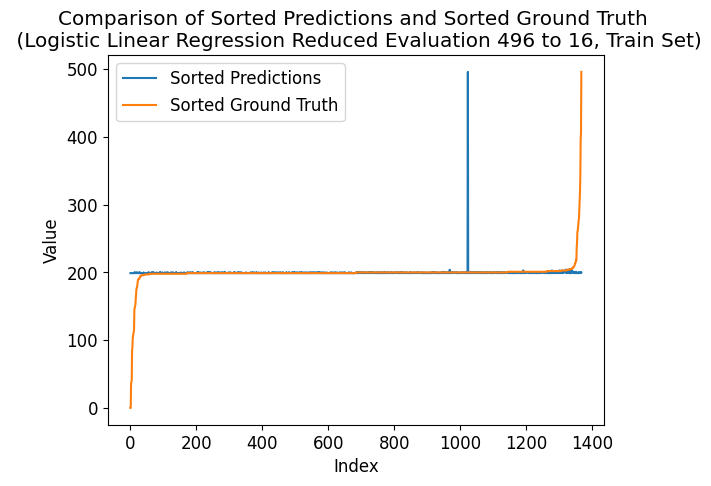

---- ---- ----
class_num = 512
Number of unique elements: 62
[  0.  32.  64.  96. 128. 160. 192. 224. 256. 288. 320. 352. 384. 416.
 448. 480. 512.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


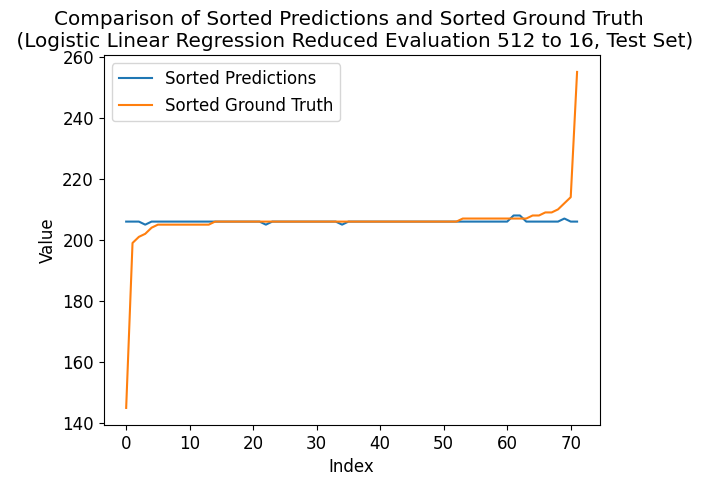

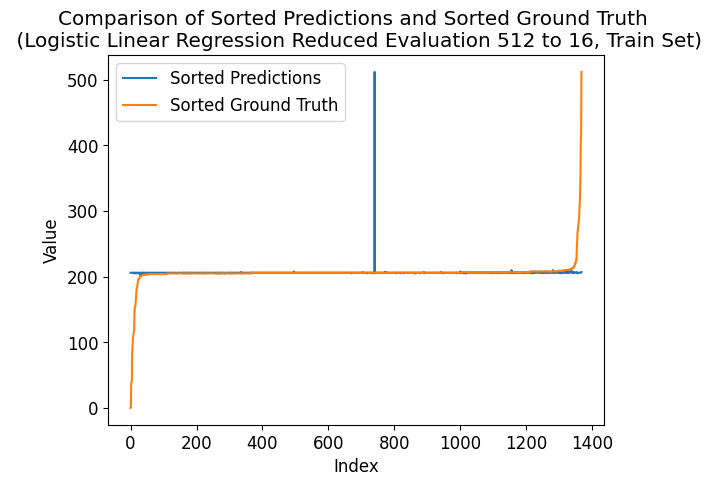

---- ---- ----
class_num = 528
Number of unique elements: 62
[  0.  33.  66.  99. 132. 165. 198. 231. 264. 297. 330. 363. 396. 429.
 462. 495. 528.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


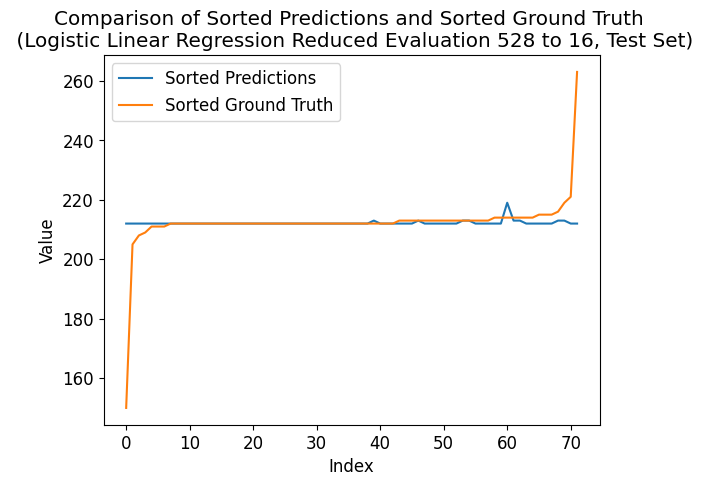

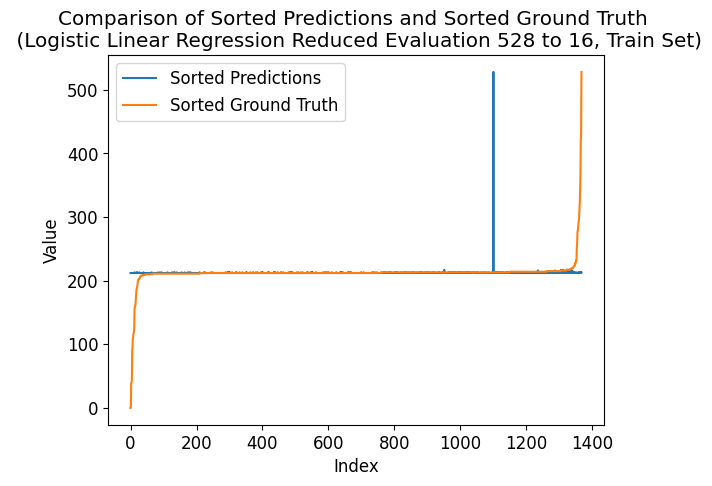

---- ---- ----
class_num = 544
Number of unique elements: 63
[  0.  34.  68. 102. 136. 170. 204. 238. 272. 306. 340. 374. 408. 442.
 476. 510. 544.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


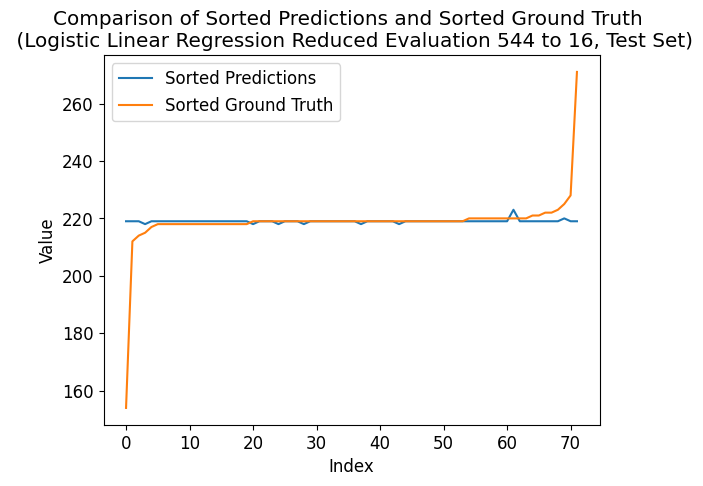

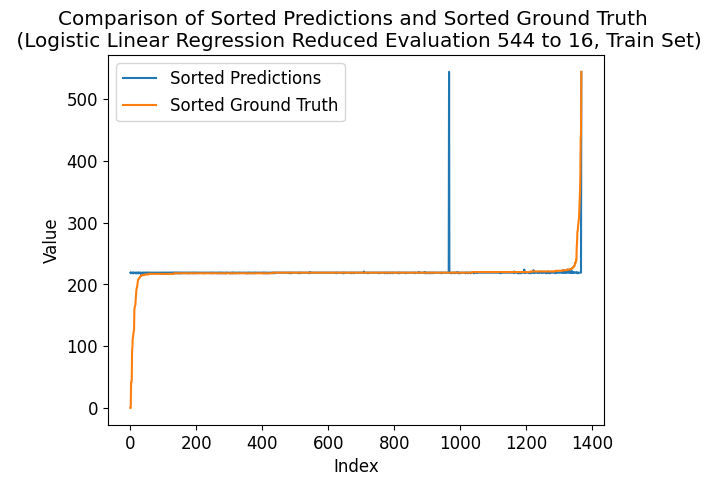

---- ---- ----
class_num = 560
Number of unique elements: 65
[  0.  35.  70. 105. 140. 175. 210. 245. 280. 315. 350. 385. 420. 455.
 490. 525. 560.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


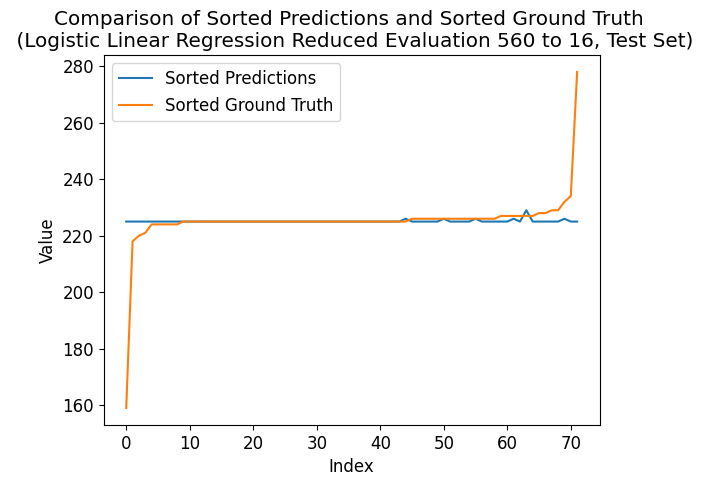

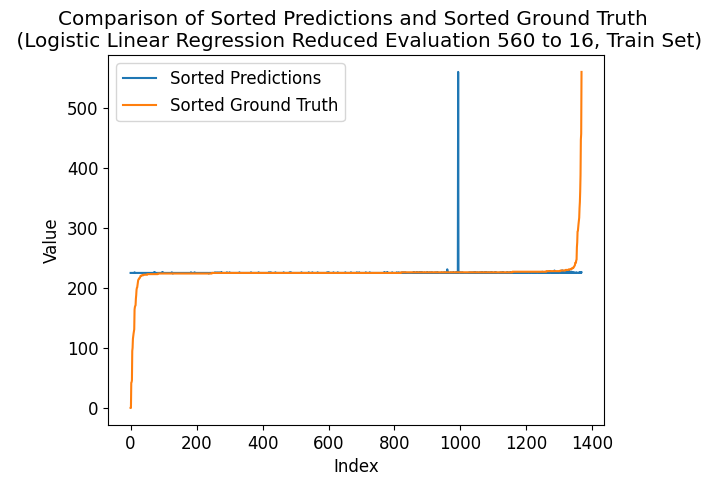

---- ---- ----
class_num = 576
Number of unique elements: 65
[  0.  36.  72. 108. 144. 180. 216. 252. 288. 324. 360. 396. 432. 468.
 504. 540. 576.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


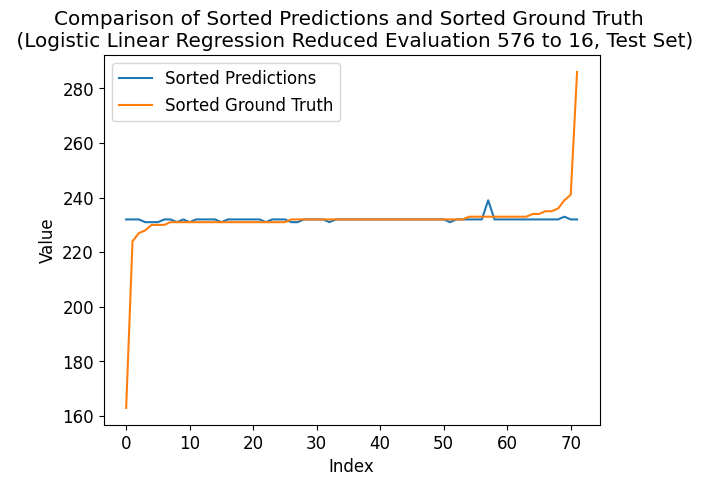

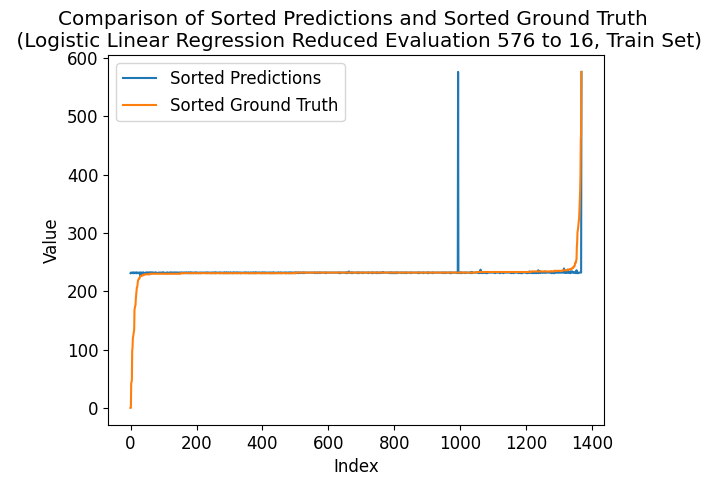

---- ---- ----
class_num = 592
Number of unique elements: 67
[  0.  37.  74. 111. 148. 185. 222. 259. 296. 333. 370. 407. 444. 481.
 518. 555. 592.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


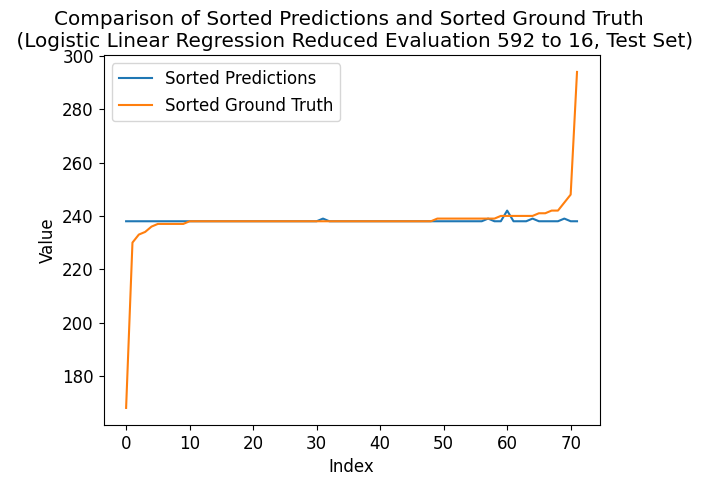

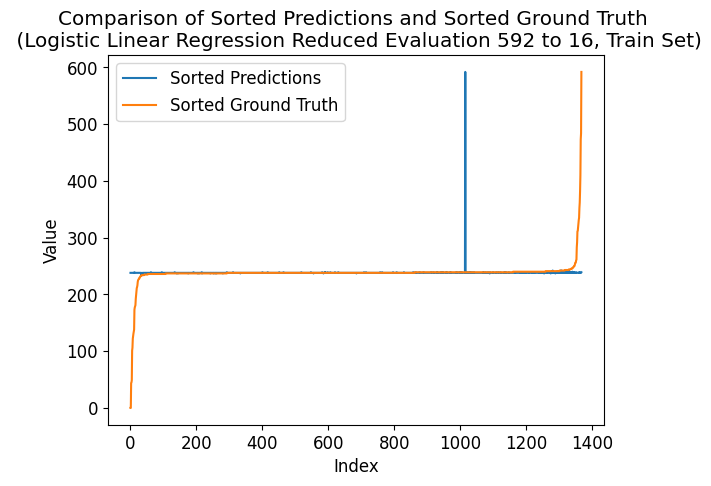

---- ---- ----
class_num = 608
Number of unique elements: 67
[  0.  38.  76. 114. 152. 190. 228. 266. 304. 342. 380. 418. 456. 494.
 532. 570. 608.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


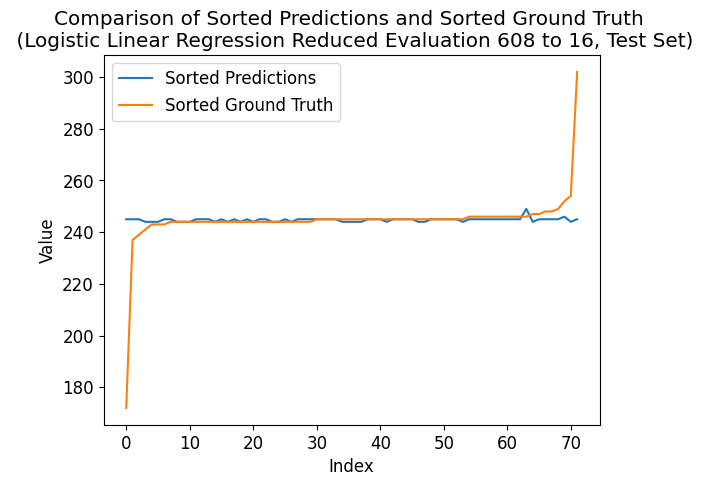

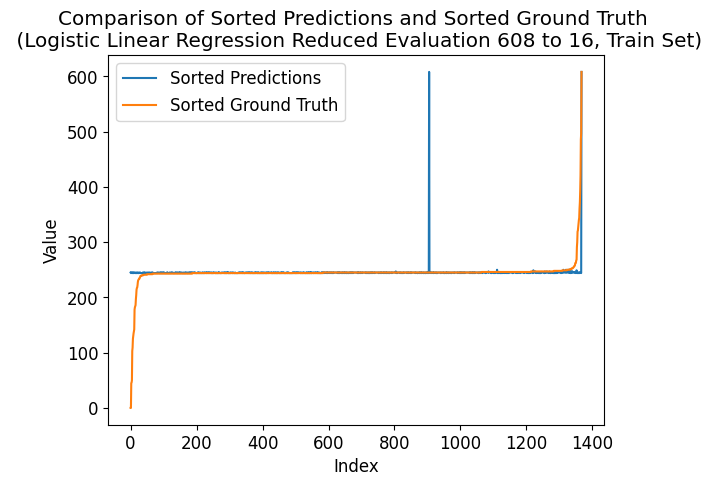

---- ---- ----
class_num = 624
Number of unique elements: 69
[  0.  39.  78. 117. 156. 195. 234. 273. 312. 351. 390. 429. 468. 507.
 546. 585. 624.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


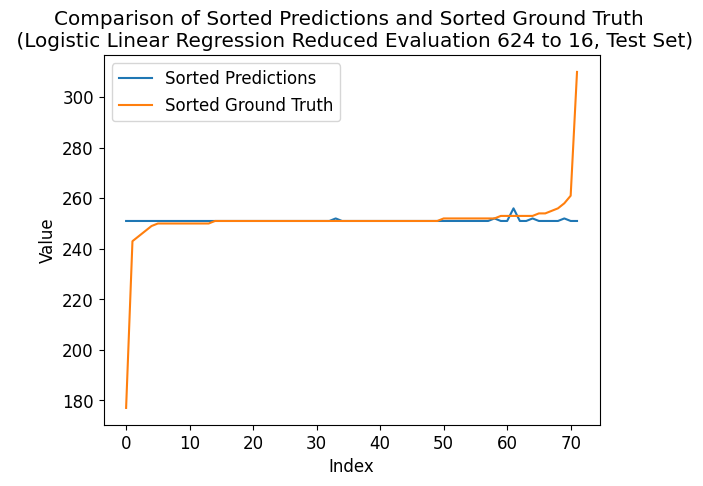

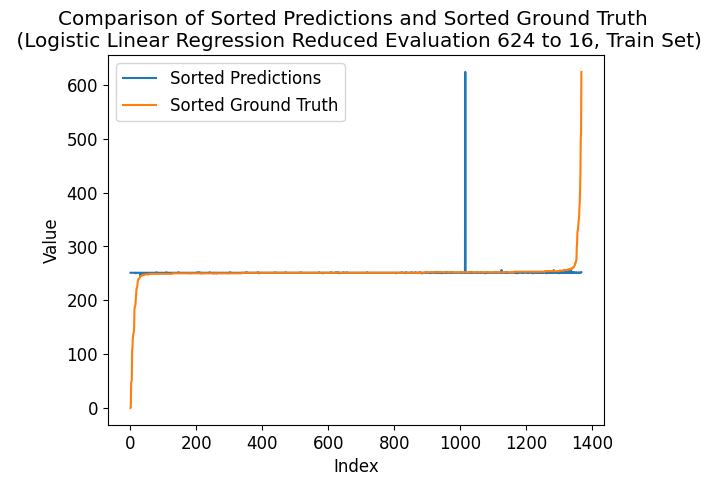

---- ---- ----
class_num = 640
Number of unique elements: 68
[  0.  40.  80. 120. 160. 200. 240. 280. 320. 360. 400. 440. 480. 520.
 560. 600. 640.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


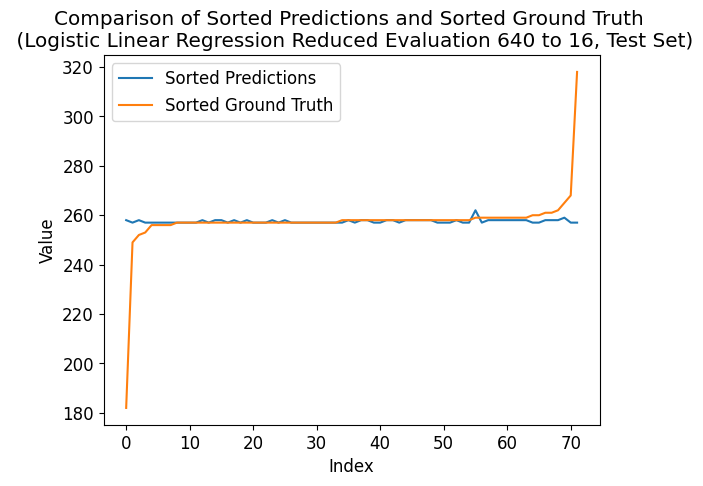

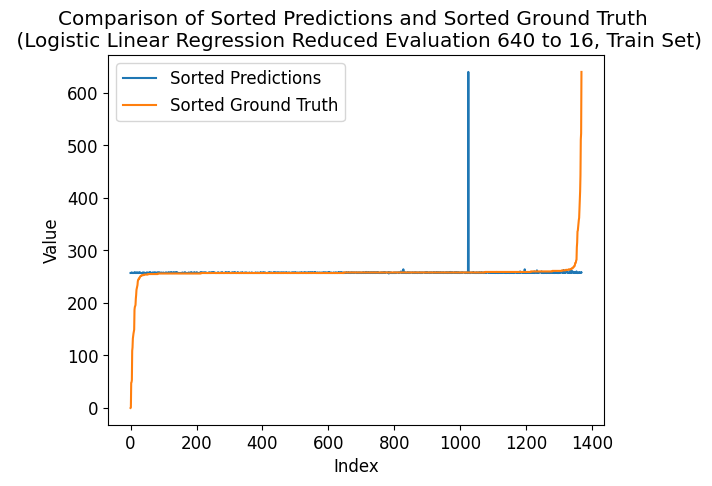

---- ---- ----
class_num = 656
Number of unique elements: 67
[  0.  41.  82. 123. 164. 205. 246. 287. 328. 369. 410. 451. 492. 533.
 574. 615. 656.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


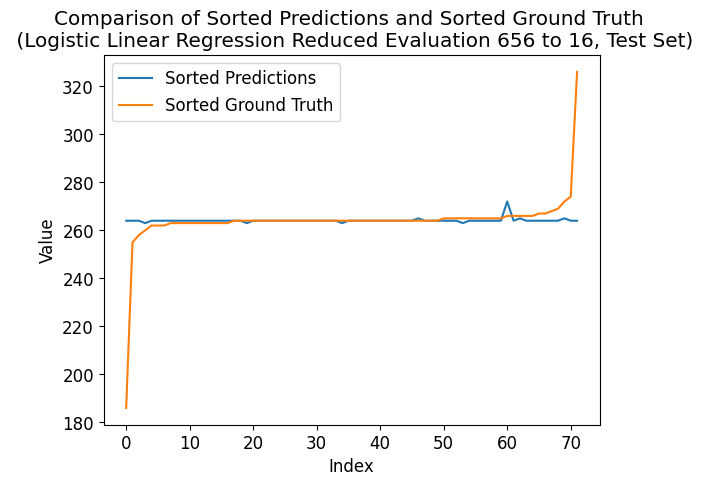

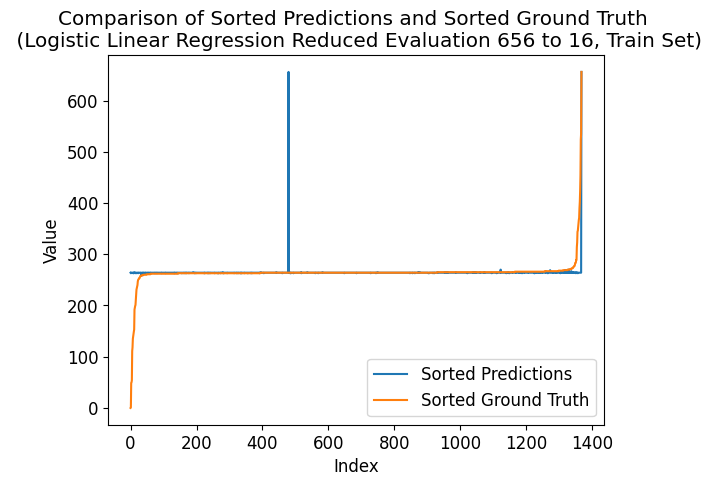

---- ---- ----
class_num = 672
Number of unique elements: 69
[  0.  42.  84. 126. 168. 210. 252. 294. 336. 378. 420. 462. 504. 546.
 588. 630. 672.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


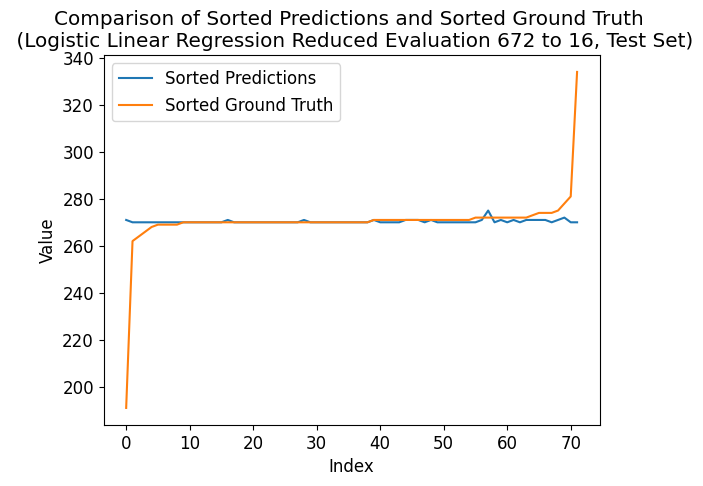

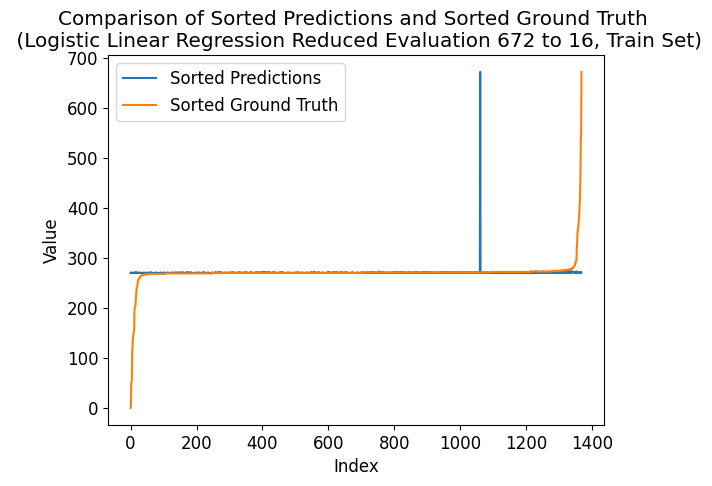

---- ---- ----
class_num = 688
Number of unique elements: 70
[  0.  43.  86. 129. 172. 215. 258. 301. 344. 387. 430. 473. 516. 559.
 602. 645. 688.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


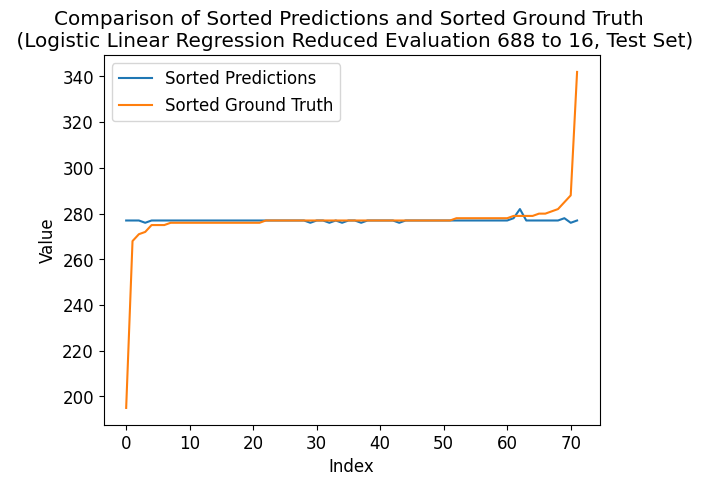

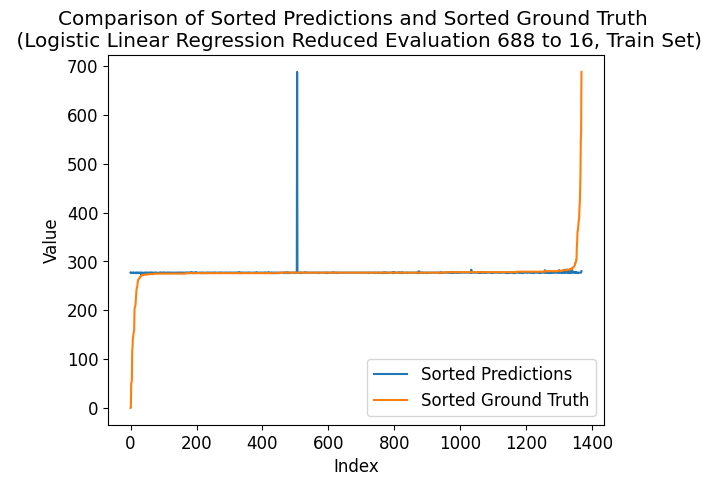

---- ---- ----
class_num = 704
Number of unique elements: 70
[  0.  44.  88. 132. 176. 220. 264. 308. 352. 396. 440. 484. 528. 572.
 616. 660. 704.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


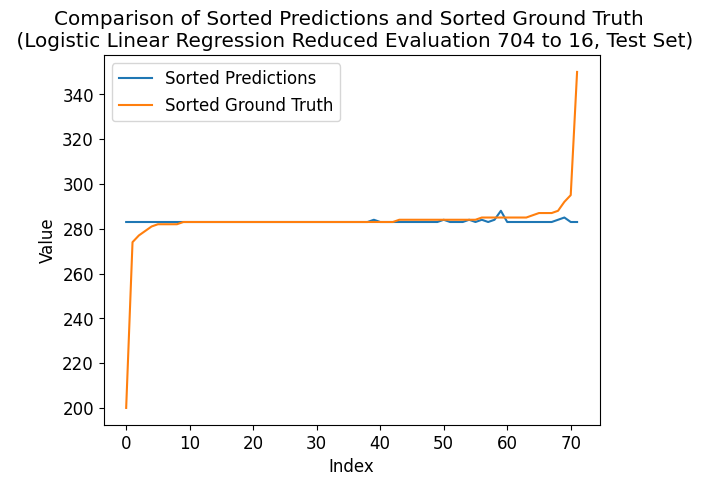

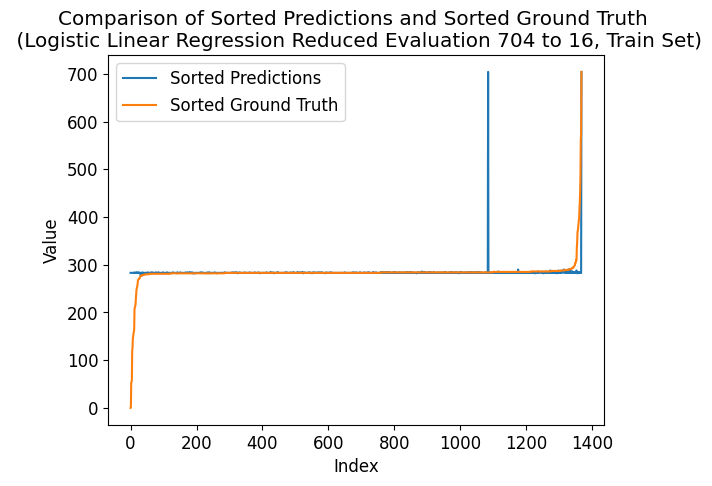

---- ---- ----
class_num = 720
Number of unique elements: 70
[  0.  45.  90. 135. 180. 225. 270. 315. 360. 405. 450. 495. 540. 585.
 630. 675. 720.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


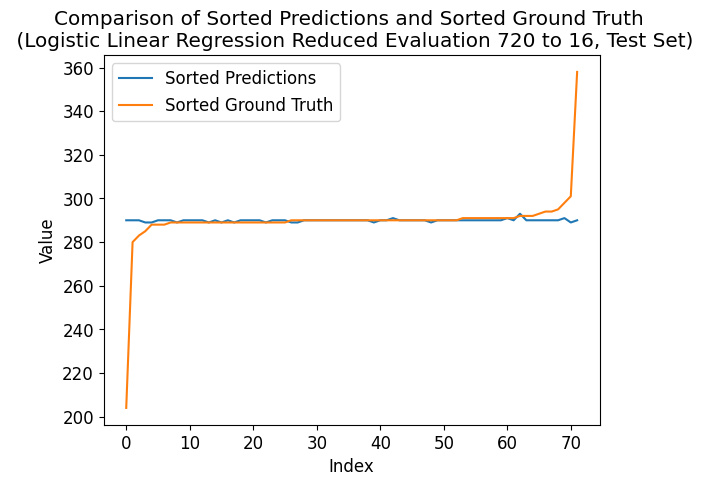

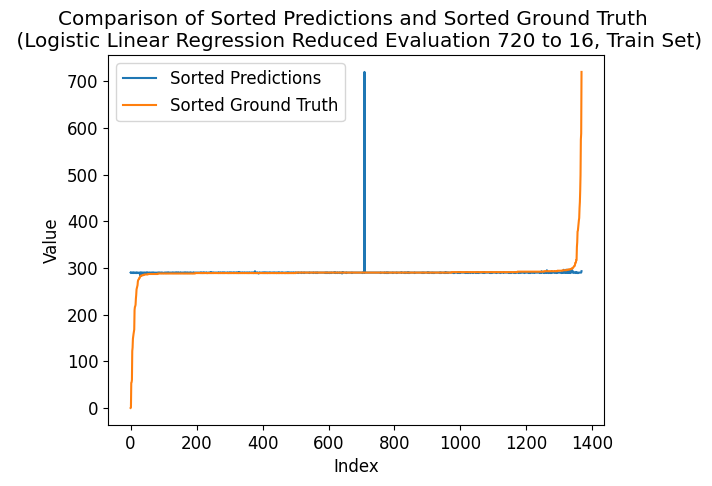

---- ---- ----
class_num = 736
Number of unique elements: 69
[  0.  46.  92. 138. 184. 230. 276. 322. 368. 414. 460. 506. 552. 598.
 644. 690. 736.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


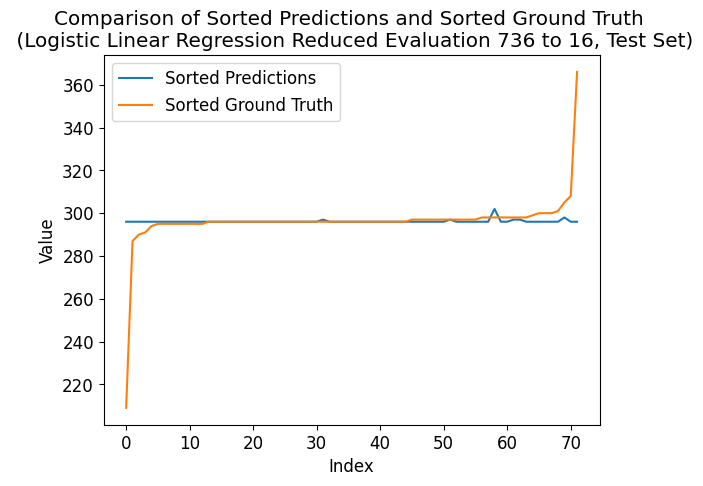

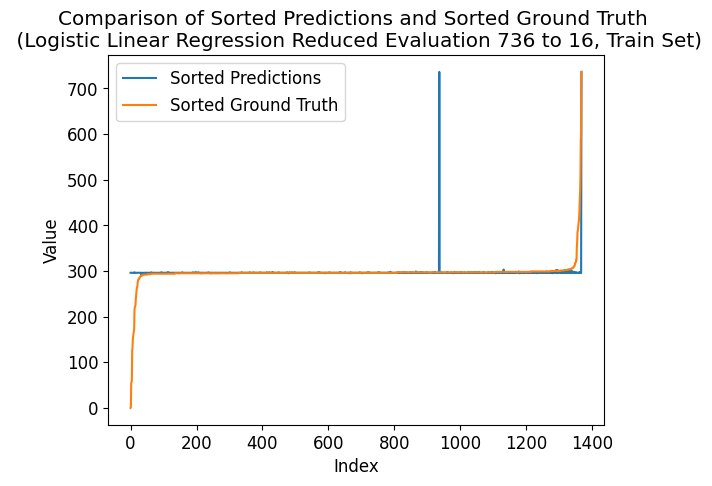

---- ---- ----
class_num = 752
Number of unique elements: 71
[  0.  47.  94. 141. 188. 235. 282. 329. 376. 423. 470. 517. 564. 611.
 658. 705. 752.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


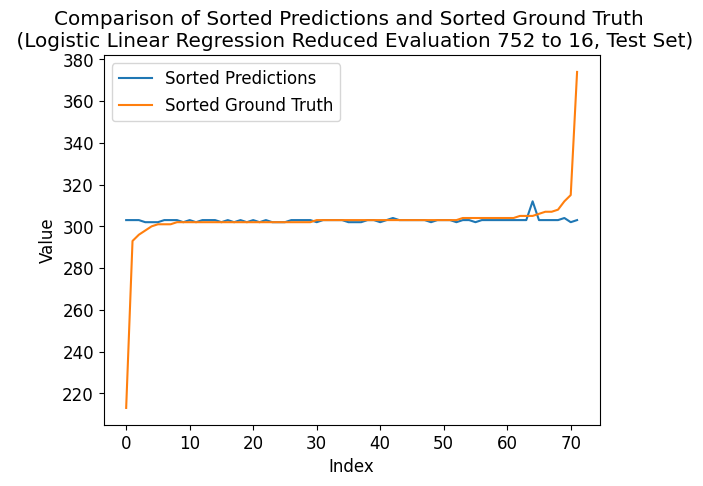

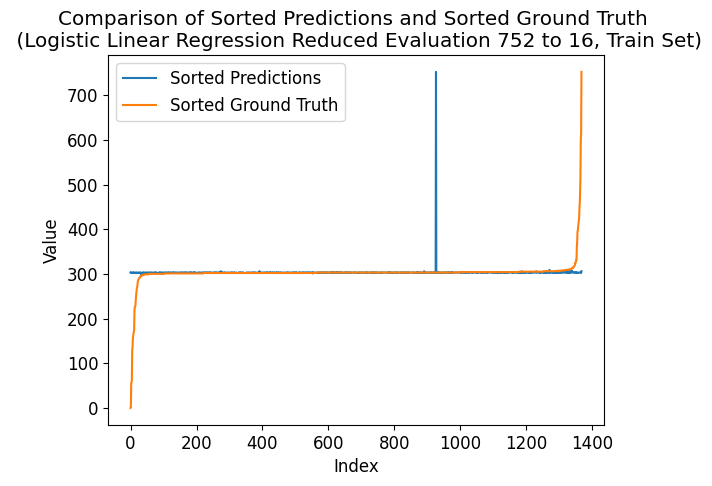

---- ---- ----
class_num = 768
Number of unique elements: 72
[  0.  48.  96. 144. 192. 240. 288. 336. 384. 432. 480. 528. 576. 624.
 672. 720. 768.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.4554093567251462
Correlation coefficient: 0.0002877987771944491
Coefficient of determination (R-squared score, R2 score): -0.19133946431491955


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


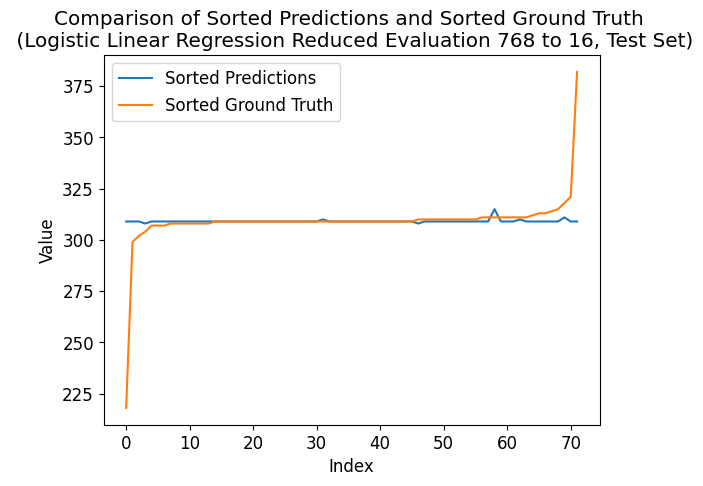

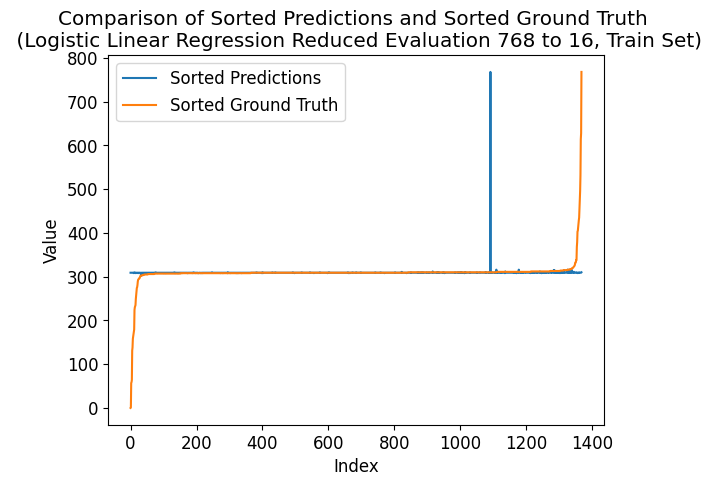

---- ---- ----
class_num = 784
Number of unique elements: 71
[  0.  49.  98. 147. 196. 245. 294. 343. 392. 441. 490. 539. 588. 637.
 686. 735. 784.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


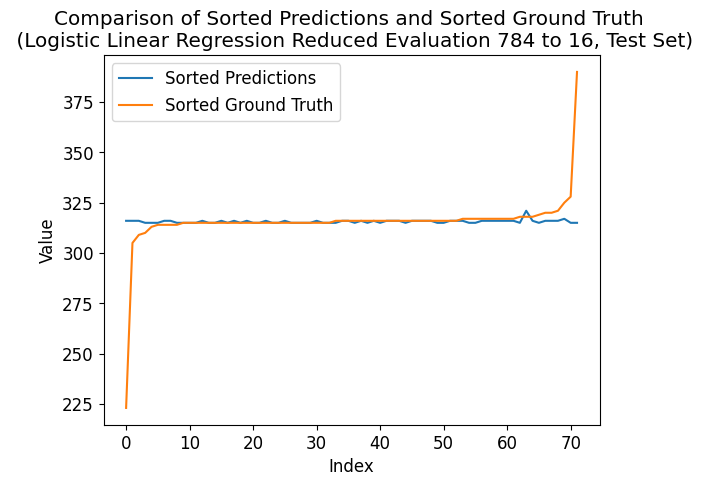

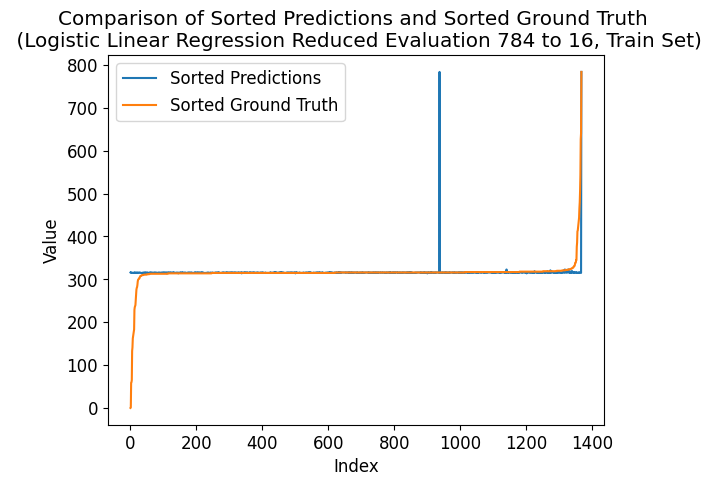

---- ---- ----
class_num = 800
Number of unique elements: 72
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500. 550. 600. 650.
 700. 750. 800.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


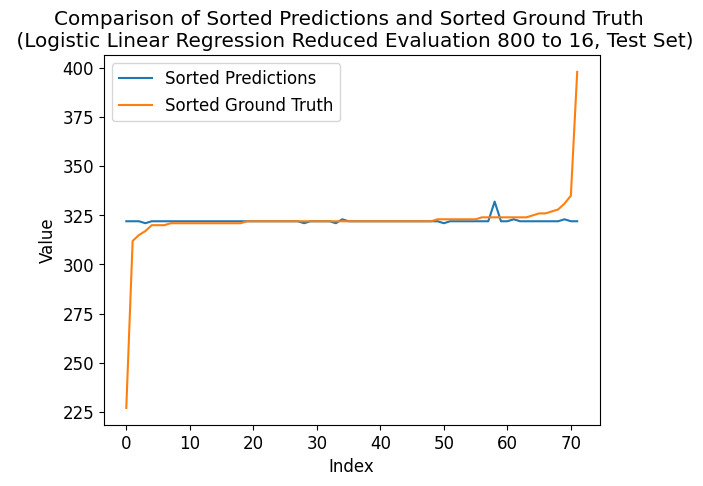

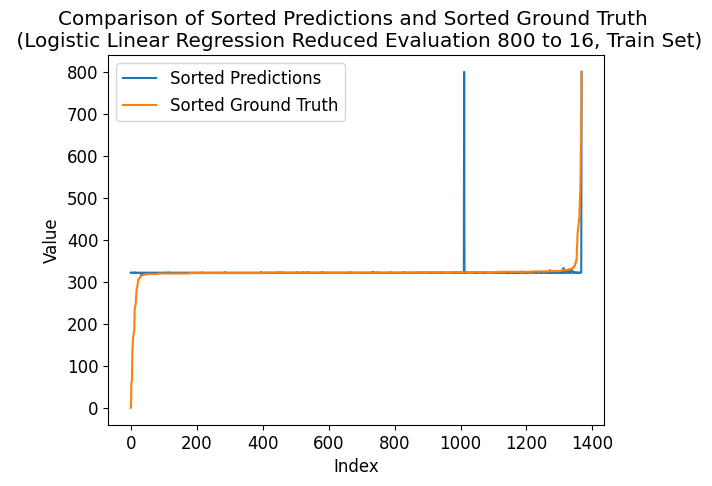

---- ---- ----
class_num = 816
Number of unique elements: 73
[  0.  51. 102. 153. 204. 255. 306. 357. 408. 459. 510. 561. 612. 663.
 714. 765. 816.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


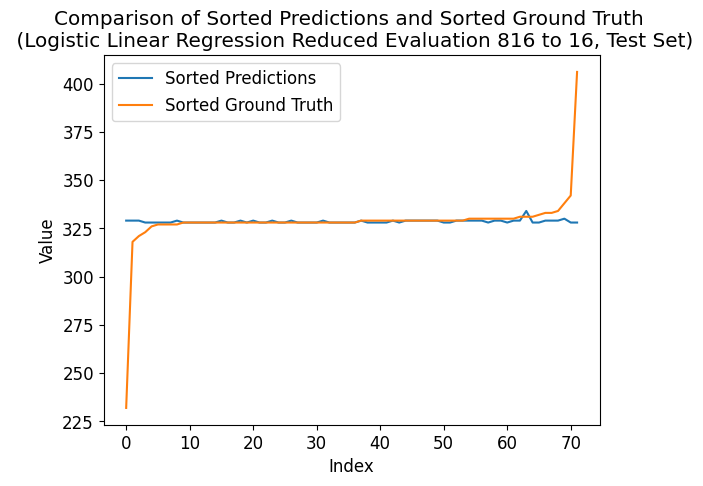

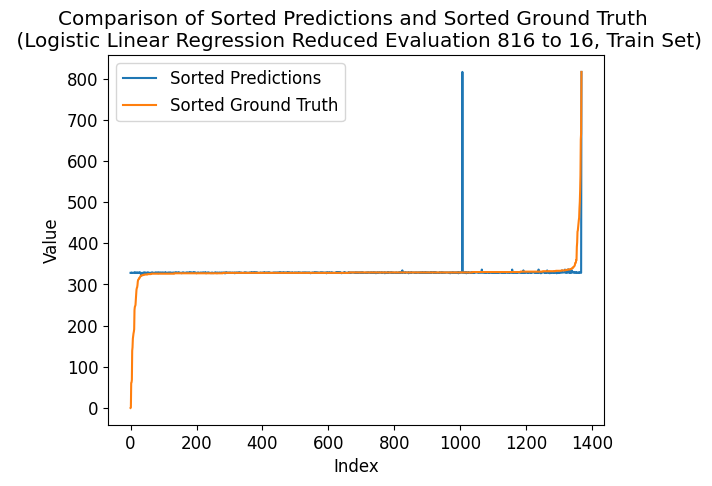

---- ---- ----
class_num = 832
Number of unique elements: 74
[  0.  52. 104. 156. 208. 260. 312. 364. 416. 468. 520. 572. 624. 676.
 728. 780. 832.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


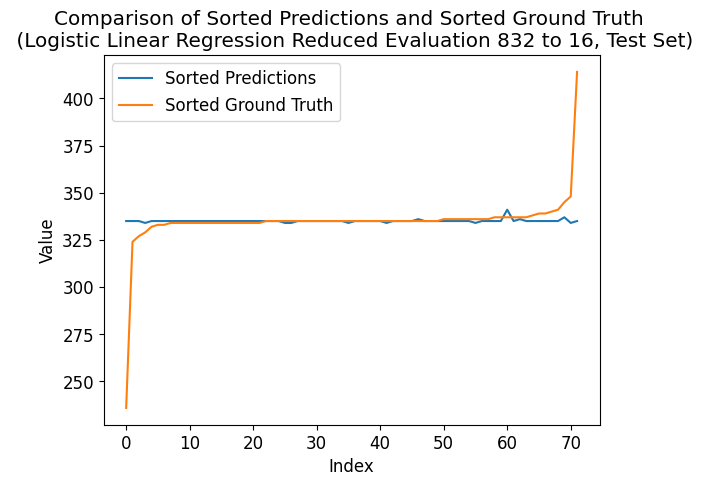

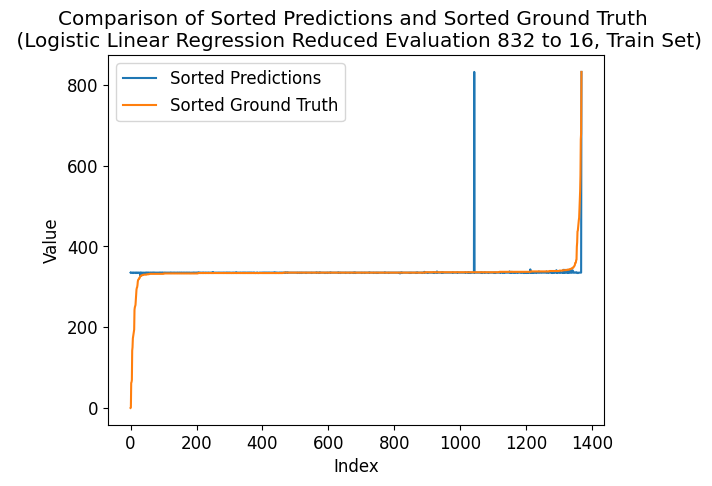

---- ---- ----
class_num = 848
Number of unique elements: 74
[  0.  53. 106. 159. 212. 265. 318. 371. 424. 477. 530. 583. 636. 689.
 742. 795. 848.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


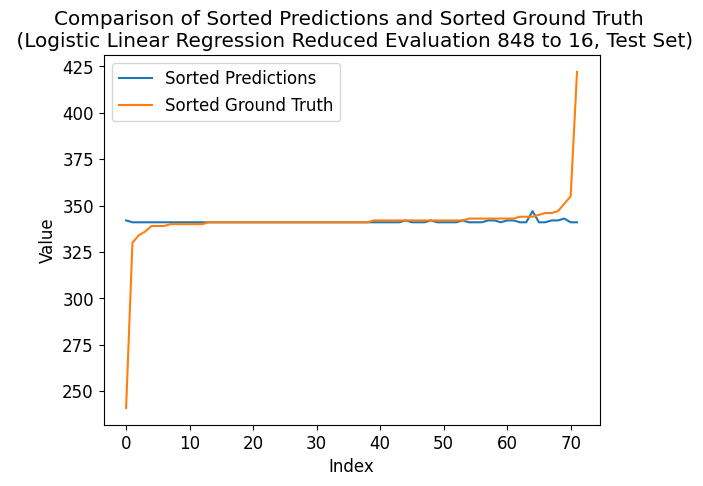

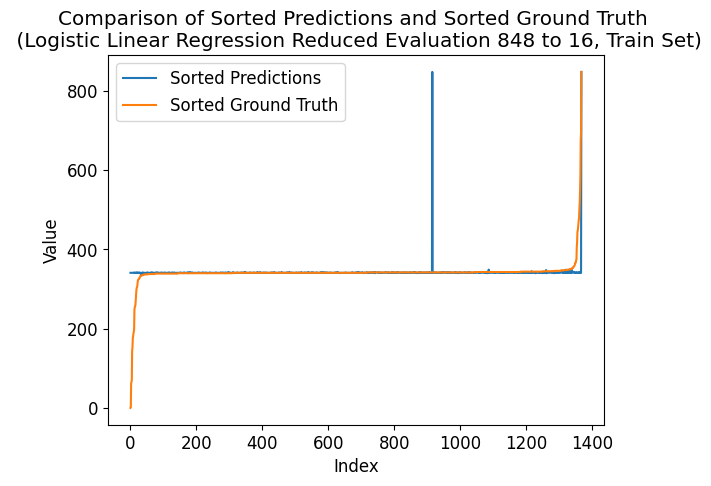

---- ---- ----
class_num = 864
Number of unique elements: 74
[  0.  54. 108. 162. 216. 270. 324. 378. 432. 486. 540. 594. 648. 702.
 756. 810. 864.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


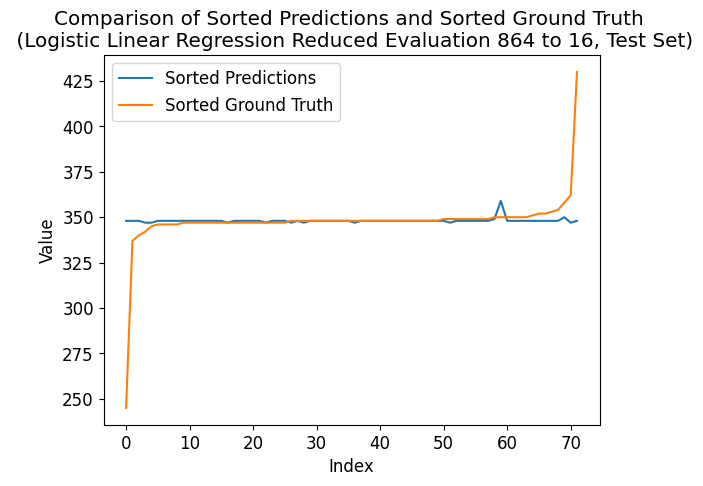

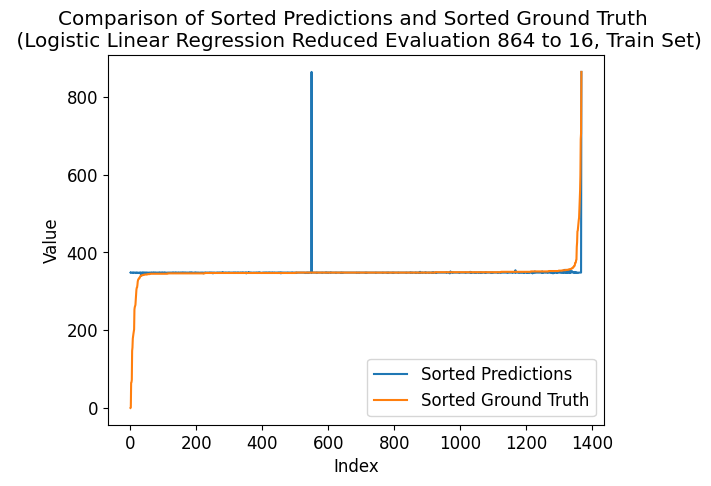

---- ---- ----
class_num = 880
Number of unique elements: 76
[  0.  55. 110. 165. 220. 275. 330. 385. 440. 495. 550. 605. 660. 715.
 770. 825. 880.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


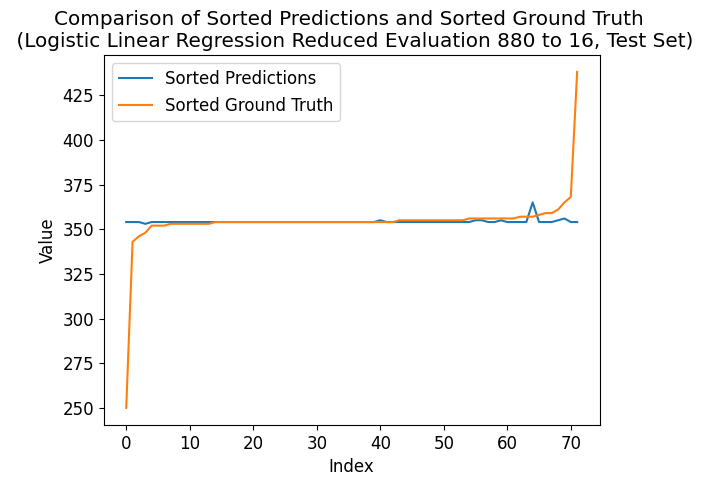

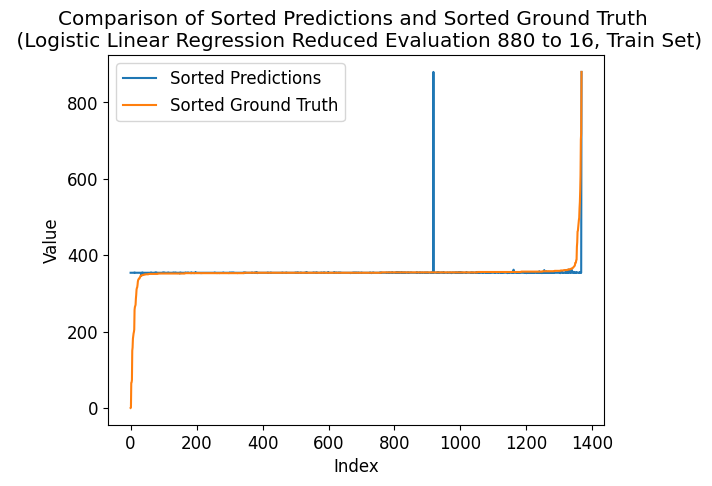

---- ---- ----
class_num = 896
Number of unique elements: 76
[  0.  56. 112. 168. 224. 280. 336. 392. 448. 504. 560. 616. 672. 728.
 784. 840. 896.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


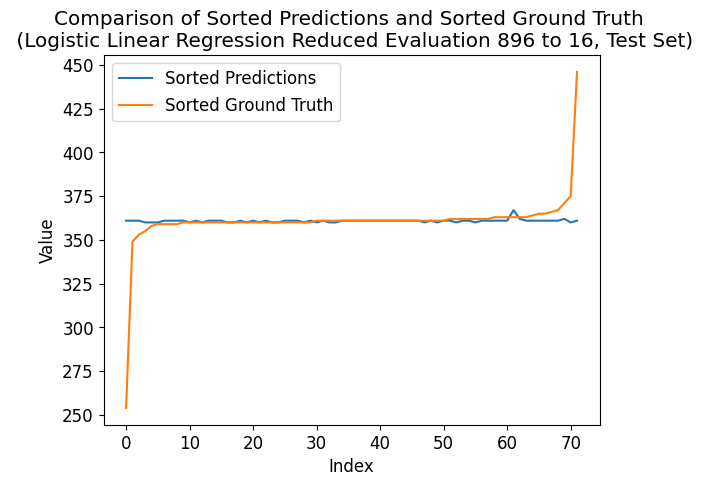

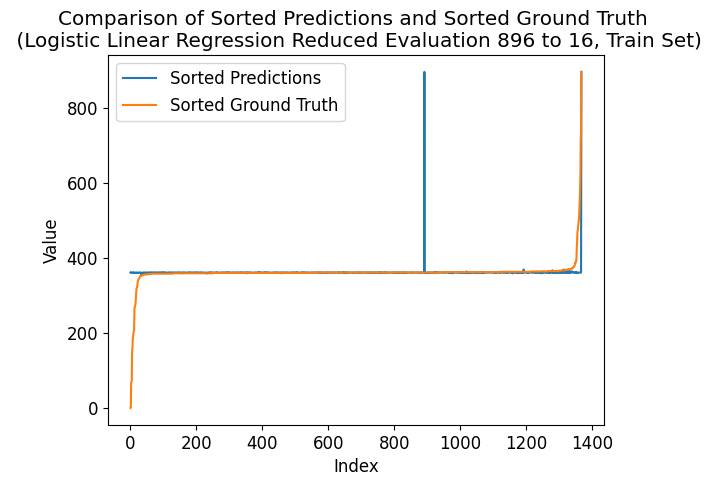

---- ---- ----
class_num = 912
Number of unique elements: 76
[  0.  57. 114. 171. 228. 285. 342. 399. 456. 513. 570. 627. 684. 741.
 798. 855. 912.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


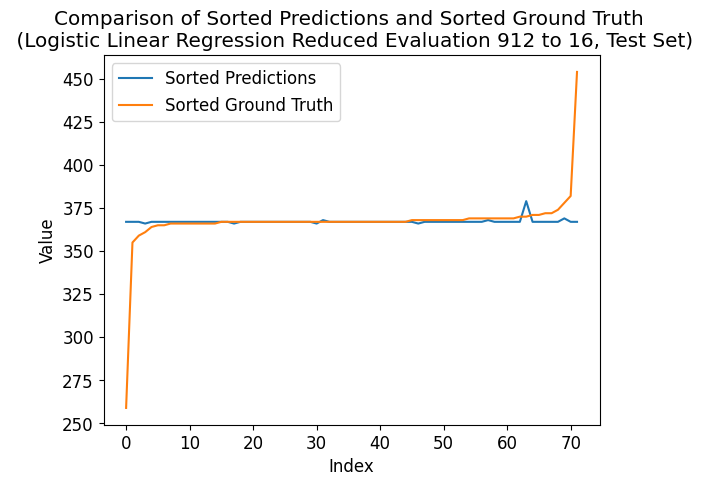

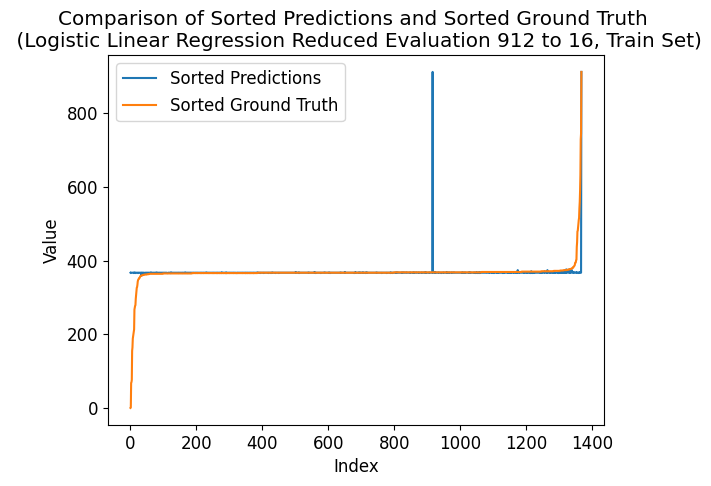

---- ---- ----
class_num = 928
Number of unique elements: 75
[  0.  58. 116. 174. 232. 290. 348. 406. 464. 522. 580. 638. 696. 754.
 812. 870. 928.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


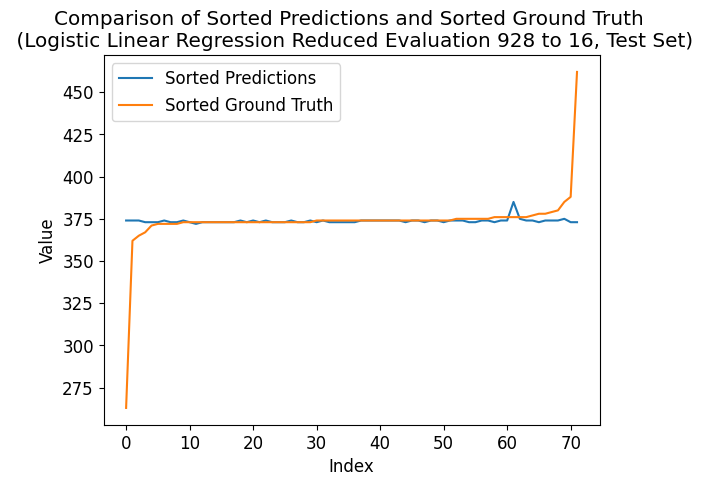

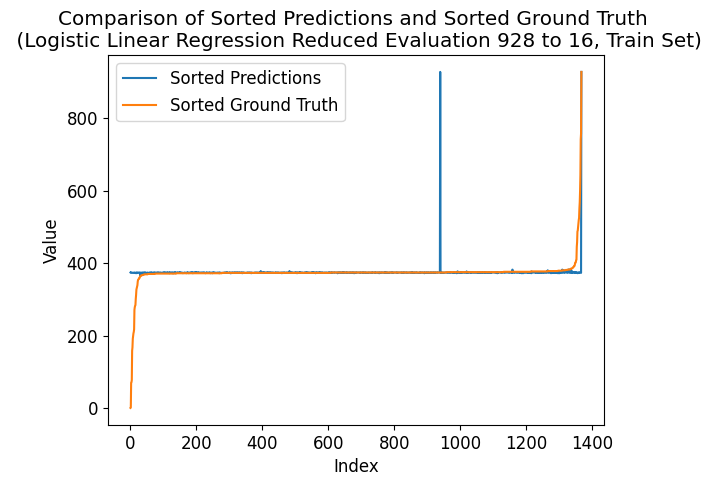

---- ---- ----
class_num = 944
Number of unique elements: 77
[  0.  59. 118. 177. 236. 295. 354. 413. 472. 531. 590. 649. 708. 767.
 826. 885. 944.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


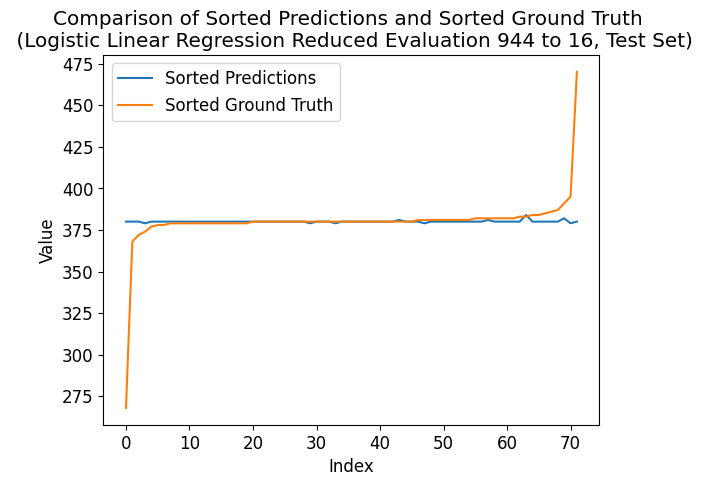

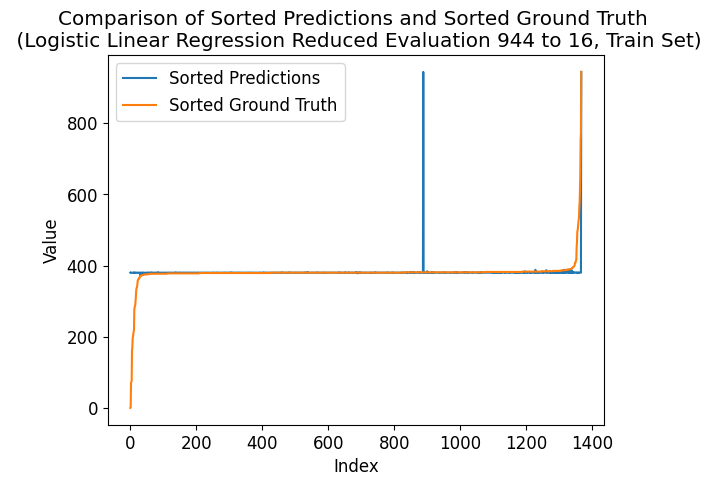

---- ---- ----
class_num = 960
Number of unique elements: 77
[  0.  60. 120. 180. 240. 300. 360. 420. 480. 540. 600. 660. 720. 780.
 840. 900. 960.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


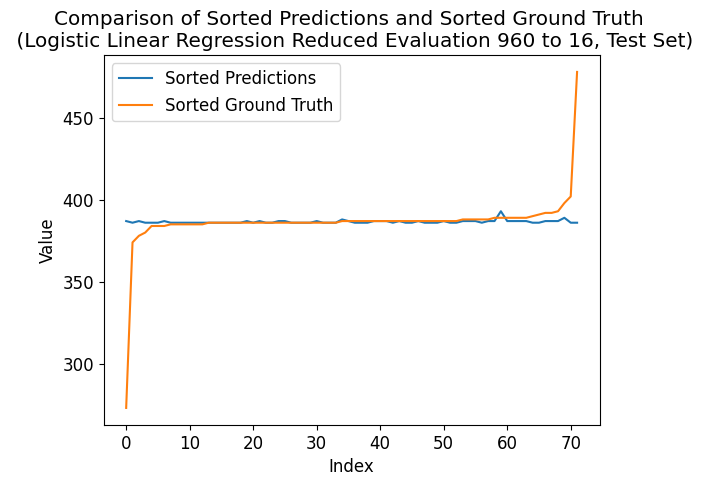

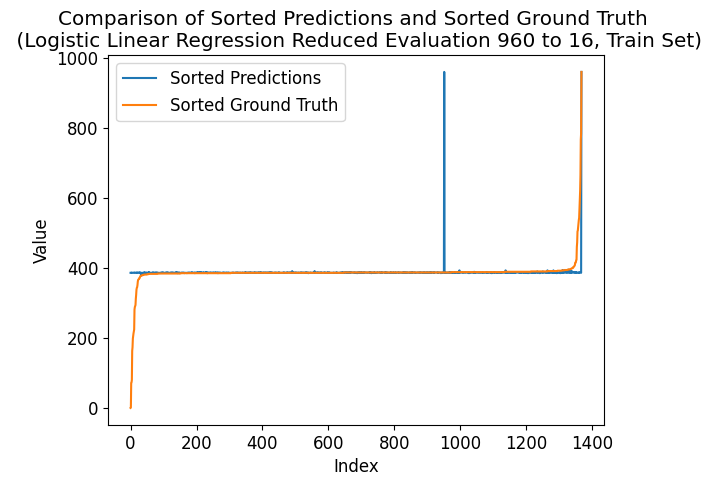

---- ---- ----
class_num = 976
Number of unique elements: 79
[  0.  61. 122. 183. 244. 305. 366. 427. 488. 549. 610. 671. 732. 793.
 854. 915. 976.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


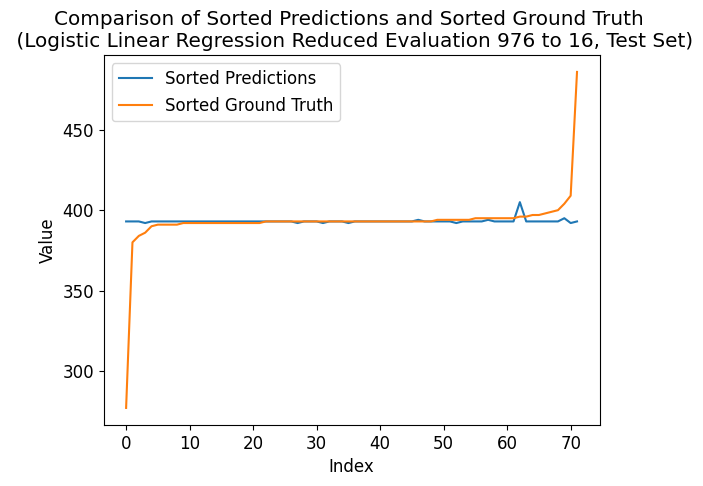

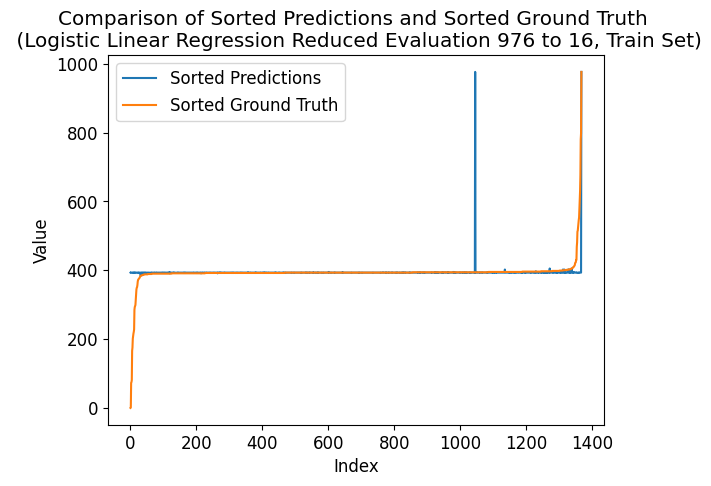

---- ---- ----
class_num = 992
Number of unique elements: 79
[  0.  62. 124. 186. 248. 310. 372. 434. 496. 558. 620. 682. 744. 806.
 868. 930. 992.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


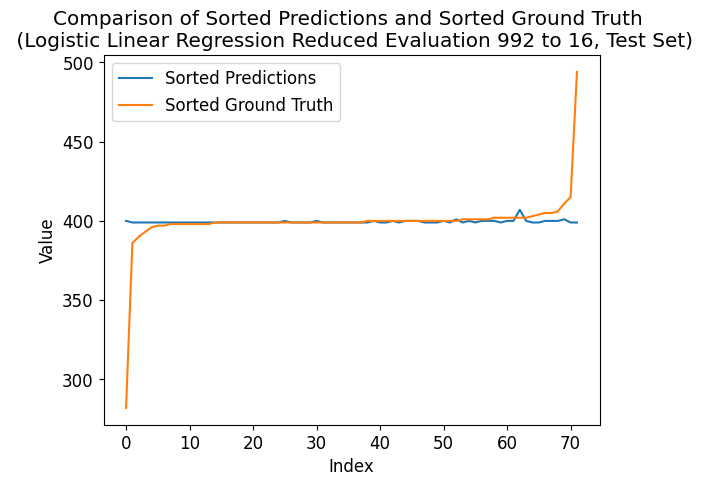

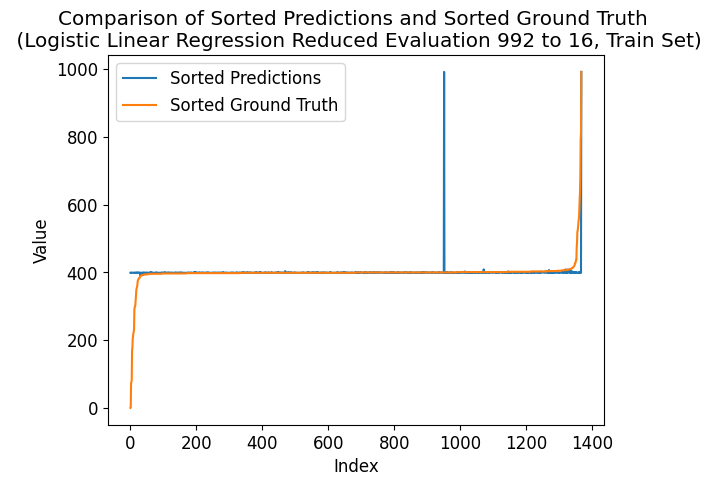

---- ---- ----
class_num = 1008
Number of unique elements: 77
[   0.   63.  126.  189.  252.  315.  378.  441.  504.  567.  630.  693.
  756.  819.  882.  945. 1008.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


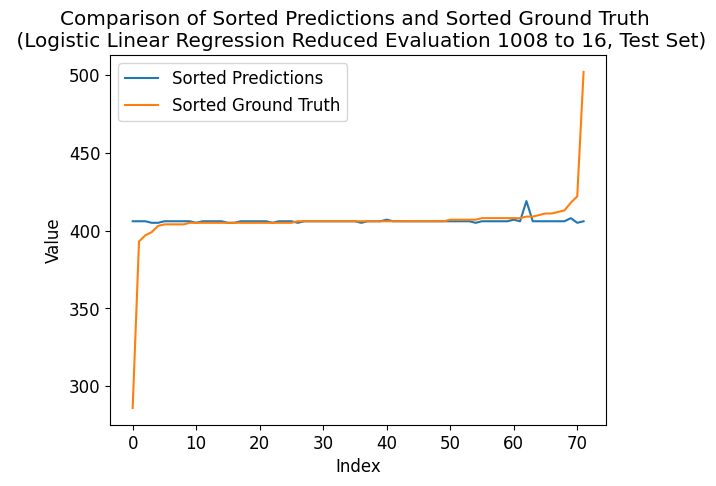

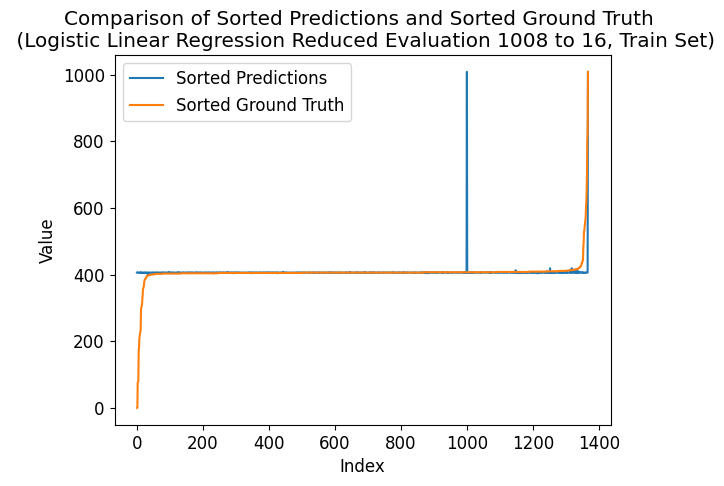

---- ---- ----
class_num = 1024
Number of unique elements: 78
[   0.   64.  128.  192.  256.  320.  384.  448.  512.  576.  640.  704.
  768.  832.  896.  960. 1024.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


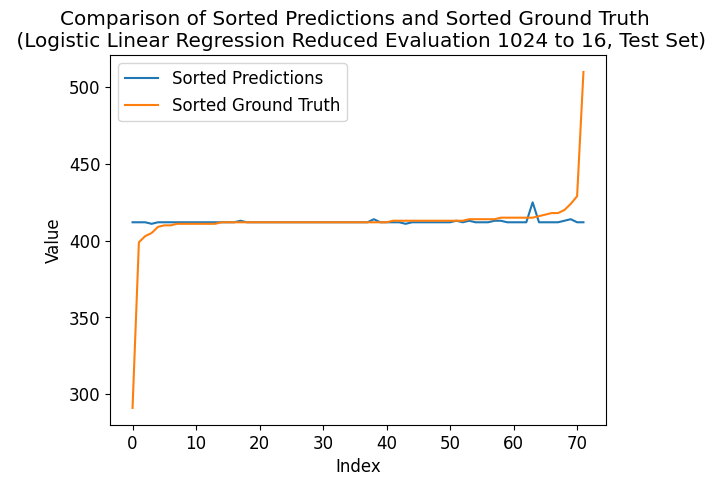

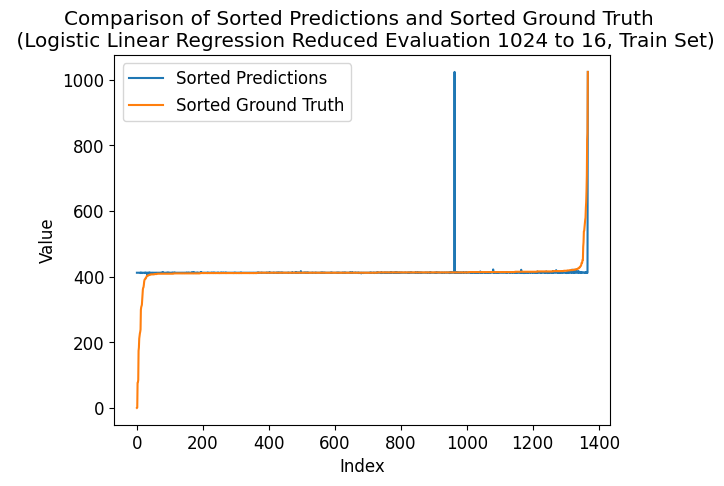

---- ---- ----
class_num = 1040
Number of unique elements: 78
[   0.   65.  130.  195.  260.  325.  390.  455.  520.  585.  650.  715.
  780.  845.  910.  975. 1040.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3830409356725146
Correlation coefficient: 0.3091176872968443
Coefficient of determination (R-squared score, R2 score): -0.0020254884446513355


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


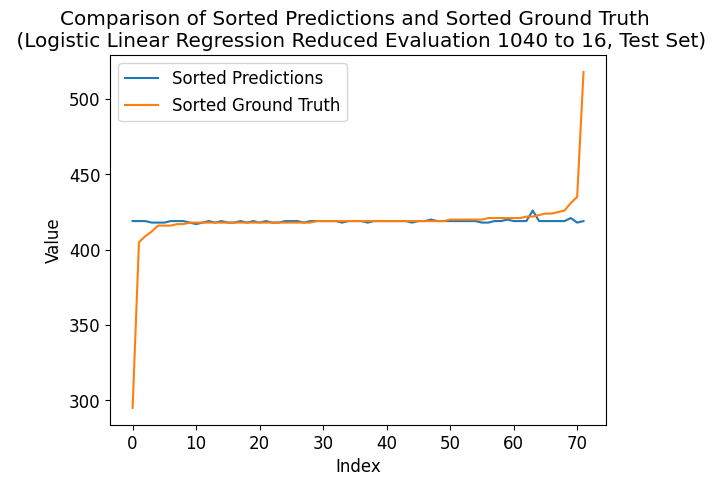

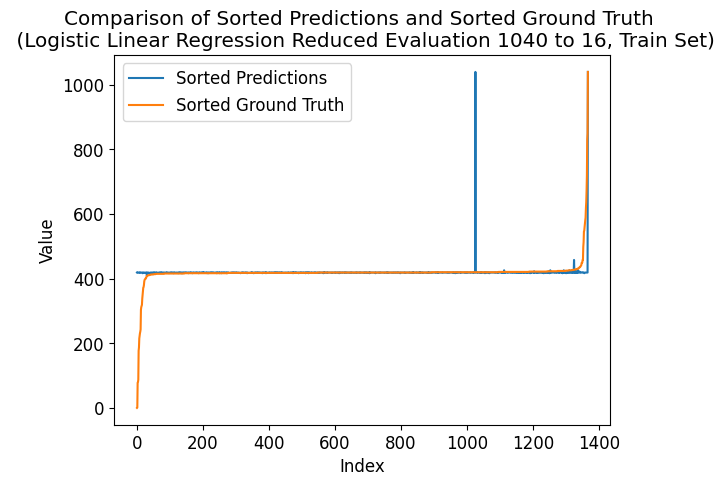

---- ---- ----
class_num = 1056
Number of unique elements: 78
[   0.   66.  132.  198.  264.  330.  396.  462.  528.  594.  660.  726.
  792.  858.  924.  990. 1056.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


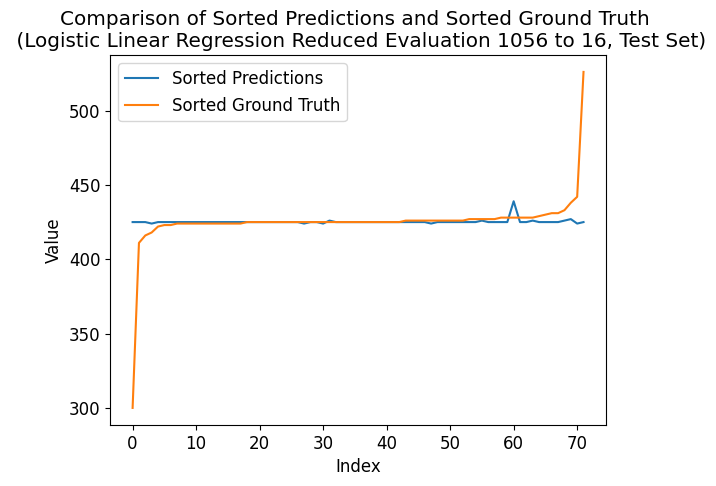

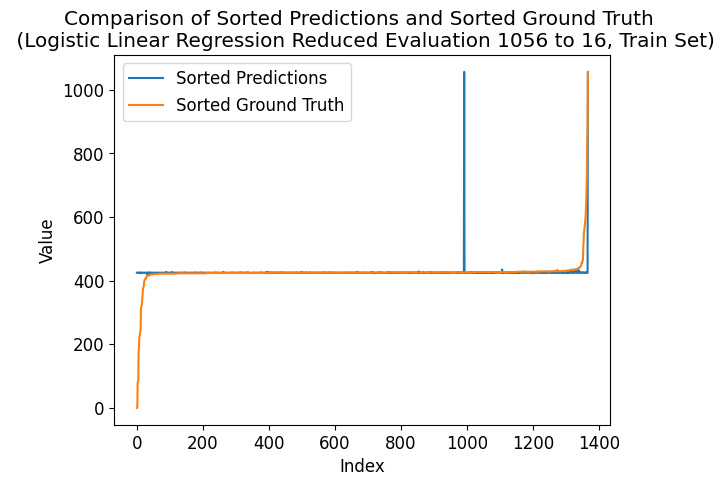

---- ---- ----
class_num = 1072
Number of unique elements: 79
[   0.   67.  134.  201.  268.  335.  402.  469.  536.  603.  670.  737.
  804.  871.  938. 1005. 1072.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3830409356725146
Correlation coefficient: 0.3091176872968443
Coefficient of determination (R-squared score, R2 score): -0.0020254884446513355


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


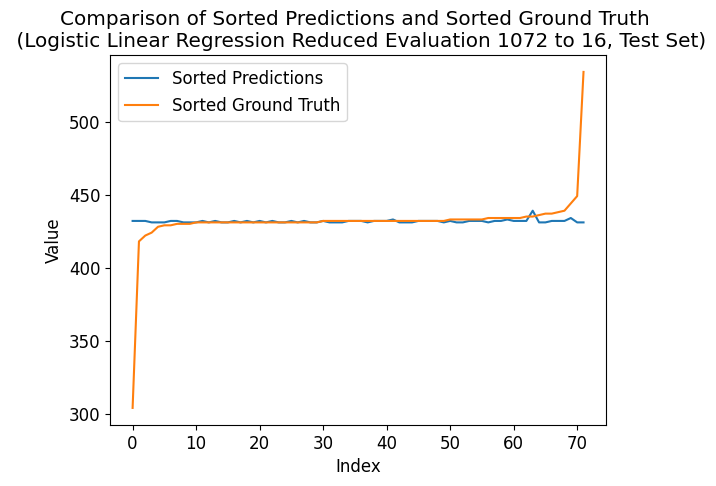

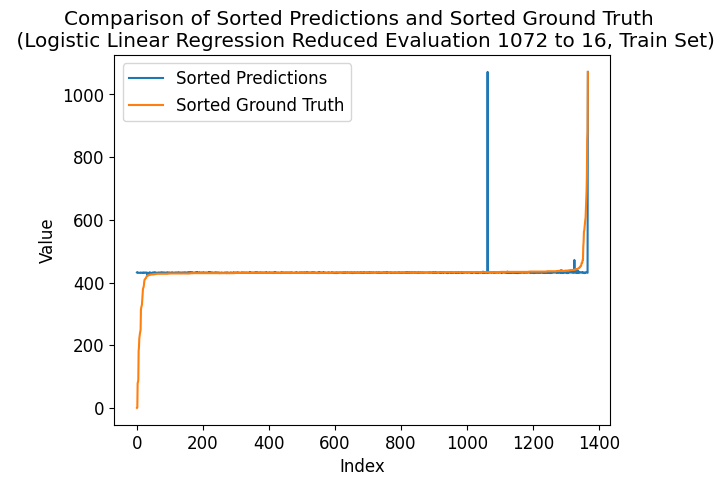

---- ---- ----
class_num = 1088
Number of unique elements: 80
[   0.   68.  136.  204.  272.  340.  408.  476.  544.  612.  680.  748.
  816.  884.  952. 1020. 1088.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


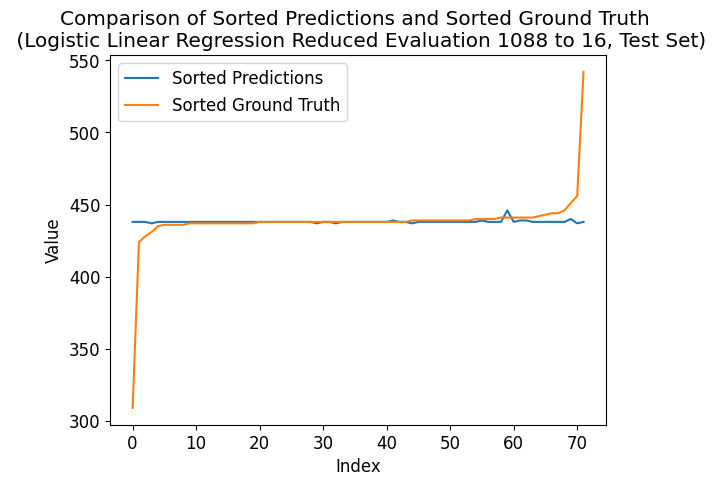

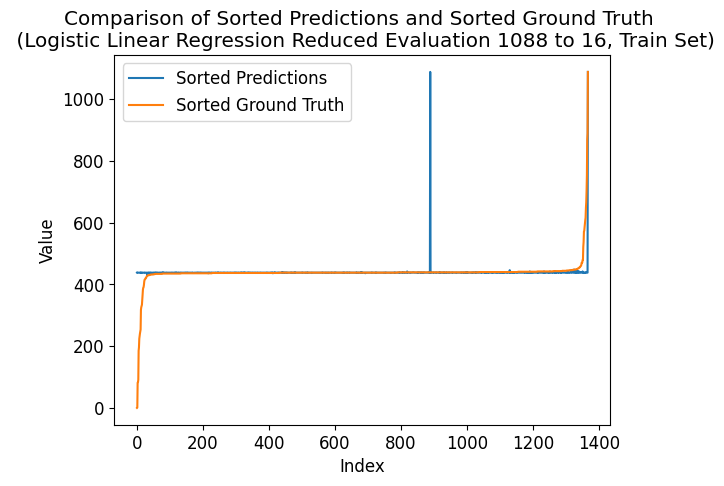

---- ---- ----
class_num = 1104
Number of unique elements: 80
[   0.   69.  138.  207.  276.  345.  414.  483.  552.  621.  690.  759.
  828.  897.  966. 1035. 1104.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


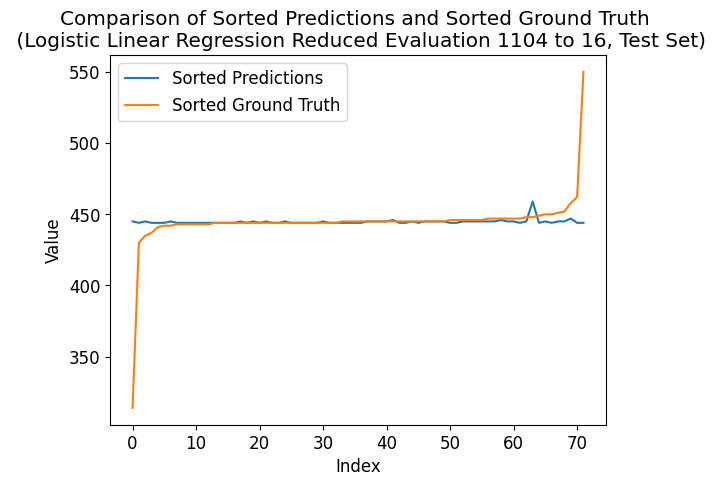

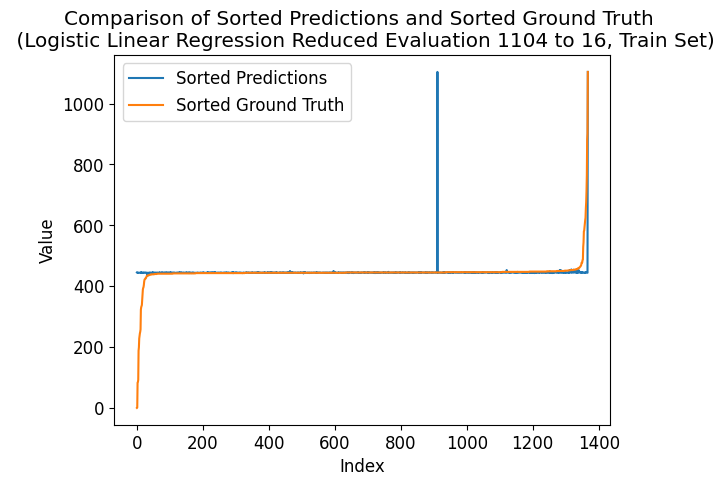

---- ---- ----
class_num = 1120
Number of unique elements: 81
[   0.   70.  140.  210.  280.  350.  420.  490.  560.  630.  700.  770.
  840.  910.  980. 1050. 1120.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


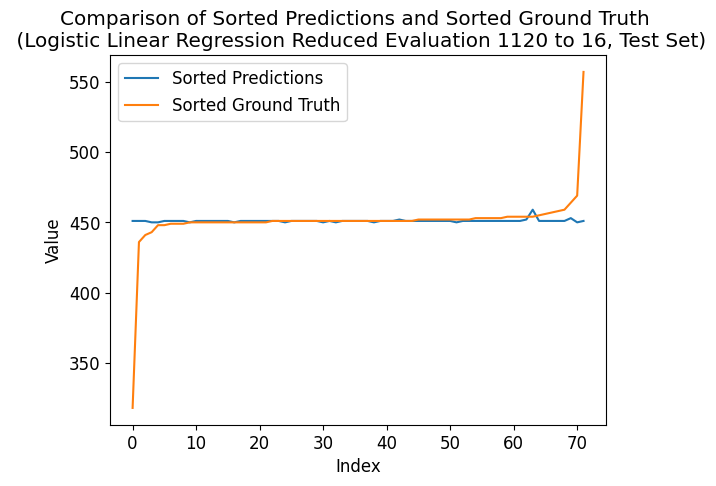

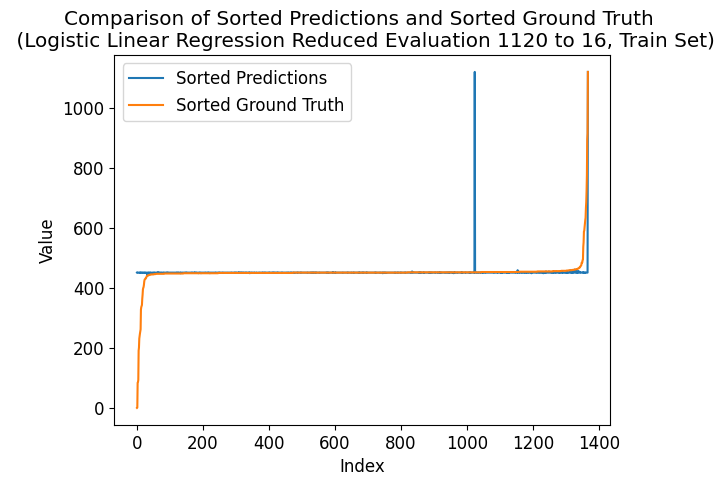

---- ---- ----
class_num = 1136
Number of unique elements: 82
[   0.   71.  142.  213.  284.  355.  426.  497.  568.  639.  710.  781.
  852.  923.  994. 1065. 1136.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


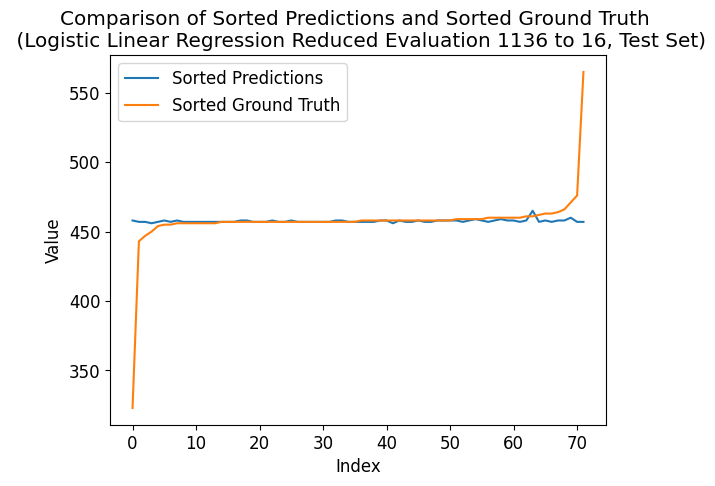

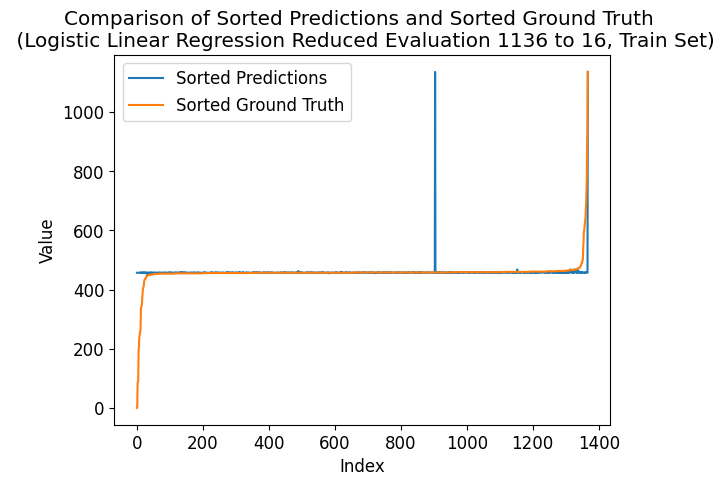

---- ---- ----
class_num = 1152
Number of unique elements: 83
[   0.   72.  144.  216.  288.  360.  432.  504.  576.  648.  720.  792.
  864.  936. 1008. 1080. 1152.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


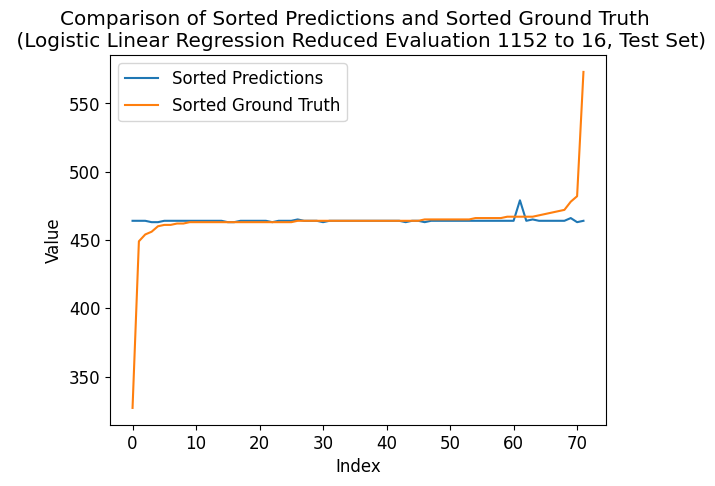

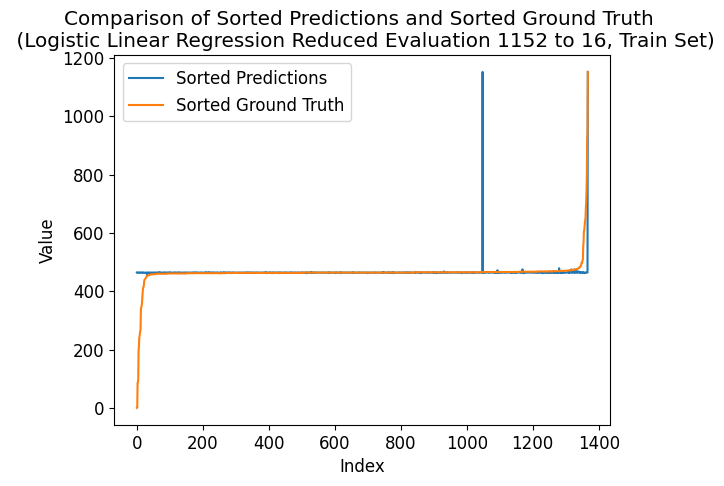

---- ---- ----
class_num = 1168
Number of unique elements: 83
[   0.   73.  146.  219.  292.  365.  438.  511.  584.  657.  730.  803.
  876.  949. 1022. 1095. 1168.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


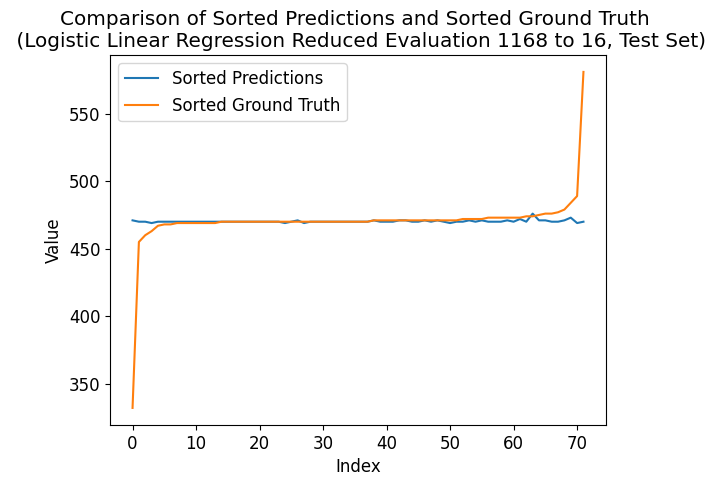

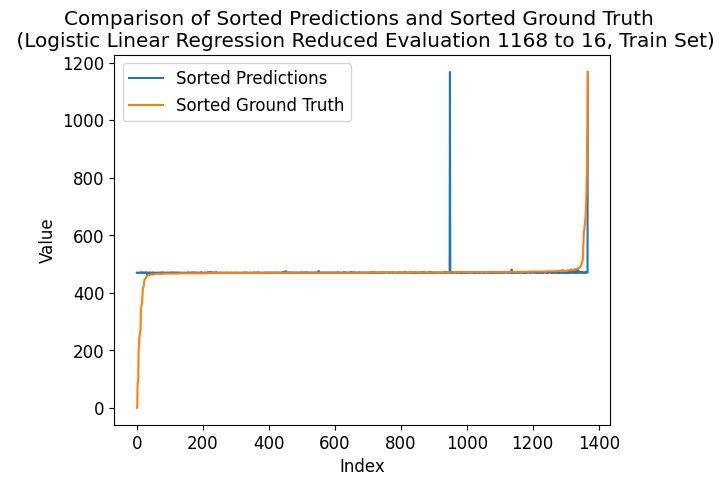

---- ---- ----
class_num = 1184
Number of unique elements: 84
[   0.   74.  148.  222.  296.  370.  444.  518.  592.  666.  740.  814.
  888.  962. 1036. 1110. 1184.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


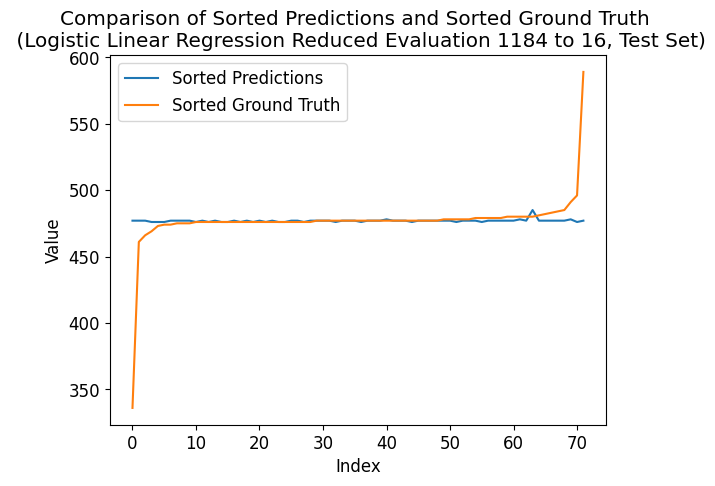

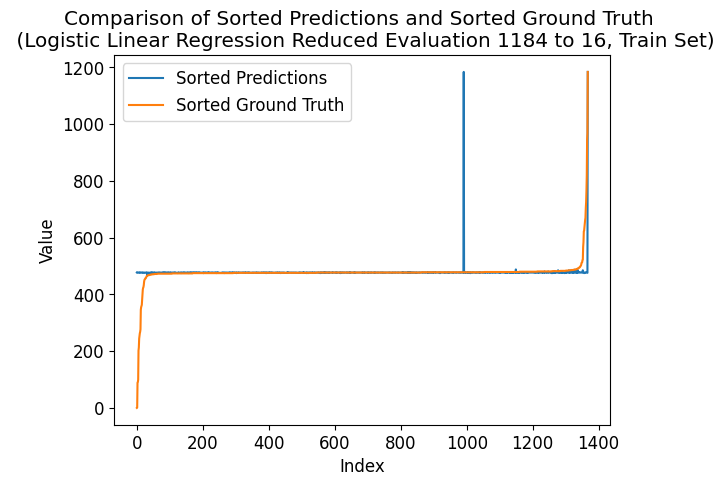

---- ---- ----
class_num = 1200
Number of unique elements: 83
[   0.   75.  150.  225.  300.  375.  450.  525.  600.  675.  750.  825.
  900.  975. 1050. 1125. 1200.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


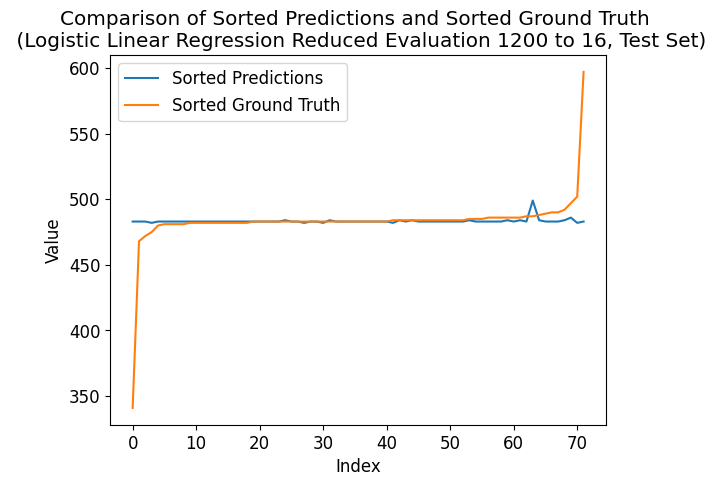

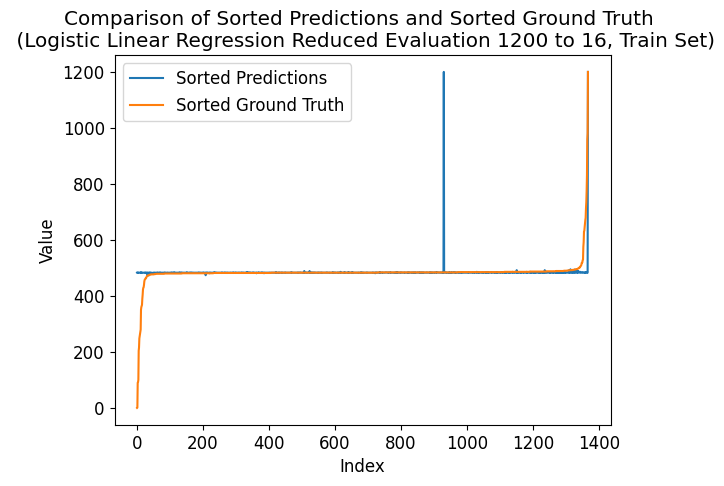

---- ---- ----
class_num = 1216
Number of unique elements: 84
[   0.   76.  152.  228.  304.  380.  456.  532.  608.  684.  760.  836.
  912.  988. 1064. 1140. 1216.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


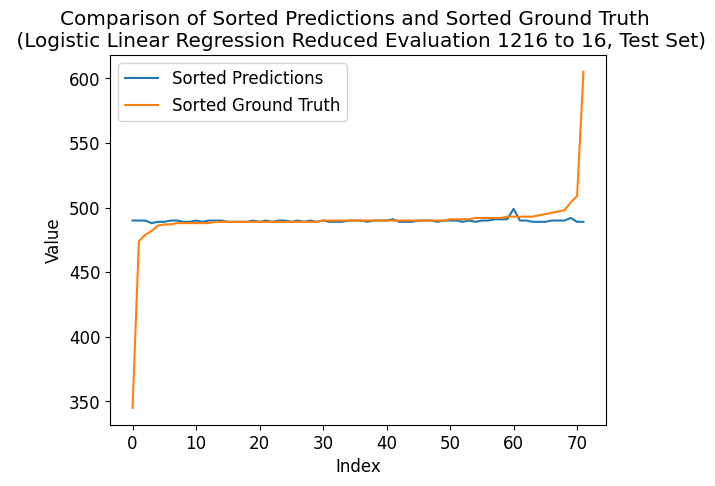

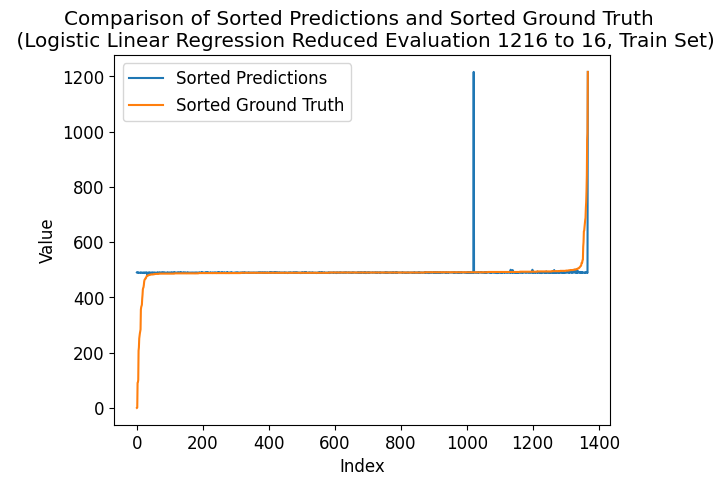

---- ---- ----
class_num = 1232
Number of unique elements: 83
[   0.   77.  154.  231.  308.  385.  462.  539.  616.  693.  770.  847.
  924. 1001. 1078. 1155. 1232.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


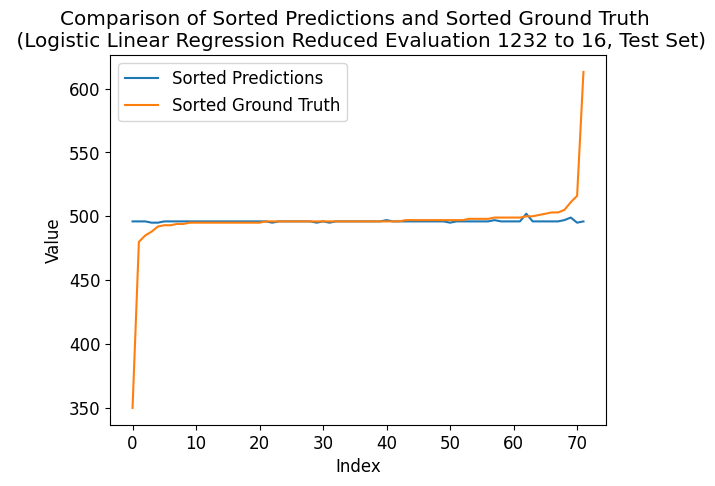

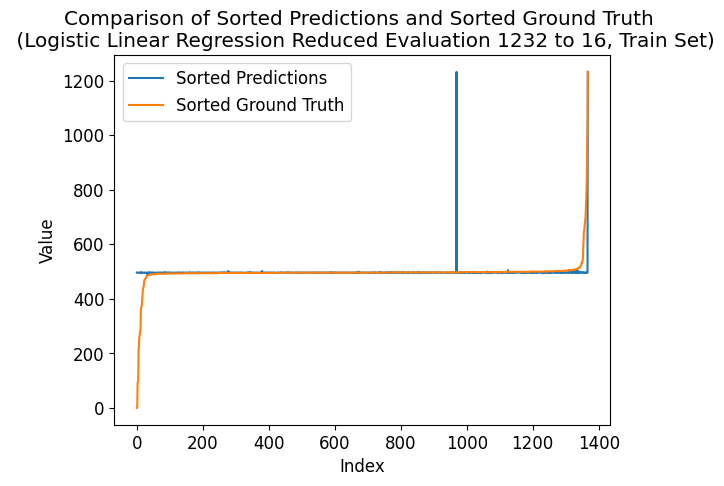

---- ---- ----
class_num = 1248
Number of unique elements: 84
[   0.   78.  156.  234.  312.  390.  468.  546.  624.  702.  780.  858.
  936. 1014. 1092. 1170. 1248.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


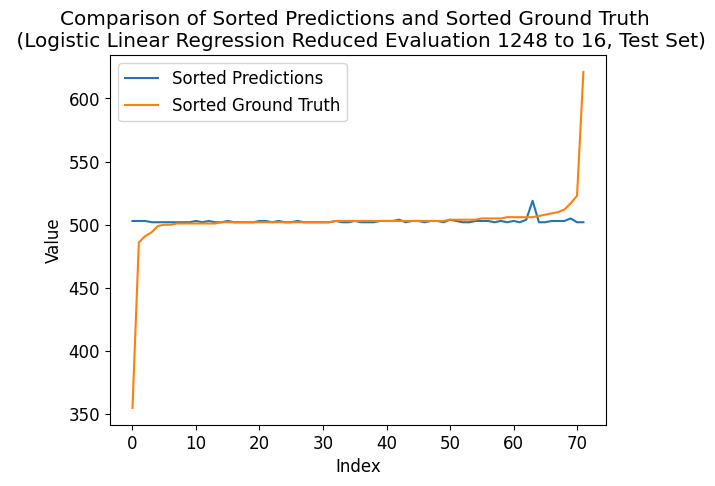

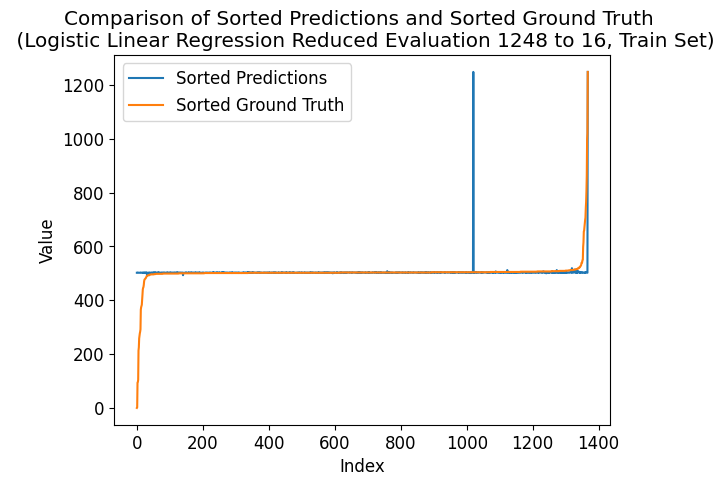

---- ---- ----
class_num = 1264
Number of unique elements: 85
[   0.   79.  158.  237.  316.  395.  474.  553.  632.  711.  790.  869.
  948. 1027. 1106. 1185. 1264.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


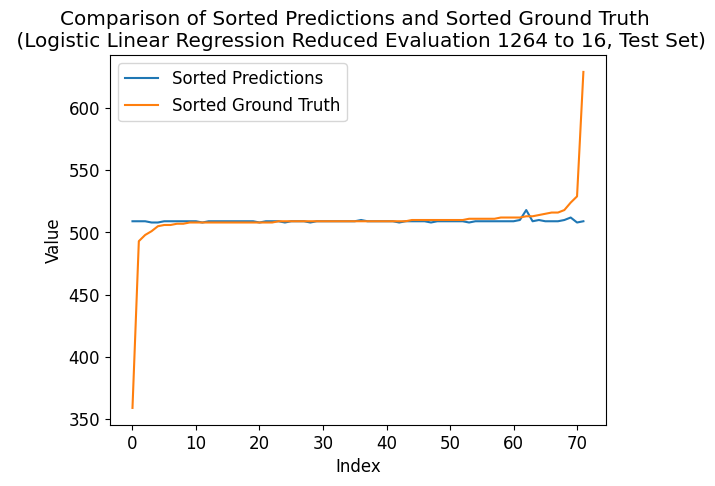

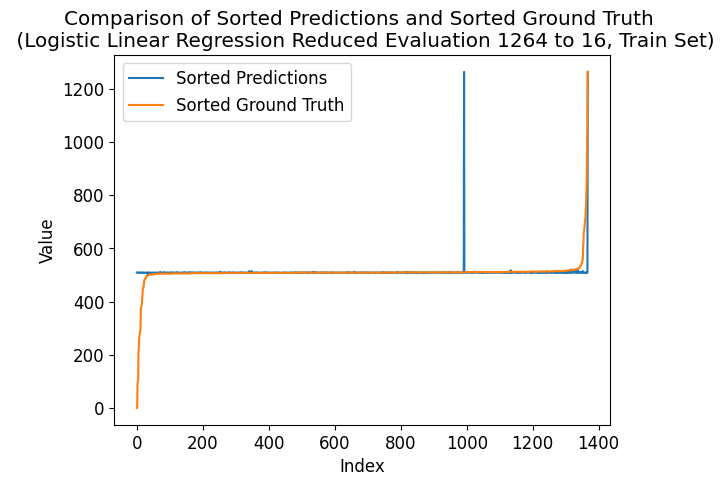

---- ---- ----
class_num = 1280
Number of unique elements: 84
[   0.   80.  160.  240.  320.  400.  480.  560.  640.  720.  800.  880.
  960. 1040. 1120. 1200. 1280.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


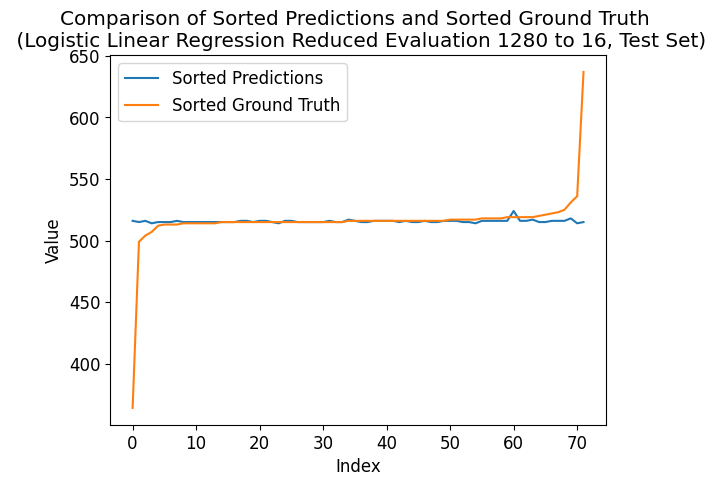

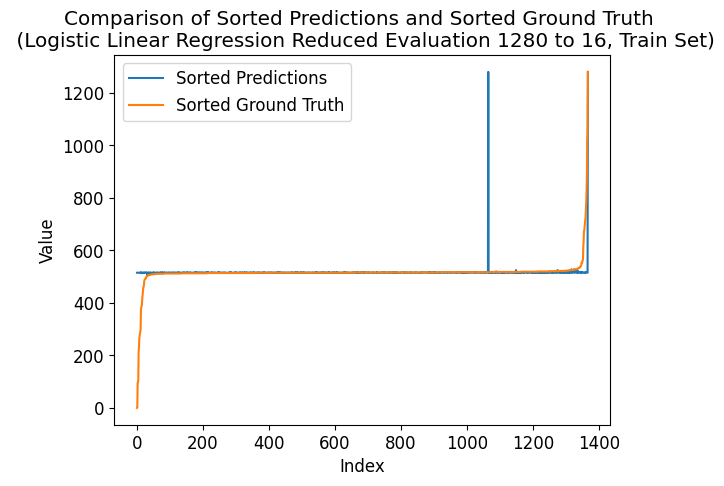

---- ---- ----
class_num = 1296
Number of unique elements: 84
[   0.   81.  162.  243.  324.  405.  486.  567.  648.  729.  810.  891.
  972. 1053. 1134. 1215. 1296.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


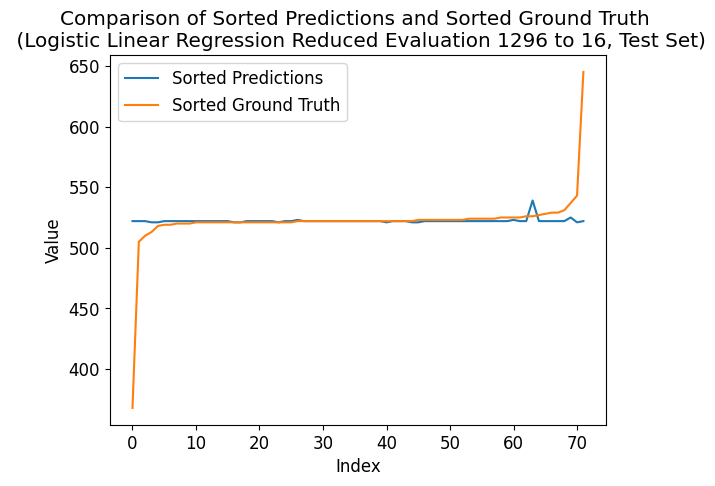

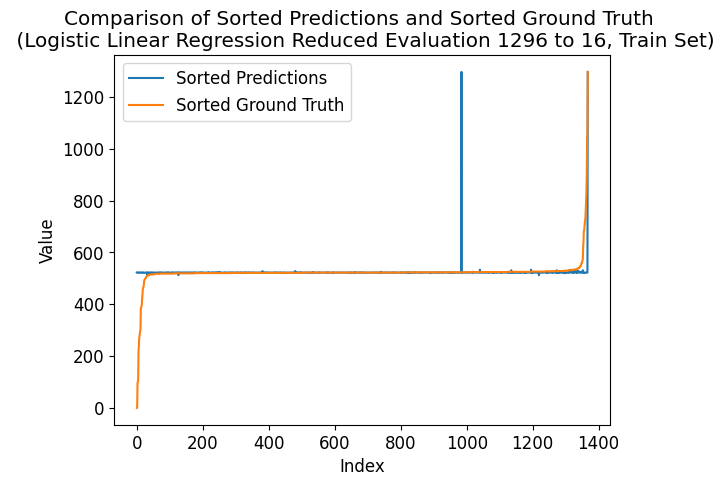

---- ---- ----
class_num = 1312
Number of unique elements: 84
[   0.   82.  164.  246.  328.  410.  492.  574.  656.  738.  820.  902.
  984. 1066. 1148. 1230. 1312.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3830409356725146
Correlation coefficient: 0.3091176872968443
Coefficient of determination (R-squared score, R2 score): -0.0020254884446513355


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


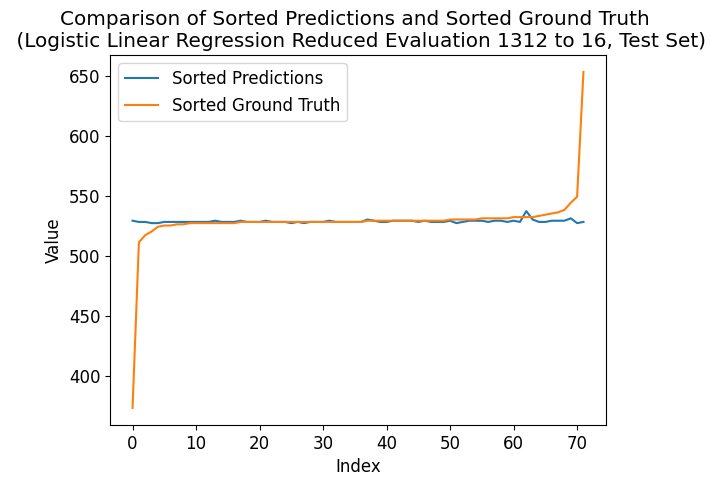

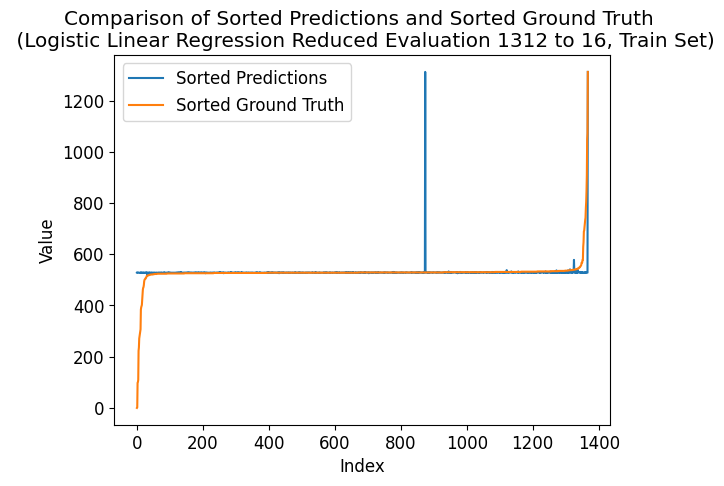

---- ---- ----
class_num = 1328
Number of unique elements: 87
[   0.   83.  166.  249.  332.  415.  498.  581.  664.  747.  830.  913.
  996. 1079. 1162. 1245. 1328.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3830409356725146
Correlation coefficient: 0.3091176872968443
Coefficient of determination (R-squared score, R2 score): -0.0020254884446513355


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


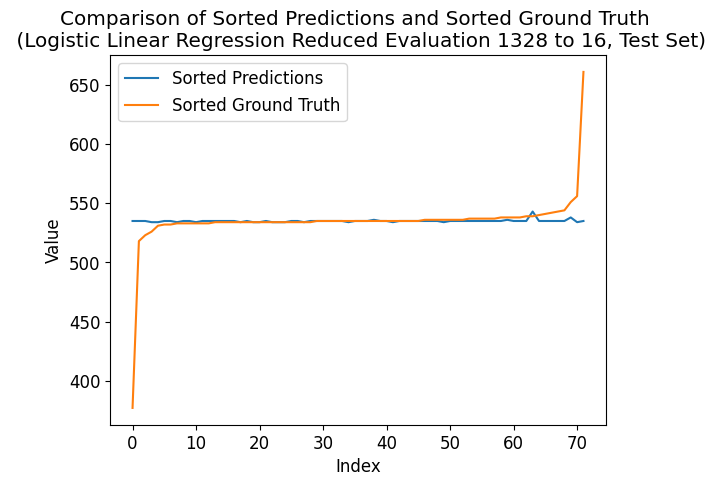

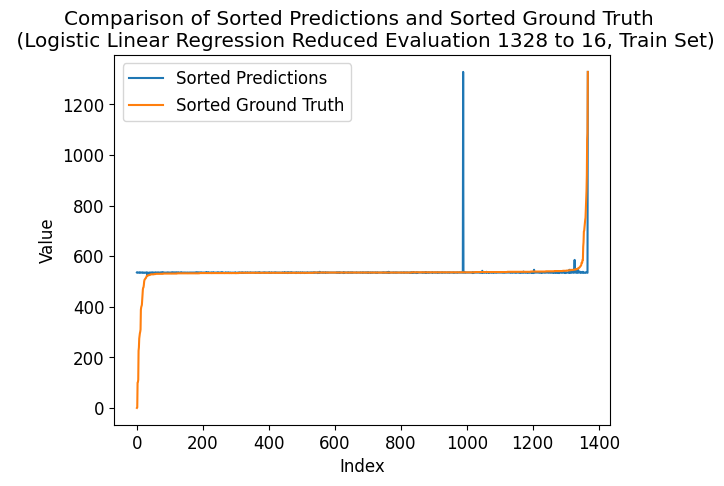

---- ---- ----
class_num = 1344
Number of unique elements: 86
[   0.   84.  168.  252.  336.  420.  504.  588.  672.  756.  840.  924.
 1008. 1092. 1176. 1260. 1344.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3830409356725146
Correlation coefficient: 0.3091176872968443
Coefficient of determination (R-squared score, R2 score): -0.0020254884446513355


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


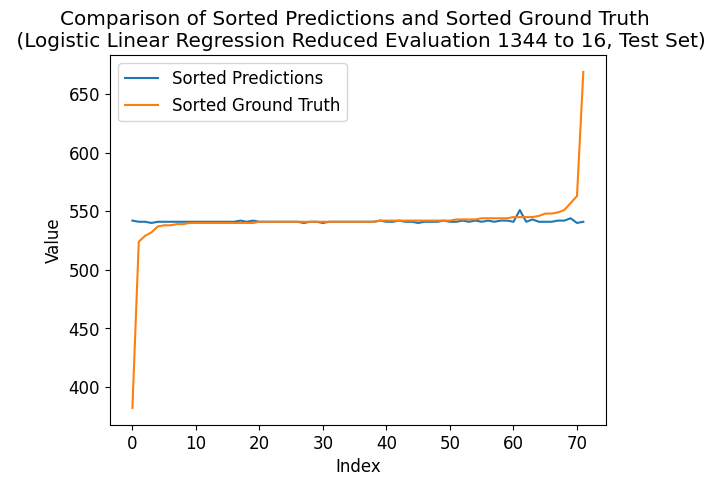

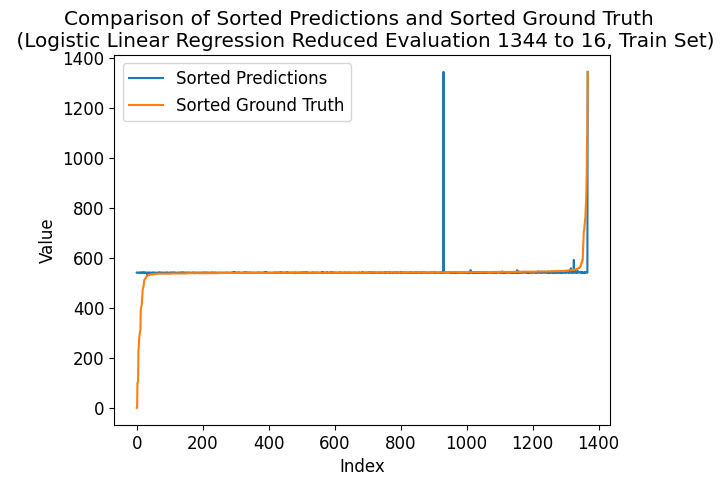

---- ---- ----
class_num = 1360
Number of unique elements: 85
[   0.   85.  170.  255.  340.  425.  510.  595.  680.  765.  850.  935.
 1020. 1105. 1190. 1275. 1360.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.38377192982456143
Correlation coefficient: 0.308394660921587
Coefficient of determination (R-squared score, R2 score): -0.003937750827179398


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


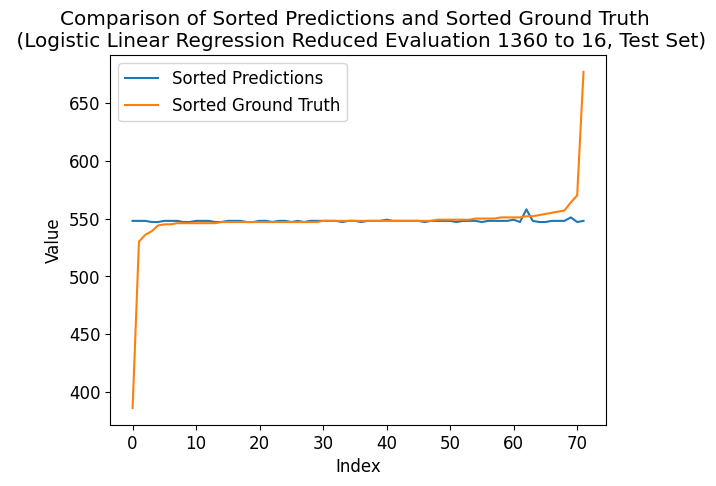

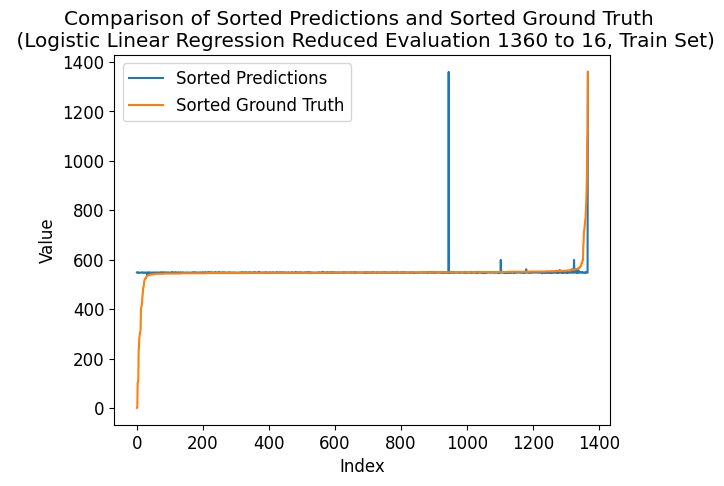

---- ---- ----
class_num = 1376
Number of unique elements: 89
[   0.   86.  172.  258.  344.  430.  516.  602.  688.  774.  860.  946.
 1032. 1118. 1204. 1290. 1376.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


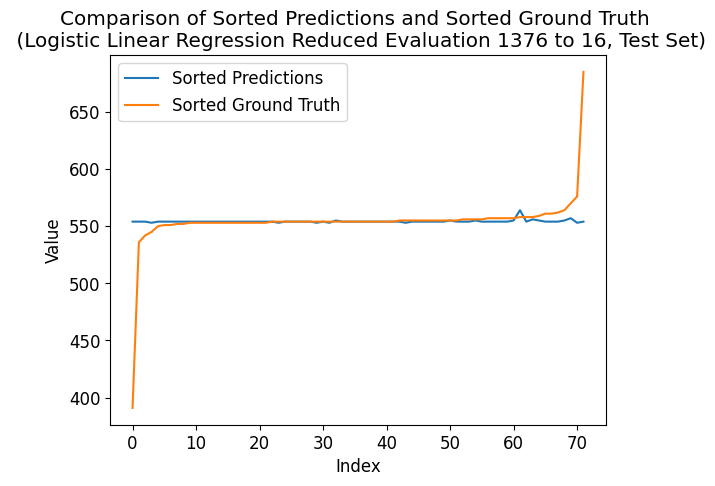

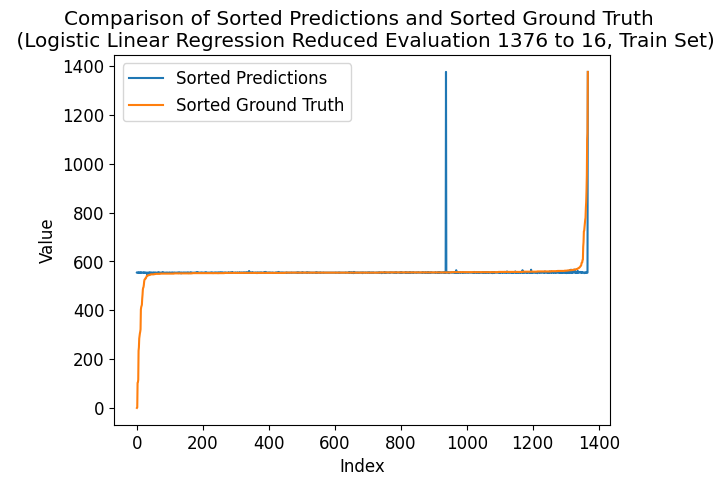

---- ---- ----
class_num = 1392
Number of unique elements: 88
[   0.   87.  174.  261.  348.  435.  522.  609.  696.  783.  870.  957.
 1044. 1131. 1218. 1305. 1392.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


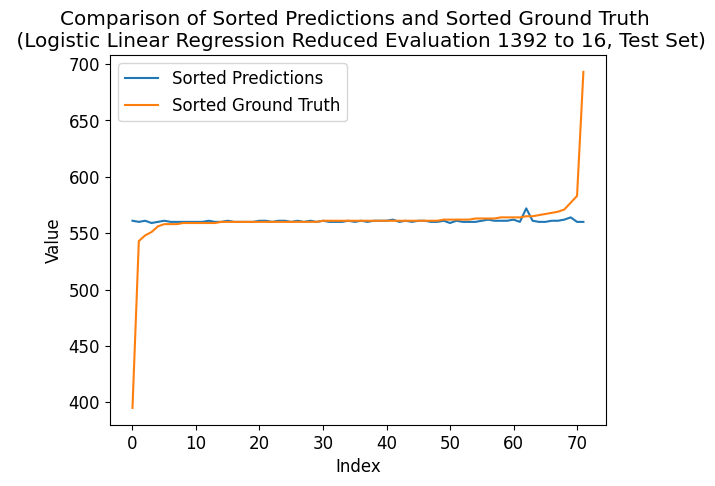

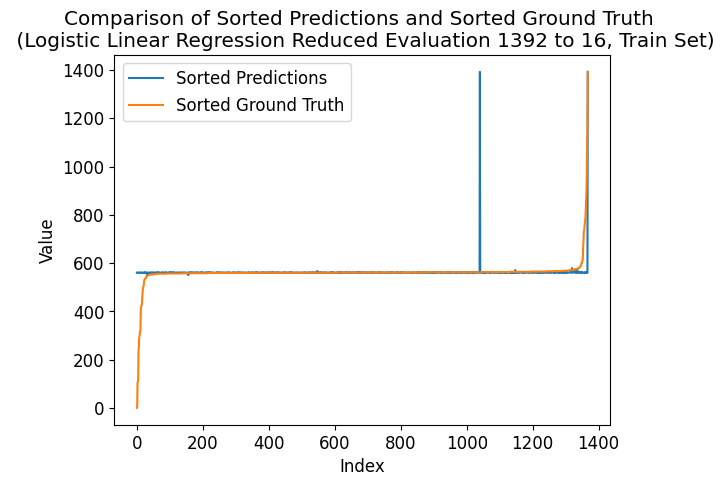

---- ---- ----
class_num = 1408
Number of unique elements: 87
[   0.   88.  176.  264.  352.  440.  528.  616.  704.  792.  880.  968.
 1056. 1144. 1232. 1320. 1408.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


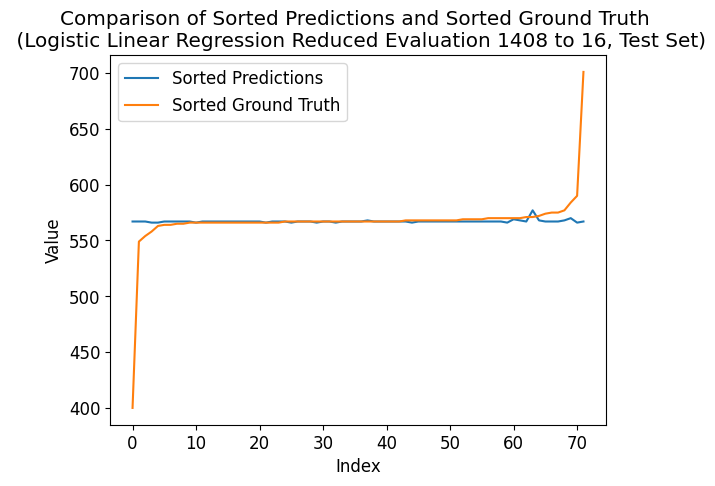

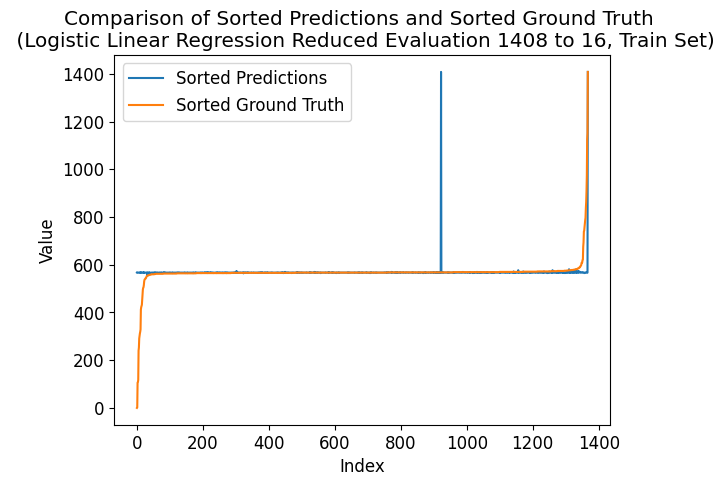

---- ---- ----
class_num = 1424
Number of unique elements: 90
[   0.   89.  178.  267.  356.  445.  534.  623.  712.  801.  890.  979.
 1068. 1157. 1246. 1335. 1424.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


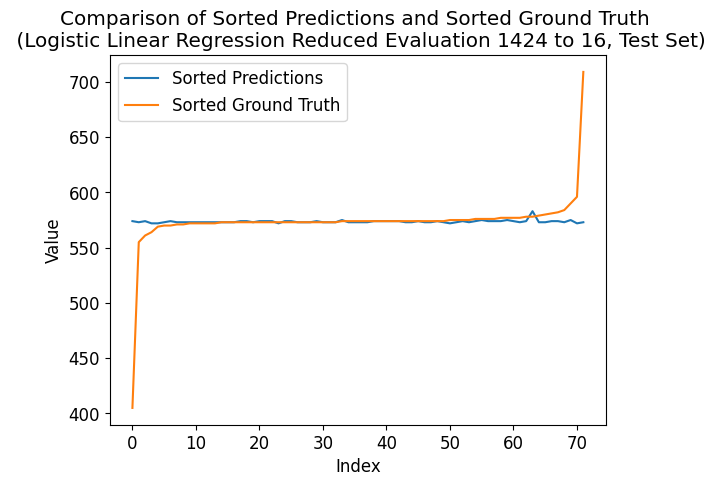

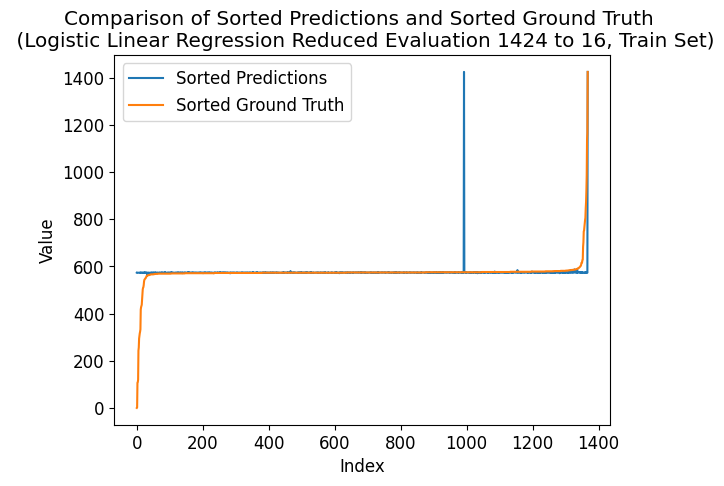

---- ---- ----
class_num = 1440
Number of unique elements: 90
[   0.   90.  180.  270.  360.  450.  540.  630.  720.  810.  900.  990.
 1080. 1170. 1260. 1350. 1440.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


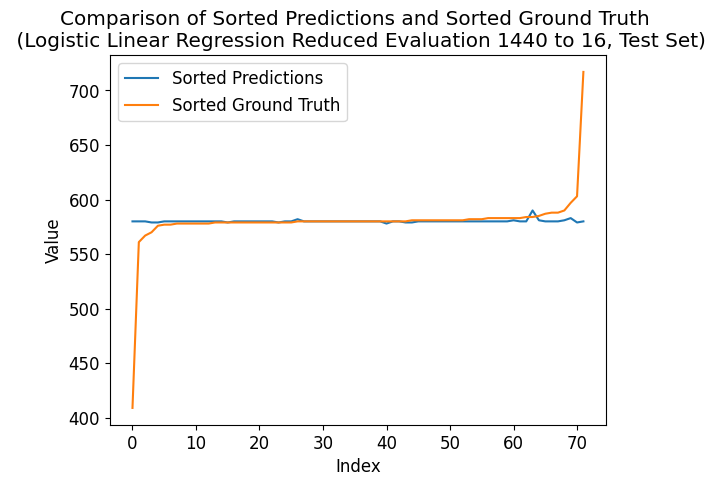

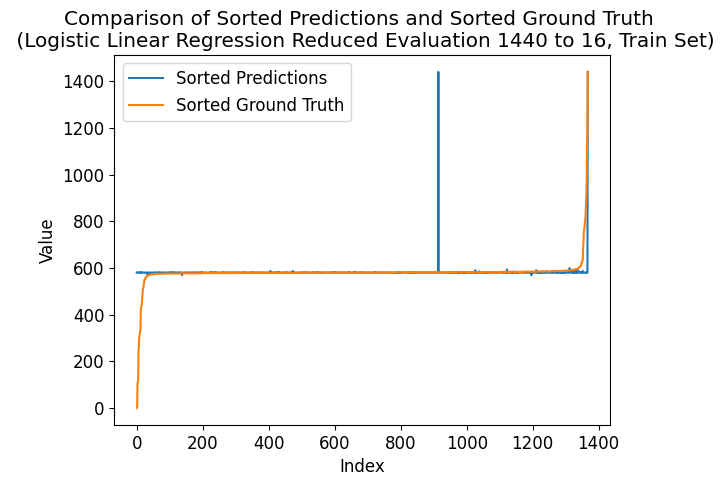

---- ---- ----
class_num = 1456
Number of unique elements: 88
[   0.   91.  182.  273.  364.  455.  546.  637.  728.  819.  910. 1001.
 1092. 1183. 1274. 1365. 1456.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


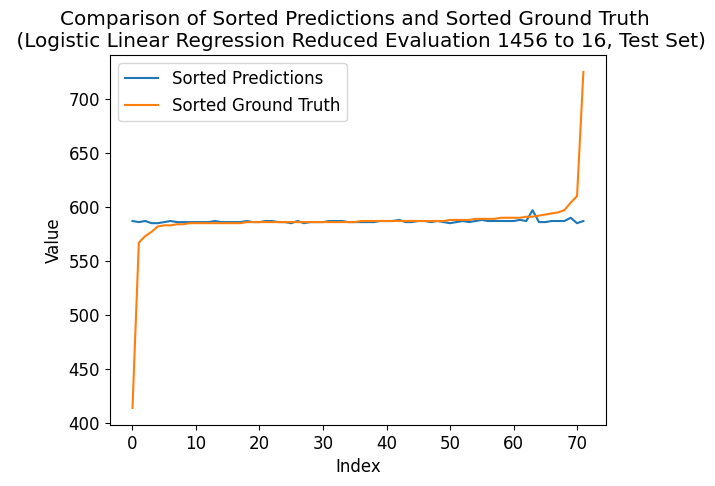

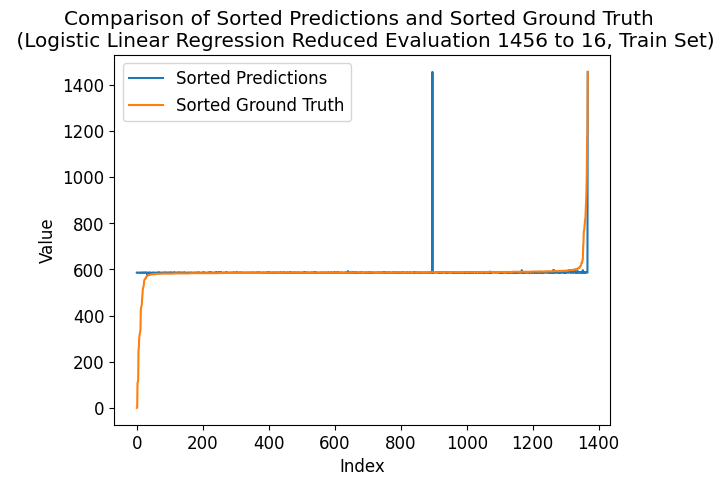

---- ---- ----
class_num = 1472
Number of unique elements: 89
[   0.   92.  184.  276.  368.  460.  552.  644.  736.  828.  920. 1012.
 1104. 1196. 1288. 1380. 1472.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


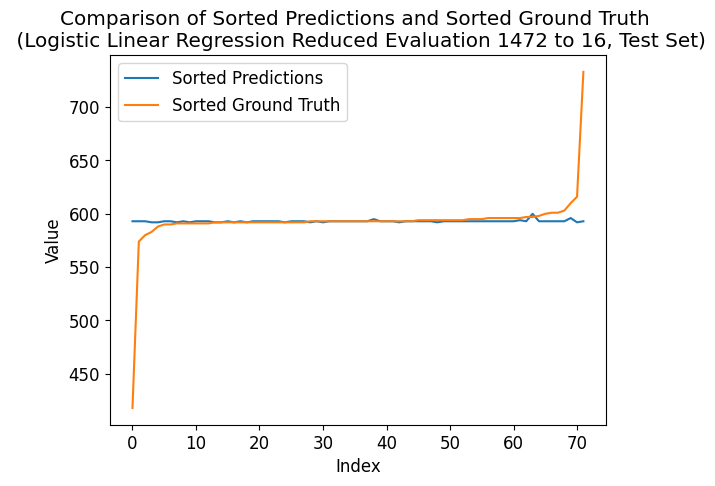

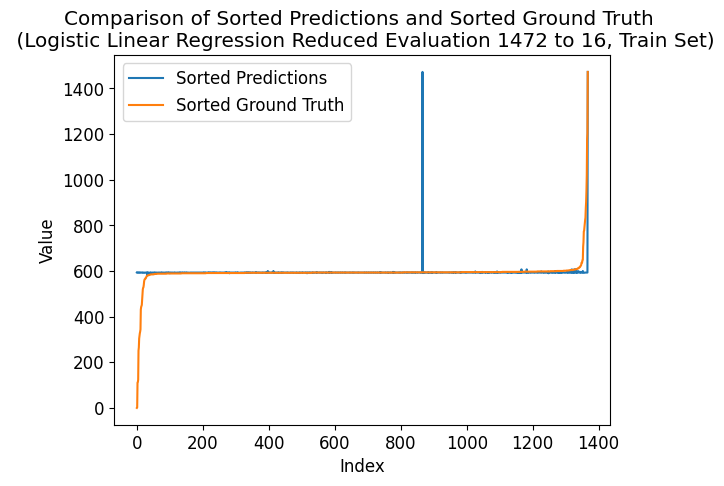

---- ---- ----
class_num = 1488
Number of unique elements: 90
[   0.   93.  186.  279.  372.  465.  558.  651.  744.  837.  930. 1023.
 1116. 1209. 1302. 1395. 1488.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


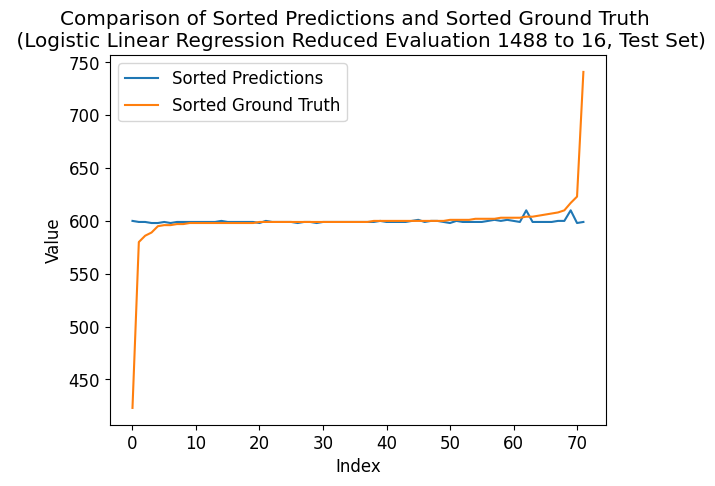

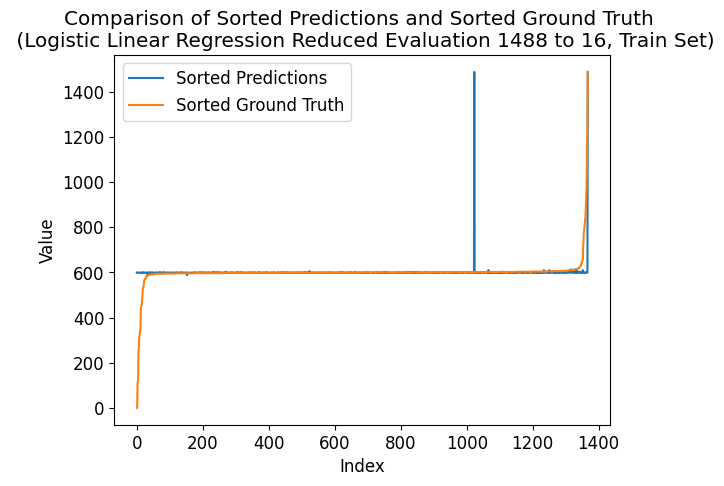

---- ---- ----
class_num = 1504
Number of unique elements: 90
[   0.   94.  188.  282.  376.  470.  564.  658.  752.  846.  940. 1034.
 1128. 1222. 1316. 1410. 1504.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


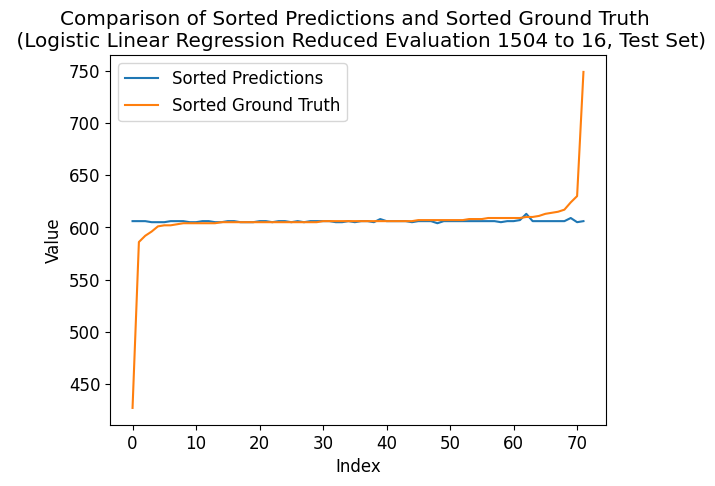

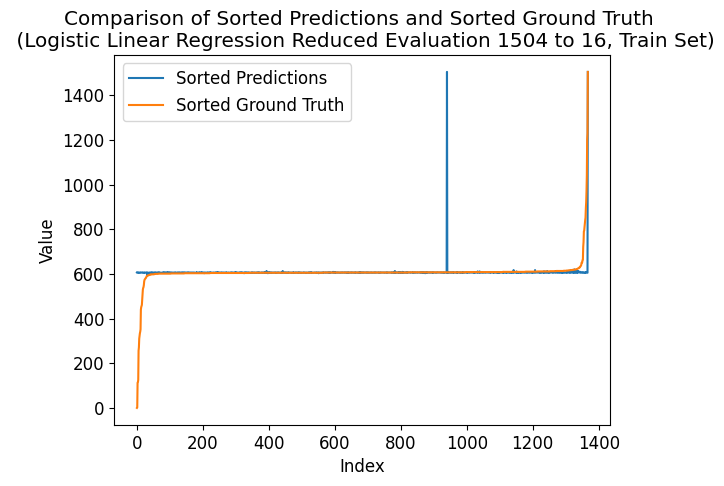

---- ---- ----
class_num = 1520
Number of unique elements: 91
[   0.   95.  190.  285.  380.  475.  570.  665.  760.  855.  950. 1045.
 1140. 1235. 1330. 1425. 1520.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


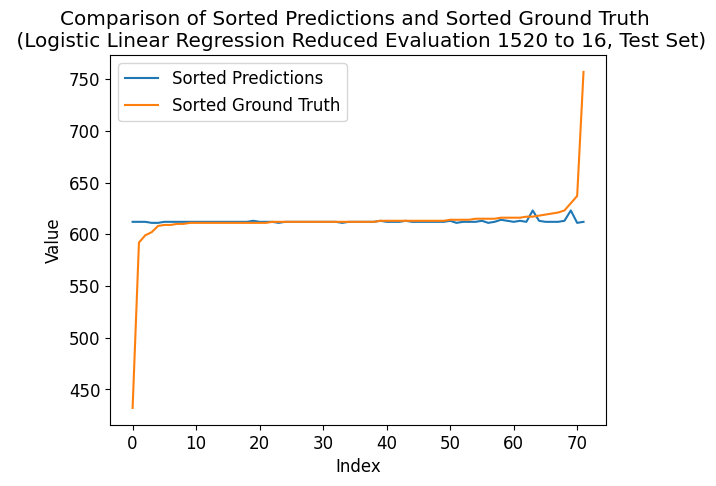

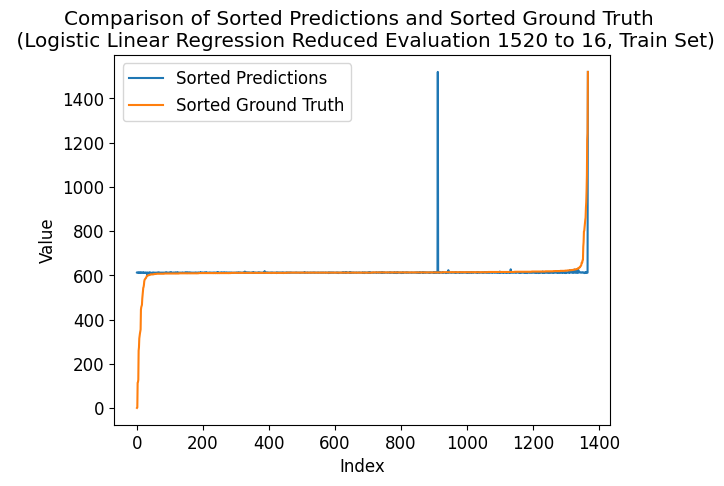

---- ---- ----
class_num = 1536
Number of unique elements: 91
[   0.   96.  192.  288.  384.  480.  576.  672.  768.  864.  960. 1056.
 1152. 1248. 1344. 1440. 1536.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


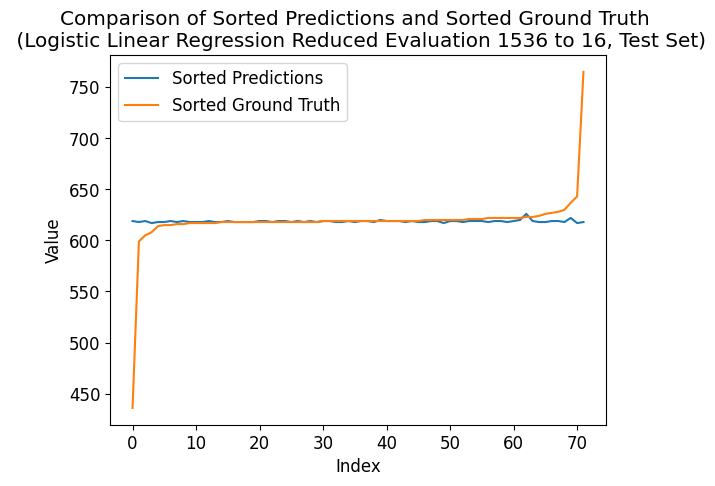

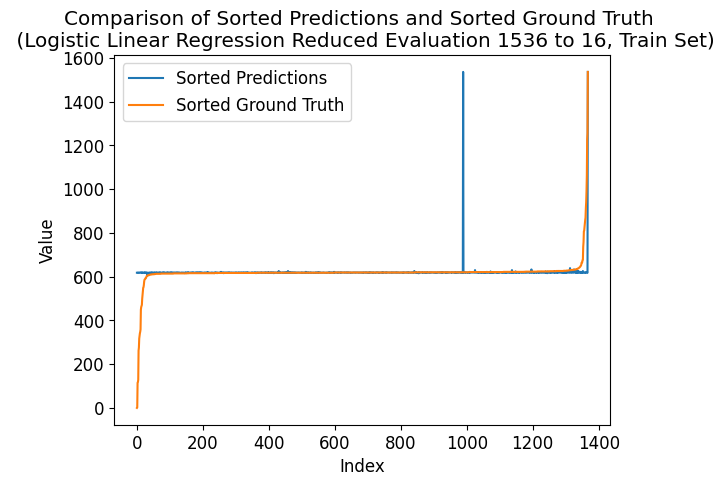

---- ---- ----
class_num = 1552
Number of unique elements: 91
[   0.   97.  194.  291.  388.  485.  582.  679.  776.  873.  970. 1067.
 1164. 1261. 1358. 1455. 1552.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


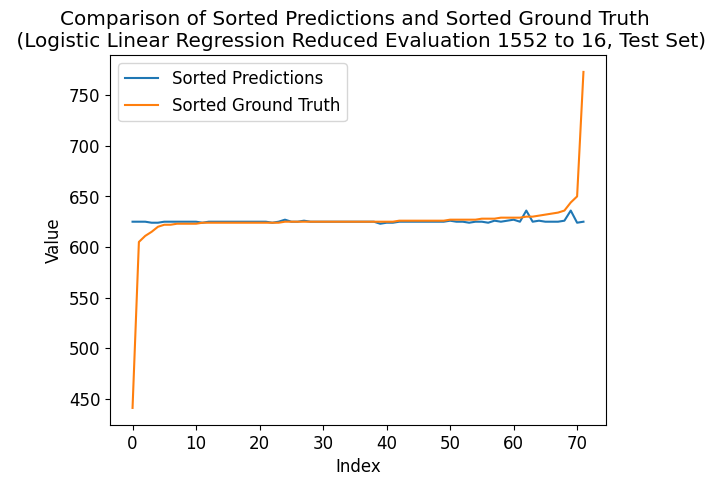

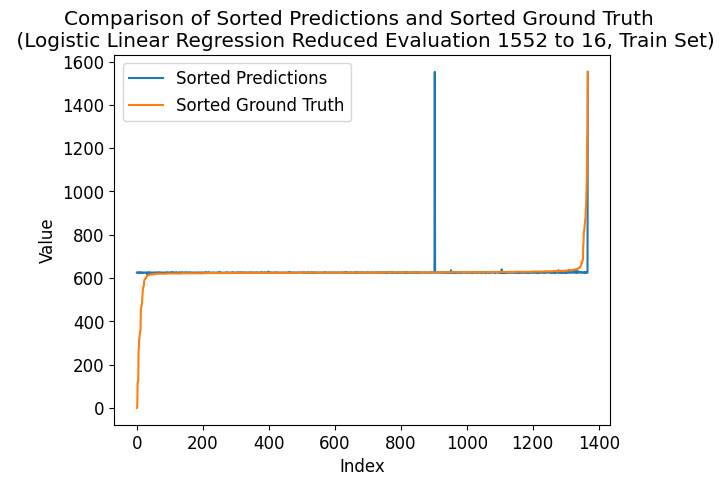

---- ---- ----
class_num = 1568
Number of unique elements: 92
[   0.   98.  196.  294.  392.  490.  588.  686.  784.  882.  980. 1078.
 1176. 1274. 1372. 1470. 1568.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


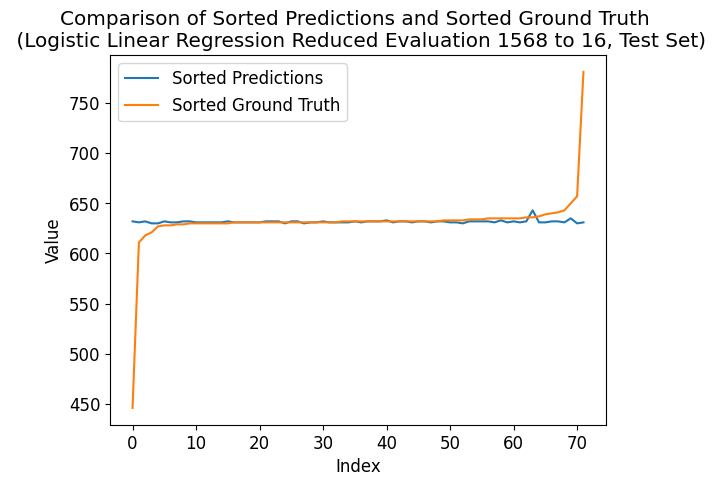

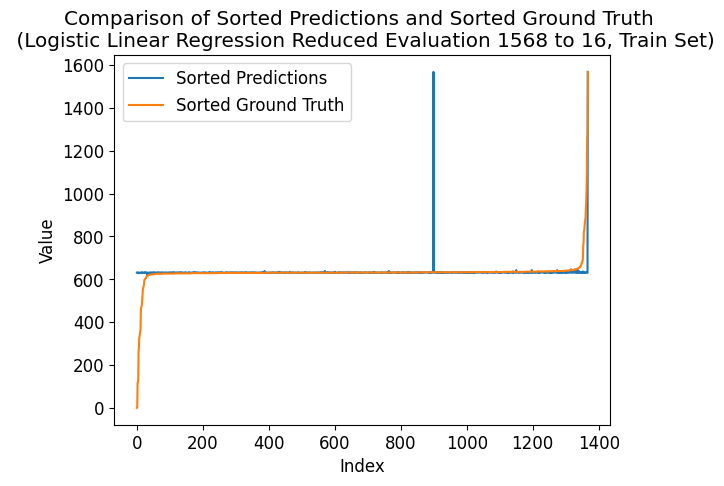

---- ---- ----
class_num = 1584
Number of unique elements: 92
[   0.   99.  198.  297.  396.  495.  594.  693.  792.  891.  990. 1089.
 1188. 1287. 1386. 1485. 1584.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


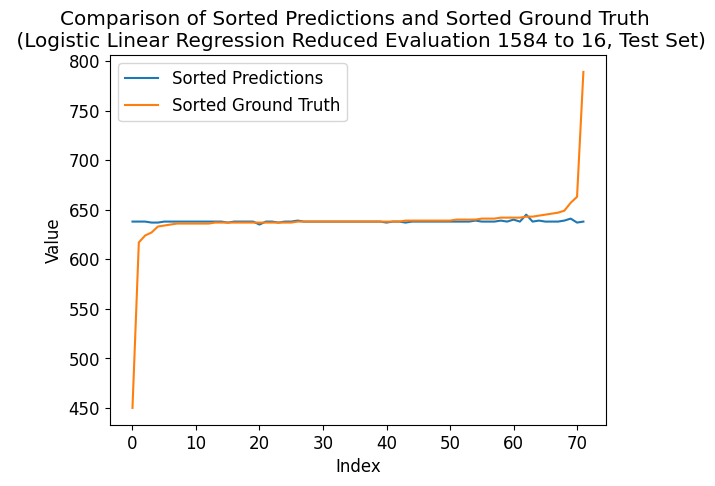

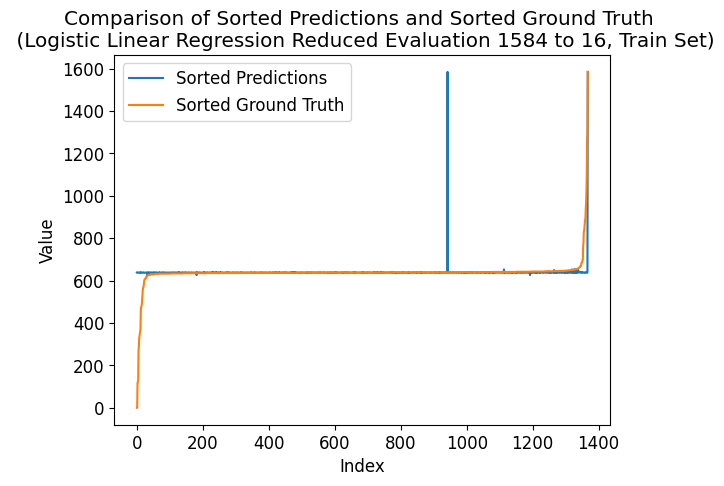

---- ---- ----
class_num = 1600
Number of unique elements: 94
[   0.  100.  200.  300.  400.  500.  600.  700.  800.  900. 1000. 1100.
 1200. 1300. 1400. 1500. 1600.]
test eval:
Mean squared error: 0.06944444444444445
Correlation coefficient: nan
Coefficient of determination (R-squared score, R2 score): -0.0027855153203339977
train eval:
Mean squared error: 0.3823099415204678
Correlation coefficient: 0.30984715053616696
Coefficient of determination (R-squared score, R2 score): -0.00011322606212349484


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


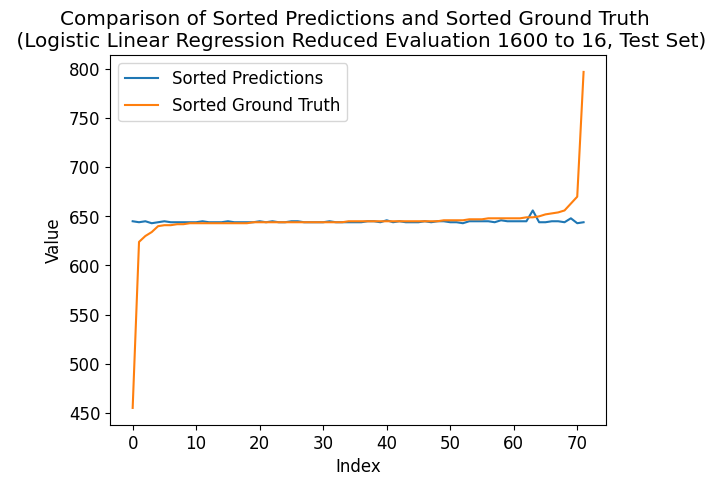

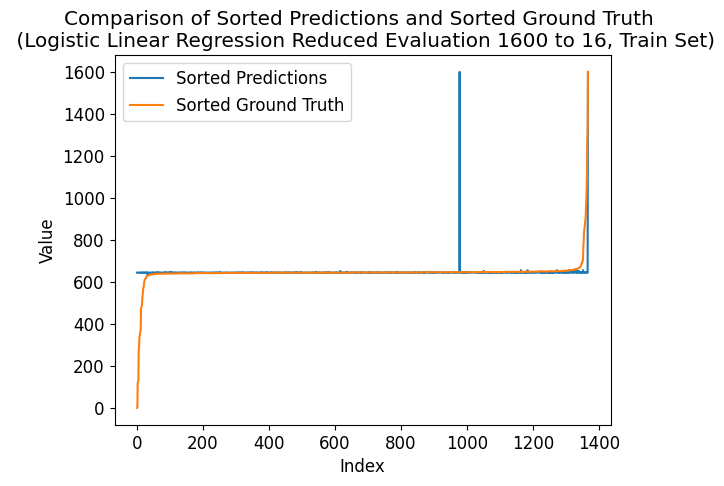

In [166]:
# independent data
x = group_satcked_green
# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max

print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

reduced_class_num = 16
class_num_array = np.arange(reduced_class_num, reduced_class_num * 100 + 1, reduced_class_num)
# class_num_array = np.arange(reduced_class_num * 5, reduced_class_num * 40 + 1, reduced_class_num)
mse_test_list = []
correlation_test_list = []
r_squared_test_list = []
mse_train_list = []
correlation_train_list = []
r_squared_train_list = []

for class_num in class_num_array:
    print('---- ---- ----')
    print(f'class_num = {class_num}')

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)

    # Generate class_num+1 evenly spaced intervals
    intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
    # print(intervals)
    # Digitize the array to get the indices of the intervals
    y_train = np.digitize(y_train, intervals) - 1
    y_test = np.digitize(y_test, intervals) - 1

    # to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
    unique_elements = np.unique(y_train)
    # print("Unique elements:", unique_elements)
    print("Number of unique elements:", len(unique_elements))

    model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
    fit_result = model.fit(x_train, y_train)

    y_pred = model.predict(x_test)
    y_pred_ = model.predict(x_train)

    # Define the boundaries for digitization
    intervals = np.arange(0, class_num+1, class_num/16)
    print(intervals)

    y_train_digital = np.digitize(y_train, intervals) - 1
    y_test_digital = np.digitize(y_test, intervals) - 1
    y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
    y_pred_test_digital = np.digitize(y_pred, intervals) - 1
    # print(y_pred)
    # print(y_pred_test_digital)
    print("test eval:")
    mse = mean_squared_error(y_test_digital, y_pred_test_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_test_digital, y_pred_test_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_test_list.append(mse)
    correlation_test_list.append(correlation)
    r_squared_test_list.append(r_squared)

    print("train eval:")
    mse = mean_squared_error(y_train_digital, y_pred_train_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_train_digital, y_pred_train_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_train_list.append(mse)
    correlation_train_list.append(correlation)
    r_squared_train_list.append(r_squared)

    plot_comparison(y_test, y_pred, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Test Set')
    plot_comparison(y_train, y_pred_, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Train Set')



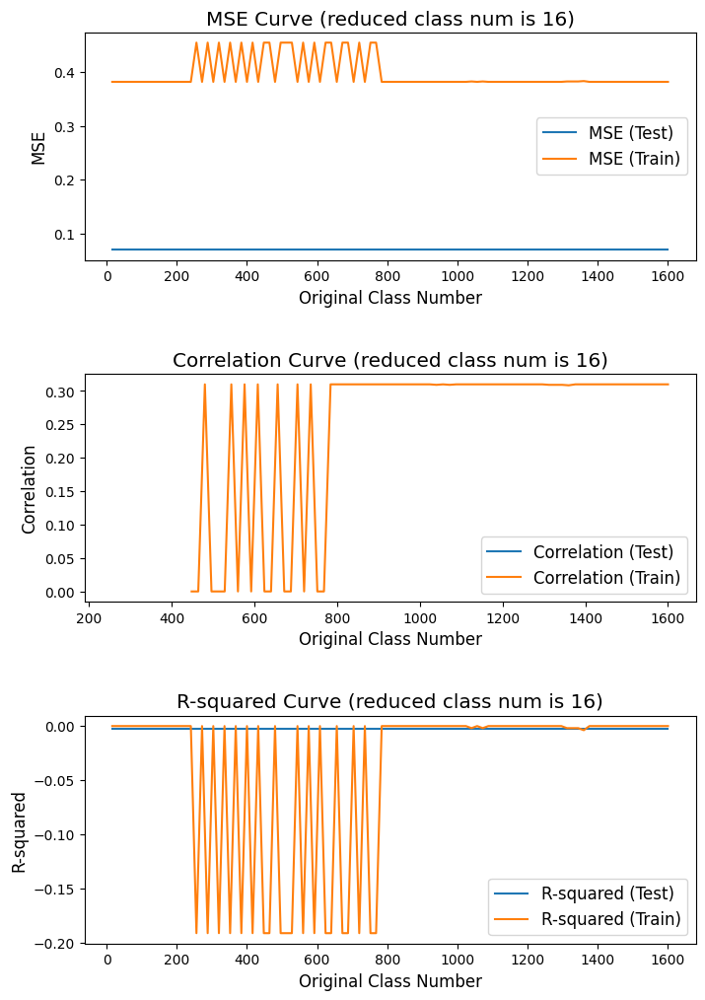

Max Index: 0
Max Original Class Num: 16


In [167]:
# plot the trend figures of mse, correlation, and r2

# Create a figure and subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 12))

# Plot MSE
ax1.plot(class_num_array, mse_test_list, label='MSE (Test)')
ax1.plot(class_num_array, mse_train_list, label='MSE (Train)')
ax1.set_ylabel('MSE')
ax1.set_xlabel('Original Class Number')
ax1.set_title(f'MSE Curve (reduced class num is {reduced_class_num})')
ax1.legend()

# Plot Correlation
ax2.plot(class_num_array, correlation_test_list, label='Correlation (Test)')
ax2.plot(class_num_array, correlation_train_list, label='Correlation (Train)')
ax2.set_ylabel('Correlation')
ax2.set_xlabel('Original Class Number')
ax2.set_title(f'Correlation Curve (reduced class num is {reduced_class_num})')
ax2.legend()

# Plot R-squared
ax3.plot(class_num_array, r_squared_test_list, label='R-squared (Test)')
ax3.plot(class_num_array, r_squared_train_list, label='R-squared (Train)')
ax3.set_ylabel('R-squared')
ax3.set_xlabel('Original Class Number')
ax3.set_title(f'R-squared Curve (reduced class num is {reduced_class_num})')
ax3.legend()

# Increase the vertical spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Adjust tick, label, title, and legend font sizes
plt.rcParams.update({'font.size': 12})
ax1.tick_params(labelsize=10)
ax2.tick_params(labelsize=10)
ax3.tick_params(labelsize=10)

# Save the figure
plt.savefig(f'mse_correlation_r2_trend_curve_reduced_eval_reduced_class_num_{reduced_class_num}.png', bbox_inches='tight')

# Show the figure
plt.show()

# Convert r_squared_test_list to a NumPy array
r_squared_test_array = np.array(r_squared_test_list)
# Find the index of the maximum value
max_index = np.argmax(r_squared_test_array)
# Get the corresponding class_num value
max_class_num = class_num_array[max_index]

# Print the index and corresponding class_num
print("Max Index:", max_index)
print("Max Original Class Num:", max_class_num)

#### Fit and predict (balanced weights)

balanced weights don't improve the fitting, but make it worse.

In [168]:
# independent data
x = group_satcked_green

class_num = 48

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))

x_train shape: (1368, 14)
y_train shape: (1368,)
x_test shape: (72, 14)
y_test shape: (72,)
Unique elements: [ 0  3  4  8  9 10 11 14 15 16 17 18 19 20 21 23 25 26 27 28 29 31 33 38
 39 48]
Number of unique elements: 26


In [169]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, class_weight='balanced', multi_class='multinomial')
fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)
# Print the predicted class labels
print(y_pred, y_test)
print(y_pred.shape, y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(26,) (26, 14)
[25 25 17  0 17 31 28 31  0 11  9 17 21 31 29 31 19  0 19 28 33  0 17  0
  0 31 10  9 29  0 19 19 23  0 29  9 19 31 26 31  3 10 29 11 26 17  0 29
 17 21 14 19 17 14 17  9 16  0  8 19  0 19  9 10 10 39  3 33 23  8 28 26] [19 20 19 19 19 13 19 19 19 19 19 19 19 19 19 19 18 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 18 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 23 19 19 19 19 19 19 19 19 19 19 19 19 19]
(72,) (72,)


#### Evaluate (balanced weights)

Accuracy: 0.09722222222222222
Correlation coefficient: -0.1864779708136692


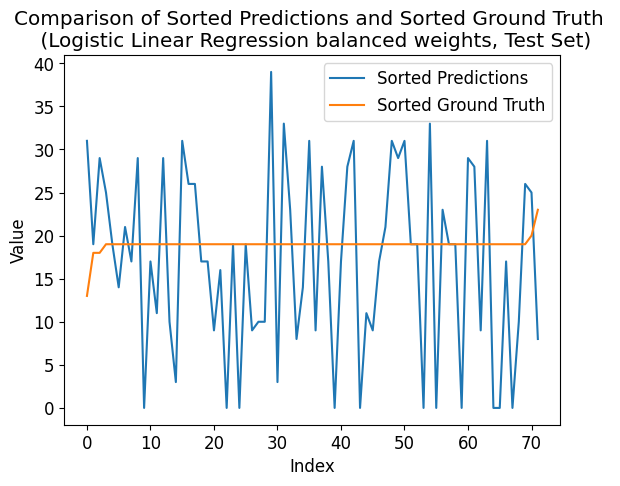

In [170]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_test, y_pred)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)


plot_comparison(y_test, y_pred, 'Logistic Linear Regression balanced weights, Test Set')


Accuracy: 0.0891812865497076
Correlation coefficient: 0.13882124097107862


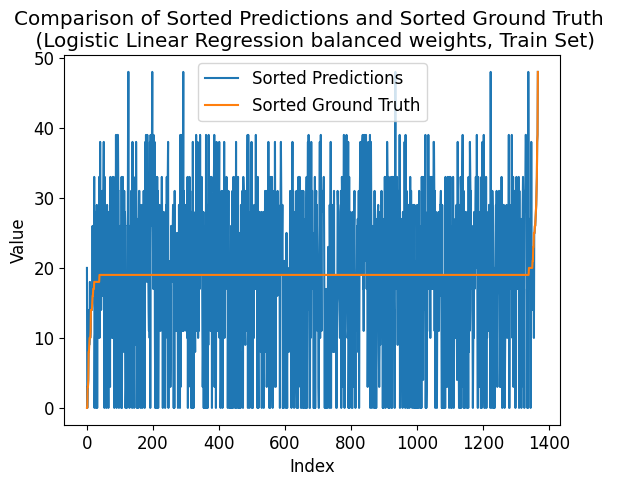

In [171]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_train, y_pred_)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)


plot_comparison(y_train, y_pred_, 'Logistic Linear Regression balanced weights, Train Set')
